  <font color='green' size=5> Capstone Project </font> 

**Capstone** <br>
**ANLT 282** <br>
**Apr 14, 2019** <br>
<br>

<font color='green' size=4> By: Ali Taheri</font>

## Incoming Deposits

In [2359]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import math
from matplotlib.gridspec import GridSpec
from minisom import MiniSom 
from datetime import datetime
from functools import reduce

import locale
locale.setlocale( locale.LC_ALL, 'en_US.UTF-8' ) 

pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

epochs = 20000
threshold= 3

pile_1_risk = .05
pile_2_risk = .45
pile_3_risk = .95

con_coef= .6
cat_coef= .2
con_act_coef , cat_act_coef= .1 , .1

In [2360]:
#import data sets into pandas dataframes and view the first 5 rows

#incoming deposit file 1
income1_df = pd.read_csv('UofP_HutleyAnalytics_IncomingDeposits022019_DataSet1_Binary.csv')

income1_df.head()

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3020: DtypeWarning: Columns (5) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,Review Id,Creat Ts,Cntry Id,Acct ID Anonymized,Pttrn Id,Cntry Key Id2,Bindg Nm,Value Tx,Scnro Short Nm,Actvy Type Desc Tx,Unnamed: 10,Unnamed: 11
0,"3,993,386",1/29/16 0:00,"104,000,004",12922082593,368,34122467,ACCT_CT,3,Incoming Transactions,Action Withheld,NaN,NaN
1,"3,993,386",1/29/16 0:00,"104,000,004",12922082593,368,34122467,ACCT_CT,3,Incoming Transactions,Action Withheld,NaN,NaN
2,"3,993,386",1/29/16 0:00,"104,000,004",12922082593,368,34122467,DEPST_AM,131352.66,Incoming Transactions,Action Withheld,NaN,NaN
3,"3,993,386",1/29/16 0:00,"104,000,004",12922082593,368,34122467,DEPST_AM,235535.41,Incoming Transactions,Action Withheld,NaN,NaN
4,"3,993,386",1/29/16 0:00,"104,000,004",12922082593,368,34122467,DEPST_CT,7,Incoming Transactions,Action Withheld,NaN,NaN


In [405]:
income1_df=income1_df.drop(['Cntry Key Id2','Unnamed: 10', 'Unnamed: 11'], axis=1)
print(income1_df.shape)
income1_df.head()

(299998, 9)


,Review Id,Creat Ts,Cntry Id,Acct ID Anonymized,Pttrn Id,Bindg Nm,Value Tx,Scnro Short Nm,Actvy Type Desc Tx
0,"3,993,386",1/29/16 0:00,"104,000,004",12922082593,368,ACCT_CT,3,Incoming Transactions,Action Withheld
1,"3,993,386",1/29/16 0:00,"104,000,004",12922082593,368,ACCT_CT,3,Incoming Transactions,Action Withheld
2,"3,993,386",1/29/16 0:00,"104,000,004",12922082593,368,DEPST_AM,131352.66,Incoming Transactions,Action Withheld
3,"3,993,386",1/29/16 0:00,"104,000,004",12922082593,368,DEPST_AM,235535.41,Incoming Transactions,Action Withheld
4,"3,993,386",1/29/16 0:00,"104,000,004",12922082593,368,DEPST_CT,7,Incoming Transactions,Action Withheld


In [406]:
#incoming deposit file 2
income2_df = pd.read_csv('UofP_HutleyAnalytics_IncomingDeposits022019_DataSet2_Binary.csv')
print(income2_df.shape)
income2_df.head(3)

(225519, 12)


,Review Id,Creat Ts,Cntry Id,Acct ID Anonymized,Pttrn Id,Cntry Key Id2,Bindg Nm,Value Tx,Scnro Short Nm,Actvy Type Desc Tx,Unnamed: 10,Unnamed: 11
0,"4,367,608",6/30/17 0:00,"104,000,001",19543148474,"8,000,362",83600785,DOMAIN,Brokerage,Incoming Transactions,Action Withheld,NaN,NaN
1,"4,367,608",6/30/17 0:00,"104,000,001",19543148474,"8,000,362",83600785,PATTERN,Existing HH - 6 Month,Incoming Transactions,Action Withheld,NaN,NaN
2,"4,367,609",6/30/17 0:00,"104,000,001",55656990909,"8,000,362",42037666,ACCT_CT,13,Incoming Transactions,Action Withheld,NaN,NaN


In [407]:
income2_df=income2_df.drop(['Cntry Key Id2','Unnamed: 10', 'Unnamed: 11'], axis=1)
print(income2_df.shape)
income2_df.head()

(225519, 9)


,Review Id,Creat Ts,Cntry Id,Acct ID Anonymized,Pttrn Id,Bindg Nm,Value Tx,Scnro Short Nm,Actvy Type Desc Tx
0,"4,367,608",6/30/17 0:00,"104,000,001",19543148474,"8,000,362",DOMAIN,Brokerage,Incoming Transactions,Action Withheld
1,"4,367,608",6/30/17 0:00,"104,000,001",19543148474,"8,000,362",PATTERN,Existing HH - 6 Month,Incoming Transactions,Action Withheld
2,"4,367,609",6/30/17 0:00,"104,000,001",55656990909,"8,000,362",ACCT_CT,13,Incoming Transactions,Action Withheld
3,"4,367,609",6/30/17 0:00,"104,000,001",55656990909,"8,000,362",DEPST_AM,9618682.83,Incoming Transactions,Action Withheld
4,"4,367,609",6/30/17 0:00,"104,000,001",55656990909,"8,000,362",DEPST_CT,319,Incoming Transactions,Action Withheld


In [408]:
df=pd.concat([income1_df, income2_df])
del income1_df , income2_df
print(df.shape)
df.head()

(525517, 9)


,Review Id,Creat Ts,Cntry Id,Acct ID Anonymized,Pttrn Id,Bindg Nm,Value Tx,Scnro Short Nm,Actvy Type Desc Tx
0,"3,993,386",1/29/16 0:00,"104,000,004",12922082593,368,ACCT_CT,3,Incoming Transactions,Action Withheld
1,"3,993,386",1/29/16 0:00,"104,000,004",12922082593,368,ACCT_CT,3,Incoming Transactions,Action Withheld
2,"3,993,386",1/29/16 0:00,"104,000,004",12922082593,368,DEPST_AM,131352.66,Incoming Transactions,Action Withheld
3,"3,993,386",1/29/16 0:00,"104,000,004",12922082593,368,DEPST_AM,235535.41,Incoming Transactions,Action Withheld
4,"3,993,386",1/29/16 0:00,"104,000,004",12922082593,368,DEPST_CT,7,Incoming Transactions,Action Withheld


In [409]:
df.duplicated().sum()

63481

In [410]:
df=df.drop_duplicates()
df.shape

(462036, 9)

In [411]:
df['Review Id']=df['Review Id'].apply(locale.atoi)
df['Creat Ts']=df['Creat Ts'].apply(lambda x: datetime.strptime(x, "%m/%d/%y %H:%M"))
df.head()

,Review Id,Creat Ts,Cntry Id,Acct ID Anonymized,Pttrn Id,Bindg Nm,Value Tx,Scnro Short Nm,Actvy Type Desc Tx
0,3993386,2016-01-29,"104,000,004",12922082593,368,ACCT_CT,3,Incoming Transactions,Action Withheld
2,3993386,2016-01-29,"104,000,004",12922082593,368,DEPST_AM,131352.66,Incoming Transactions,Action Withheld
3,3993386,2016-01-29,"104,000,004",12922082593,368,DEPST_AM,235535.41,Incoming Transactions,Action Withheld
4,3993386,2016-01-29,"104,000,004",12922082593,368,DEPST_CT,7,Incoming Transactions,Action Withheld
5,3993386,2016-01-29,"104,000,004",12922082593,368,DEPST_CT,20,Incoming Transactions,Action Withheld


In [412]:
df['Scnro Short Nm'].value_counts()

Incoming Transactions    435979
Chng of Acct Bhvr         26057
Name: Scnro Short Nm, dtype: int64

In [413]:
#separation of different scenarios
remained_chng_act_in_income= df[df['Scnro Short Nm'] == 'Chng of Acct Bhvr']
df=df[df['Scnro Short Nm'] == 'Incoming Transactions']

In [414]:
df['Scnro Short Nm'].value_counts()

Incoming Transactions    435979
Name: Scnro Short Nm, dtype: int64

In [415]:
df=df[df['Acct ID Anonymized'] != '#VALUE!']
df.shape

(412577, 9)

In [416]:
df.isna().sum()

Review Id               0
Creat Ts                0
Cntry Id                0
Acct ID Anonymized      0
Pttrn Id              265
Bindg Nm                0
Value Tx                0
Scnro Short Nm          0
Actvy Type Desc Tx      0
dtype: int64

In [417]:
df[df['Pttrn Id'].isna()].head(5)

,Review Id,Creat Ts,Cntry Id,Acct ID Anonymized,Pttrn Id,Bindg Nm,Value Tx,Scnro Short Nm,Actvy Type Desc Tx
850,3993514,2016-01-29,"104,000,001",13934126696,NaN,ACCT_CT,1,Incoming Transactions,Action Withheld
851,3993514,2016-01-29,"104,000,001",13934126696,NaN,ACCT_CT,2,Incoming Transactions,Action Withheld
852,3993514,2016-01-29,"104,000,001",13934126696,NaN,DEPST_AM,163232.11,Incoming Transactions,Action Withheld
853,3993514,2016-01-29,"104,000,001",13934126696,NaN,DEPST_AM,176961.6,Incoming Transactions,Action Withheld
854,3993514,2016-01-29,"104,000,001",13934126696,NaN,DEPST_CT,8,Incoming Transactions,Action Withheld


In [418]:
df.sort_values(by=['Acct ID Anonymized','Creat Ts','Review Id'], inplace=True)
df=df.reset_index()
df=df.drop(['index'] , axis=1)
df=df.reindex(columns=['Acct ID Anonymized','Review Id', 'Creat Ts', 'Cntry Id','Pttrn Id',
       'Bindg Nm', 'Value Tx', 'Scnro Short Nm', 'Actvy Type Desc Tx'])
df.head()

,Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Bindg Nm,Value Tx,Scnro Short Nm,Actvy Type Desc Tx
0,1.14607E+11,4610760,2018-01-31,"104,000,004",368,ACCT_CT,1,Incoming Transactions,Action Withheld
1,1.14607E+11,4610760,2018-01-31,"104,000,004",368,DEPST_AM,483618.37,Incoming Transactions,Action Withheld
2,1.14607E+11,4610760,2018-01-31,"104,000,004",368,DEPST_CT,8,Incoming Transactions,Action Withheld
3,1.14607E+11,4610760,2018-01-31,"104,000,004",368,DOMAIN,Brokerage,Incoming Transactions,Action Withheld
4,1.14607E+11,4610760,2018-01-31,"104,000,004",368,PATTERN,Existing HH - 1 Month,Incoming Transactions,Action Withheld


In [419]:
df.shape

(412577, 9)

In [420]:
df['Pttrn Id'].value_counts()

368          271419
8,000,363     59670
8,000,362     41155
591           40068
Name: Pttrn Id, dtype: int64

In [421]:
df['Actvy Type Desc Tx'].value_counts()

Close and Suppress 3 months    176833
Action Withheld                138802
Suppressed                      93599
Case Opened                      2170
SAR Filed                        1080
Close and Suppress 6 months        68
CTR Filed                          20
Referred for Review                 5
Name: Actvy Type Desc Tx, dtype: int64

In [422]:
df[df.groupby(['Review Id'])['Acct ID Anonymized'].transform('nunique') > 1]


,Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Bindg Nm,Value Tx,Scnro Short Nm,Actvy Type Desc Tx


In [423]:
df['Bindg Nm'].unique()

array(['ACCT_CT', 'DEPST_AM', 'DEPST_CT', 'DOMAIN', 'PATTERN'],
      dtype=object)

In [424]:
not_meaningful ={'Count_Xactn_Typ', 'FCAL_NTITY_RISK_NB', 'OPP_SIDE_FL' ,'XACTN_RISK_NB' }

In [425]:
df=df[df['Bindg Nm'].apply(lambda bindg_name: bindg_name not in not_meaningful)].reset_index()
df=df.drop(['index'] , axis=1)
df.head()

,Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Bindg Nm,Value Tx,Scnro Short Nm,Actvy Type Desc Tx
0,1.14607E+11,4610760,2018-01-31,"104,000,004",368,ACCT_CT,1,Incoming Transactions,Action Withheld
1,1.14607E+11,4610760,2018-01-31,"104,000,004",368,DEPST_AM,483618.37,Incoming Transactions,Action Withheld
2,1.14607E+11,4610760,2018-01-31,"104,000,004",368,DEPST_CT,8,Incoming Transactions,Action Withheld
3,1.14607E+11,4610760,2018-01-31,"104,000,004",368,DOMAIN,Brokerage,Incoming Transactions,Action Withheld
4,1.14607E+11,4610760,2018-01-31,"104,000,004",368,PATTERN,Existing HH - 1 Month,Incoming Transactions,Action Withheld


In [426]:
discrete = {'TRAN_CT','Count_Acct','Total_Count','DEPST_CT','ACCT_CT' ,'CURR_MTH_CT', 'PRIOR_MAX_CT', \
            'TOT_Credit_Count', 'TOT_Debit_Count','TRANS_CT','AGG_XACTN_RISK_NB'}

continous= {'TRAN_AM','TRANS_AM','DEPST_AM','CURR_MTH_AM', 'PRIOR_MAX_AM','TOT_Credit_Amt','TOT_Debit_Amt' }

string = {'CNTRY_CD','ACCT_TYPE','ALERT_TYPE','BUS_DMN_TX', 'DOMAIN', 'HIGH_RISK_SCORE','PATTERN' ,'SRC_SYS_CD','EXCTN_DATE'}


In [427]:
discrete_rows = df['Bindg Nm'].apply(lambda bindg_name: bindg_name in discrete)
continous_rows = df['Bindg Nm'].apply(lambda bindg_name: bindg_name in continous)
string_rows = df['Bindg Nm'].apply(lambda bindg_name: bindg_name in string)
#date_rows= df['Bindg Nm'].apply(lambda bindg_name: bindg_name in dates)

df.loc[discrete_rows,'Value Tx'] = df.loc[discrete_rows,'Value Tx'].astype(int)
df.loc[continous_rows,'Value Tx'] = df.loc[continous_rows,'Value Tx'].astype(float)
df.loc[string_rows,'Value Tx'] = df.loc[string_rows,'Value Tx'].astype(str)
#df.loc[date_rows,'Value Tx']=df.loc[date_rows,'Value Tx'].apply(lambda x: pd.to_datetime(x))

In [428]:
temp=df.copy()
temp=temp.groupby(['Acct ID Anonymized','Review Id', 'Creat Ts', 'Cntry Id',  'Pttrn Id',
       'Bindg Nm','Scnro Short Nm' ,'Value Tx']).agg({'Actvy Type Desc Tx': set}).reset_index()

In [429]:
temp['Actvy Type Desc Tx'].value_counts()

{Close and Suppress 3 months}                                 172660
{Action Withheld}                                             134367
{Suppressed}                                                   93594
{Action Withheld, Close and Suppress 3 months}                  3946
{SAR Filed, Case Opened}                                         944
{Case Opened}                                                    868
{Action Withheld, Case Opened}                                   134
{Close and Suppress 3 months, Case Opened}                        88
{Action Withheld, SAR Filed, Case Opened}                         86
{Close and Suppress 3 months, Close and Suppress 6 months}        68
{SAR Filed, Close and Suppress 3 months, Case Opened}             45
{CTR Filed, Close and Suppress 3 months}                          15
{Suppressed, Close and Suppress 3 months}                          5
{Referred for Review, Case Opened}                                 5
{CTR Filed, Action Withheld}      

In [430]:
temp[temp.groupby(['Review Id'])['Actvy Type Desc Tx'].transform('nunique') > 1]

,Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Bindg Nm,Scnro Short Nm,Value Tx,Actvy Type Desc Tx


In [431]:
df=df.groupby(['Acct ID Anonymized','Review Id', 'Creat Ts', 'Cntry Id',  'Pttrn Id',
       'Bindg Nm','Scnro Short Nm']).agg({'Value Tx': set}).reset_index()
df

,Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Bindg Nm,Scnro Short Nm,Value Tx
0,1.14607E+11,4610760,2018-01-31,"104,000,004",368,ACCT_CT,Incoming Transactions,{1}
1,1.14607E+11,4610760,2018-01-31,"104,000,004",368,DEPST_AM,Incoming Transactions,{483618.37}
2,1.14607E+11,4610760,2018-01-31,"104,000,004",368,DEPST_CT,Incoming Transactions,{8}
3,1.14607E+11,4610760,2018-01-31,"104,000,004",368,DOMAIN,Incoming Transactions,{Brokerage}
4,1.14607E+11,4610760,2018-01-31,"104,000,004",368,PATTERN,Incoming Transactions,{Existing HH - 1 Month}
5,1.18666E+11,4613142,2018-01-31,"104,000,004",368,ACCT_CT,Incoming Transactions,{1}
6,1.18666E+11,4613142,2018-01-31,"104,000,004",368,DEPST_AM,Incoming Transactions,{110534.66}
7,1.18666E+11,4613142,2018-01-31,"104,000,004",368,DEPST_CT,Incoming Transactions,{12}
8,1.18666E+11,4613142,2018-01-31,"104,000,004",368,DOMAIN,Incoming Transactions,{Brokerage}
9,1.18666E+11,4613142,2018-01-31,"104,000,004",368,PATTERN,Incoming Transactions,{Existing HH - 1 Month}


In [432]:
df = pd.merge(df,
                 temp[['Review Id', 'Actvy Type Desc Tx']].drop_duplicates(subset=['Review Id']),
                 on='Review Id')
del temp
df.head()

,Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Bindg Nm,Scnro Short Nm,Value Tx,Actvy Type Desc Tx
0,1.14607E+11,4610760,2018-01-31,"104,000,004",368,ACCT_CT,Incoming Transactions,{1},{Action Withheld}
1,1.14607E+11,4610760,2018-01-31,"104,000,004",368,DEPST_AM,Incoming Transactions,{483618.37},{Action Withheld}
2,1.14607E+11,4610760,2018-01-31,"104,000,004",368,DEPST_CT,Incoming Transactions,{8},{Action Withheld}
3,1.14607E+11,4610760,2018-01-31,"104,000,004",368,DOMAIN,Incoming Transactions,{Brokerage},{Action Withheld}
4,1.14607E+11,4610760,2018-01-31,"104,000,004",368,PATTERN,Incoming Transactions,{Existing HH - 1 Month},{Action Withheld}


In [433]:
df.reset_index()
df=df.reindex(columns=['Acct ID Anonymized','Review Id', 'Creat Ts', 'Cntry Id','Pttrn Id',
       'Bindg Nm', 'Value Tx', 'Scnro Short Nm', 'Actvy Type Desc Tx'])
df.head()

,Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Bindg Nm,Value Tx,Scnro Short Nm,Actvy Type Desc Tx
0,1.14607E+11,4610760,2018-01-31,"104,000,004",368,ACCT_CT,{1},Incoming Transactions,{Action Withheld}
1,1.14607E+11,4610760,2018-01-31,"104,000,004",368,DEPST_AM,{483618.37},Incoming Transactions,{Action Withheld}
2,1.14607E+11,4610760,2018-01-31,"104,000,004",368,DEPST_CT,{8},Incoming Transactions,{Action Withheld}
3,1.14607E+11,4610760,2018-01-31,"104,000,004",368,DOMAIN,{Brokerage},Incoming Transactions,{Action Withheld}
4,1.14607E+11,4610760,2018-01-31,"104,000,004",368,PATTERN,{Existing HH - 1 Month},Incoming Transactions,{Action Withheld}


In [434]:
df['Actvy Type Desc Tx']=df['Actvy Type Desc Tx'].apply(lambda x: list(x)[0] if (len(x) == 1) else x)

In [435]:
df['Value Tx']=df['Value Tx'].apply(lambda x: list(x)[0] if (len(x) == 1) else x)

In [436]:
value_bindname_rows= df['Bindg Nm'].apply(lambda x: (x in discrete) | (x in continous))

In [437]:
df.loc[value_bindname_rows , 'Value Tx'] = df.loc[value_bindname_rows , 'Value Tx']. \
                                                                      apply(lambda x: max(x) if type(x)== set else x)

In [438]:
df[df['Value Tx'].apply(lambda x: type(x) == set)]['Bindg Nm'].value_counts()

PATTERN    5367
DOMAIN      338
Name: Bindg Nm, dtype: int64

In [439]:
df[ (df['Bindg Nm'] == 'PATTERN') & (df['Value Tx']. \
                                                   apply(lambda x: type(x) == set))]['Value Tx'].value_counts()

{Existing HH - 1 Month, Existing HH - 3 Month}    4426
{Existing HH - 6 Month, Existing HH - 1 Month}     941
Name: Value Tx, dtype: int64

In [440]:
set_patterns = (df['Bindg Nm'] == 'PATTERN') & (df['Value Tx'].apply(lambda x: type(x) == set))

In [441]:
df.loc[set_patterns , 'Value Tx'] = df.loc[set_patterns , 'Value Tx']. \
   apply(lambda x: 'Existing HH - 6 Month' if ('Existing HH - 6 Month' in x) else \
                   'Existing HH - 3 Month' if ('Existing HH - 3 Month' in x) else x)

In [442]:
df.loc[set_patterns].head()

,Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Bindg Nm,Value Tx,Scnro Short Nm,Actvy Type Desc Tx
34,1.52284E+17,4060098,2016-04-29,"104,000,004",368,PATTERN,Existing HH - 3 Month,Incoming Transactions,Action Withheld
109,10002627310,4342961,2017-05-31,"104,000,004",368,PATTERN,Existing HH - 3 Month,Incoming Transactions,Close and Suppress 3 months
179,10003822282,4711753,2018-05-31,"104,000,004",591,PATTERN,Existing HH - 3 Month,Incoming Transactions,Close and Suppress 3 months
264,10008504618,4528564,2017-10-31,"104,000,004",368,PATTERN,Existing HH - 3 Month,Incoming Transactions,Action Withheld
339,10015059937,4635111,2018-02-28,"104,000,004",368,PATTERN,Existing HH - 3 Month,Incoming Transactions,Close and Suppress 3 months


In [443]:
set_domains = (df['Bindg Nm'] == 'DOMAIN') & (df['Value Tx'].apply(lambda x: type(x) == set))

In [444]:
df[set_domains]['Value Tx'].value_counts()

{Brokerage/Bank, Bank}         314
{Brokerage, Brokerage/Bank}     24
Name: Value Tx, dtype: int64

In [445]:
df.loc[set_domains , 'Value Tx'] = df.loc[set_domains , 'Value Tx']. \
   apply(lambda x: 'Brokerage/Bank' if ('Brokerage/Bank' in x) else x)

In [446]:
df.loc[set_domains].head()

,Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Bindg Nm,Value Tx,Scnro Short Nm,Actvy Type Desc Tx
808,10045244538,4577702,2017-12-29,"104,000,004",368,DOMAIN,Brokerage/Bank,Incoming Transactions,Suppressed
1678,10090912514,4184406,2016-10-31,"104,000,004",368,DOMAIN,Brokerage/Bank,Incoming Transactions,Close and Suppress 3 months
2923,10174146859,4224915,2016-12-30,"104,000,004",368,DOMAIN,Brokerage/Bank,Incoming Transactions,Close and Suppress 3 months
3058,10179390826,4577327,2017-12-29,"104,000,001","8,000,362",DOMAIN,Brokerage/Bank,Incoming Transactions,Close and Suppress 3 months
3063,10179390826,4577752,2017-12-29,"104,000,004",368,DOMAIN,Brokerage/Bank,Incoming Transactions,Suppressed


In [447]:
df[df['Value Tx'].apply(lambda x: type(x) == set)]['Bindg Nm'].value_counts()

Series([], Name: Bindg Nm, dtype: int64)

In [448]:
df['Actvy Type Desc Tx'].value_counts()

Close and Suppress 3 months                                   164320
Action Withheld                                               131270
Suppressed                                                     88495
{Action Withheld, Close and Suppress 3 months}                  3740
{SAR Filed, Case Opened}                                         880
Case Opened                                                      820
{Action Withheld, Case Opened}                                   125
{Close and Suppress 3 months, Case Opened}                        85
{Action Withheld, SAR Filed, Case Opened}                         80
{Close and Suppress 3 months, Close and Suppress 6 months}        65
{SAR Filed, Close and Suppress 3 months, Case Opened}             45
{CTR Filed, Close and Suppress 3 months}                          15
{Suppressed, Close and Suppress 3 months}                          5
{Referred for Review, Case Opened}                                 5
{CTR Filed, Action Withheld}      

In [449]:
Actvy_pile_1={'Auto-Closed', 'Action Withheld','Suppressed','Close and Suppress 3 months','Close and Suppress 6 months'}
Actvy_pile_2={'Case Opened'}
Actvy_pile_3={'CTR Filed','Referred for Review','SAR Filed'}

In [450]:
set_Actvys = df['Actvy Type Desc Tx'].apply(lambda x: type(x) == set)

In [451]:
def final_activity(set_of_activity):
    pile_3_activities= [activity for activity in set_of_activity if activity in Actvy_pile_3]
    if len(pile_3_activities) > 0:
        return pile_3_activities[0];
    elif ('Case Opened' in set_of_activity):
        return 'Case Opened';
    elif ('Close and Suppress 3 months' in set_of_activity) | ('Close and Suppress 6 months' in set_of_activity) | ('Suppressed' in set_of_activity) :
                return 'Suppressed';
    elif 'Action Withheld' in set_of_activity:
            return 'Action Withheld';
    elif 'Auto-Closed' in set_of_activity:
            return 'Auto-Closed';  

In [452]:
df.loc[set_Actvys , 'Actvy Type Desc Tx'] = df.loc[set_Actvys , 'Actvy Type Desc Tx']. \
   apply(final_activity)

In [453]:
df.loc[df['Actvy Type Desc Tx']== 'Close and Suppress 3 months', 'Actvy Type Desc Tx']= 'Suppressed'
df.loc[df['Actvy Type Desc Tx']== 'Close and Suppress 6 months', 'Actvy Type Desc Tx']= 'Suppressed'

In [454]:
df['Actvy Type Desc Tx'].value_counts()

Suppressed             256625
Action Withheld        131270
Case Opened              1030
SAR Filed                1010
CTR Filed                  20
Referred for Review         5
Name: Actvy Type Desc Tx, dtype: int64

In [455]:
df['Acct ID Anonymized'].apply(lambda x: type(x) == set).sum()

0

In [456]:
result = pd.crosstab([df['Acct ID Anonymized'] , df['Review Id'] , df['Creat Ts'] , df['Cntry Id'] , \
              df['Pttrn Id'] , df['Scnro Short Nm'] , df['Actvy Type Desc Tx']], \
            df['Bindg Nm'] , \
            values=df['Value Tx'] , \
            aggfunc='sum')

In [457]:
result.head()

,,,,,,Bindg Nm,ACCT_CT,DEPST_AM,DEPST_CT,DOMAIN,PATTERN
Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Scnro Short Nm,Actvy Type Desc Tx,,,,,
1.14607E+11,4610760,2018-01-31,"104,000,004",368,Incoming Transactions,Action Withheld,1,483618,8,Brokerage,Existing HH - 1 Month
1.18666E+11,4613142,2018-01-31,"104,000,004",368,Incoming Transactions,Action Withheld,1,110535,12,Brokerage,Existing HH - 1 Month
1.20901E+17,4664454,2018-03-29,"104,000,004",591,Incoming Transactions,Suppressed,1,210100,5,Brokerage,Existing HH - 1 Month
1.32682E+11,4578917,2017-12-29,"104,000,004",368,Incoming Transactions,Suppressed,2,65179.2,5,Bank,Existing HH - 1 Month
1.33572E+11,4226899,2016-12-30,"104,000,004",368,Incoming Transactions,Suppressed,1,1.18218e+06,21,Brokerage,Existing HH - 1 Month


In [458]:
%who DataFrame

backup_df	 cat_df	 con_df	 corr	 df	 df1	 df2	 remained_chng_act_in_income	 result	 



In [459]:
df=result.reset_index().rename_axis("", axis="columns")

In [460]:
del result

In [461]:
df.shape

(77992, 12)

In [462]:
df.isna().sum().sum()

0

In [500]:
df['Months_after_last_Trans']=df.groupby(['Acct ID Anonymized'])['Creat Ts']. \
                                          diff().fillna(0).apply(lambda x : math.ceil(x / np.timedelta64(1, 'M')))

In [502]:
df=df.reindex(columns=['Acct ID Anonymized','Review Id', 'Creat Ts', 'Cntry Id','Pttrn Id',\
    'Scnro Short Nm', 'Actvy Type Desc Tx','ACCT_CT', 'DEPST_AM', 'DEPST_CT','Months_after_last_Trans',\
                       'DOMAIN', 'PATTERN'])
df.head()

,Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Scnro Short Nm,Actvy Type Desc Tx,ACCT_CT,DEPST_AM,DEPST_CT,Months_after_last_Trans,DOMAIN,PATTERN
0,1.14607E+11,4610760,2018-01-31,"104,000,004",368,Incoming Transactions,Action Withheld,1,483618,8,0,Brokerage,Existing HH - 1 Month
1,1.18666E+11,4613142,2018-01-31,"104,000,004",368,Incoming Transactions,Action Withheld,1,110535,12,0,Brokerage,Existing HH - 1 Month
2,1.20901E+17,4664454,2018-03-29,"104,000,004",591,Incoming Transactions,Suppressed,1,210100,5,0,Brokerage,Existing HH - 1 Month
3,1.32682E+11,4578917,2017-12-29,"104,000,004",368,Incoming Transactions,Suppressed,2,65179.2,5,0,Bank,Existing HH - 1 Month
4,1.33572E+11,4226899,2016-12-30,"104,000,004",368,Incoming Transactions,Suppressed,1,1.18218e+06,21,0,Brokerage,Existing HH - 1 Month


In [505]:
df['ACCT_CT']=df['ACCT_CT'].astype('int64')
df['DEPST_AM']=df['DEPST_AM'].astype('float')
df['DEPST_CT']=df['DEPST_CT'].astype('int64')

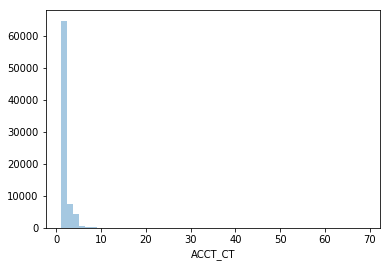

In [506]:
f, axes = plt.subplots(1, 4 ,figsize=(15, 6))
sns.distplot(df['ACCT_CT'] , kde= False ,ax=axes[0])
sns.distplot(df['DEPST_AM'] , kde= False ,ax=axes[1])
sns.distplot(df['DEPST_CT'] , kde= False ,ax=axes[2])
sns.distplot(df['Months_after_last_Trans'] , kde= False ,ax=axes[3])

In [510]:
len(df['Acct ID Anonymized'].unique())

35832

In [514]:
#threshold= 3

zscore_acct_ct=pd.Series(np.abs(stats.zscore(df['ACCT_CT'])))
zscore_depst_am=pd.Series(np.abs(stats.zscore(df['DEPST_AM'])))
zscore_depst_ct=pd.Series(np.abs(stats.zscore(df['DEPST_CT'])))
#zscore_Months_after_last_Trans =pd.Series(np.abs(stats.zscore(df['Months_after_last_Trans'])))


In [515]:
desired_records = (zscore_acct_ct < threshold) & (zscore_depst_am < threshold) & \
                  (zscore_depst_ct < threshold) #& (zscore_Days_after_last_Trans < threshold)
sum(desired_records)

76097

In [516]:
temp=df[~desired_records]

len(temp['Acct ID Anonymized'].unique()) / len(df['Acct ID Anonymized'].unique())

0.017805313686090646

In [517]:
outliers_incoming = temp['Acct ID Anonymized'].unique()
len(outliers_incoming)

638

In [518]:
df= df[desired_records].reset_index().drop(['index'] , axis=1)

In [519]:
df.shape

(76097, 13)

Text(0.5, 1.0, 'Months between Transaction')

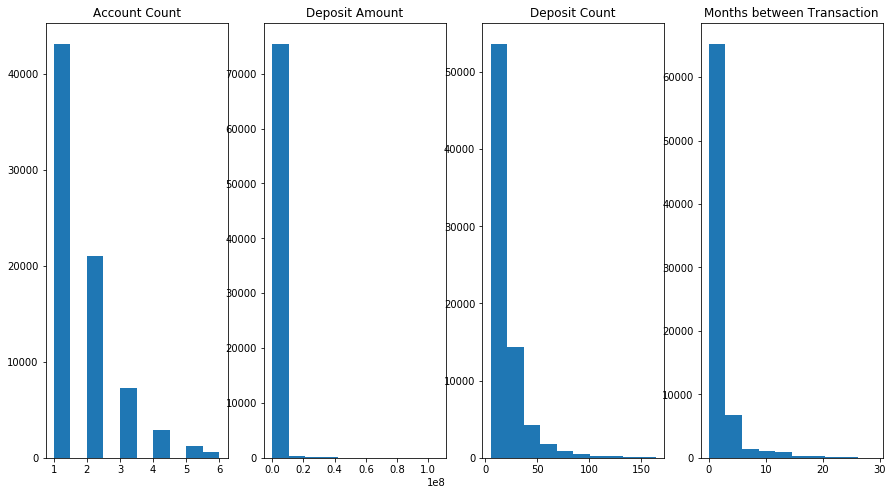

In [520]:
# Create a figure instance
fig = plt.figure(1, figsize=(15, 8))

# Create an axes instance
ax1 = fig.add_subplot(141)
ax2 = fig.add_subplot(142)
ax3 = fig.add_subplot(143)
ax4 = fig.add_subplot(144)

# Create the boxplot
ax1.hist(df['ACCT_CT'])
ax1.set_title('Account Count')

ax2.hist(df['DEPST_AM'])
ax2.set_title('Deposit Amount')

ax3.hist(df['DEPST_CT'])
ax3.set_title('Deposit Count')

ax4.hist(df['Months_after_last_Trans'])
ax4.set_title('Months between Transaction')

Text(0.5, 1.0, 'Months between Transaction')

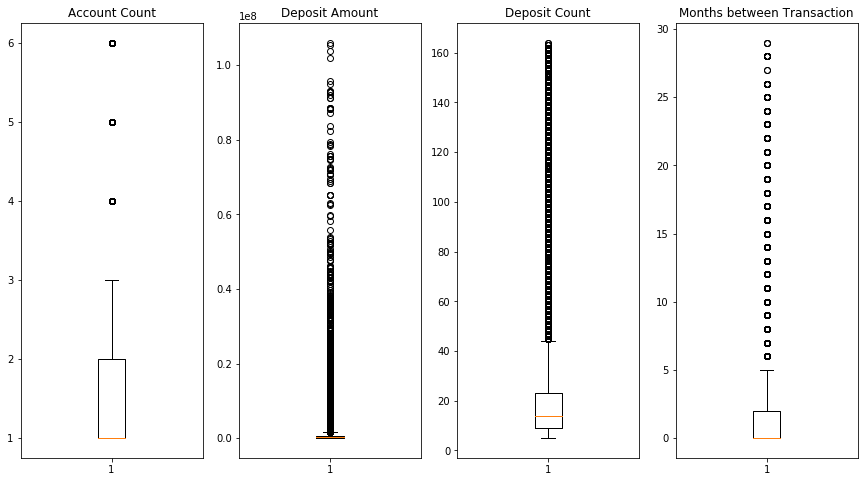

In [522]:
# Create a figure instance
fig = plt.figure(1, figsize=(15, 8))

# Create an axes instance
ax1 = fig.add_subplot(141)
ax2 = fig.add_subplot(142)
ax3 = fig.add_subplot(143)
ax4 = fig.add_subplot(144)



# Create the boxplot
ax1.boxplot(df['ACCT_CT'])
ax1.set_title('Account Count')

ax2.boxplot(df['DEPST_AM'])
ax2.set_title('Deposit Amount')

ax3.boxplot(df['DEPST_CT'])
ax3.set_title('Deposit Count')

ax4.boxplot(df['Months_after_last_Trans'])
ax4.set_title('Months between Transaction')



In [523]:
backup_incoming_df=df.copy()
df=backup_incoming_df.copy()

In [524]:
cat_columns = ["Cntry Id","Pttrn Id","DOMAIN", "PATTERN"]

In [525]:
df = pd.get_dummies(df, prefix_sep="__", columns=cat_columns)

In [526]:
%who DataFrame

backup_df	 cat_df	 con_df	 corr	 df	 df1	 df2	 remained_chng_act_in_income	 temp	 



In [527]:
del temp

In [528]:
cols=df.columns
cols

Index(['Acct ID Anonymized', 'Review Id', 'Creat Ts', 'Scnro Short Nm', 'Actvy Type Desc Tx', 'ACCT_CT', 'DEPST_AM', 'DEPST_CT', 'Months_after_last_Trans', 'Cntry Id__104,000,001', 'Cntry Id__104,000,004', 'Pttrn Id__368', 'Pttrn Id__591', 'Pttrn Id__8,000,362', 'Pttrn Id__8,000,363', 'DOMAIN__Bank', 'DOMAIN__Brokerage', 'DOMAIN__Brokerage/Bank', 'PATTERN__Existing HH - 1 Month', 'PATTERN__Existing HH - 3 Month', 'PATTERN__Existing HH - 6 Month', 'PATTERN__Foreign Resident', 'PATTERN__New Account'], dtype='object')

In [529]:
for col in cols[5:9]:
    x, y = df[col].min(), df[col].max()
    df[col] =  (df[col] - x) / (y - x)
    

In [530]:
df.describe(include ='all')

,Acct ID Anonymized,Review Id,Creat Ts,Scnro Short Nm,Actvy Type Desc Tx,ACCT_CT,DEPST_AM,DEPST_CT,Months_after_last_Trans,"Cntry Id__104,000,001","Cntry Id__104,000,004",Pttrn Id__368,Pttrn Id__591,"Pttrn Id__8,000,362","Pttrn Id__8,000,363",DOMAIN__Bank,DOMAIN__Brokerage,DOMAIN__Brokerage/Bank,PATTERN__Existing HH - 1 Month,PATTERN__Existing HH - 3 Month,PATTERN__Existing HH - 6 Month,PATTERN__Foreign Resident,PATTERN__New Account
count,76097,7.609700e+04,76097,76097,76097,76097.000000,76097.000000,76097.000000,76097.000000,76097.000000,76097.000000,76097.00000,76097.000000,76097.000000,76097.000000,76097.000000,76097.000000,76097.000000,76097.000000,76097.000000,76097.000000,76097.000000,76097.000000
unique,35421,NaN,30,1,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,23991066555,NaN,2018-04-30 00:00:00,Incoming Transactions,Suppressed,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,5176,NaN,3494,76097,50275,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
first,NaN,NaN,2016-01-29 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
last,NaN,NaN,2018-06-29 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,4.355403e+06,NaN,NaN,NaN,0.136628,0.007815,0.090984,0.047078,0.247185,0.752815,0.65586,0.096955,0.091778,0.155407,0.219089,0.467561,0.313350,0.314677,0.380685,0.142555,0.006676,0.155407
std,NaN,2.244552e+05,NaN,NaN,NaN,0.198295,0.030145,0.115586,0.096997,0.431378,0.431378,0.47509,0.295899,0.288714,0.362295,0.413632,0.498950,0.463858,0.464390,0.485559,0.349621,0.081432,0.362295
min,NaN,3.993386e+06,NaN,NaN,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,NaN,4.166159e+06,NaN,NaN,NaN,0.000000,0.001048,0.025157,0.000000,0.000000,1.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [531]:
print(df.shape)
df.head()

(76097, 23)


,Acct ID Anonymized,Review Id,Creat Ts,Scnro Short Nm,Actvy Type Desc Tx,ACCT_CT,DEPST_AM,DEPST_CT,Months_after_last_Trans,"Cntry Id__104,000,001","Cntry Id__104,000,004",Pttrn Id__368,Pttrn Id__591,"Pttrn Id__8,000,362","Pttrn Id__8,000,363",DOMAIN__Bank,DOMAIN__Brokerage,DOMAIN__Brokerage/Bank,PATTERN__Existing HH - 1 Month,PATTERN__Existing HH - 3 Month,PATTERN__Existing HH - 6 Month,PATTERN__Foreign Resident,PATTERN__New Account
0,1.14607E+11,4610760,2018-01-31,Incoming Transactions,Action Withheld,0.0,0.004094,0.018868,0.0,0,1,1,0,0,0,0,1,0,1,0,0,0,0
1,1.18666E+11,4613142,2018-01-31,Incoming Transactions,Action Withheld,0.0,0.000572,0.044025,0.0,0,1,1,0,0,0,0,1,0,1,0,0,0,0
2,1.20901E+17,4664454,2018-03-29,Incoming Transactions,Suppressed,0.0,0.001512,0.000000,0.0,0,1,0,1,0,0,0,1,0,1,0,0,0,0
3,1.32682E+11,4578917,2017-12-29,Incoming Transactions,Suppressed,0.2,0.000143,0.000000,0.0,0,1,1,0,0,0,1,0,0,1,0,0,0,0
4,1.33572E+11,4226899,2016-12-30,Incoming Transactions,Suppressed,0.0,0.010690,0.100629,0.0,0,1,1,0,0,0,0,1,0,1,0,0,0,0


In [532]:
con_var=np.array(df.iloc[:,5:9])
cat_var= np.array(df.iloc[:,9:23])

In [533]:
con_var , cat_var

(array([[0.        , 0.00409439, 0.01886792, 0.        ],
        [0.        , 0.00057159, 0.04402516, 0.        ],
        [0.        , 0.00151172, 0.        , 0.        ],
        ...,
        [0.        , 0.00056178, 0.03773585, 0.        ],
        [0.        , 0.00238196, 0.02515723, 0.        ],
        [0.        , 0.00283112, 0.04402516, 0.10344828]]),
 array([[0, 1, 1, ..., 0, 0, 0],
        [0, 1, 1, ..., 0, 0, 0],
        [0, 1, 0, ..., 0, 0, 0],
        ...,
        [0, 1, 1, ..., 0, 0, 0],
        [0, 1, 1, ..., 0, 0, 0],
        [0, 1, 0, ..., 0, 0, 0]], dtype=uint8))

In [534]:
con_var.shape , cat_var.shape

((76097, 4), (76097, 14))

In [535]:
con_som = MiniSom(40, 40, 4, sigma=10, learning_rate=0.5,neighborhood_function='gaussian', random_seed=10)
con_som.pca_weights_init(con_var)
con_som.train_random(con_var, epochs, verbose=True)

 [ 20000 / 20000 ] 100% 0.01902 it/s

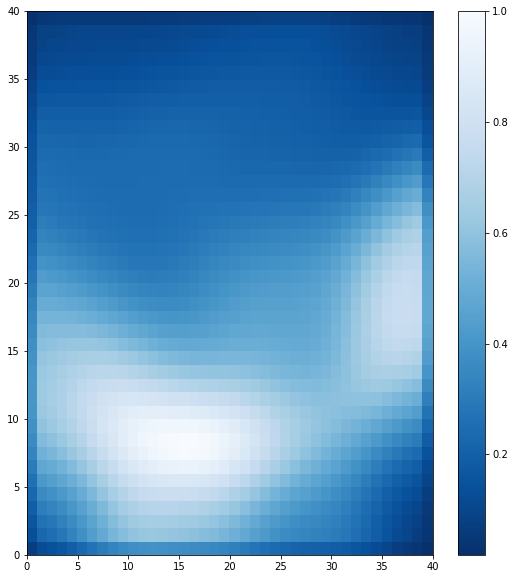

In [536]:
plt.figure(figsize=(20, 10))
# Plotting the response for each pattern in the iris dataset

plt.subplot(1, 2, 1)
plt.pcolormesh(con_som.distance_map().T, cmap='Blues_r')  # plotting the distance map as background
plt.colorbar()
#plt.subplot(1, 2, 2)
#plt.pcolormesh(sar_stat.T, cmap='Blues')
#plt.colorbar()

In [537]:
cat_som = MiniSom(40, 40, 14, sigma=10, learning_rate=0.5,neighborhood_function='gaussian', random_seed=10)
cat_som.pca_weights_init(cat_var)
cat_som.train_random(cat_var, epochs, verbose=True)

 [ 20000 / 20000 ] 100% 0.01699 it/s

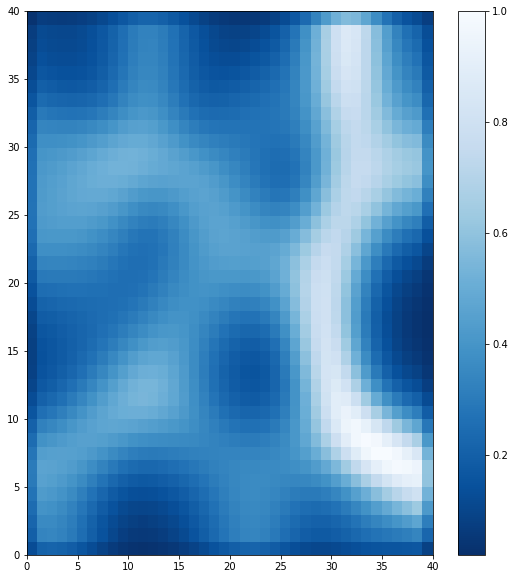

In [538]:
plt.figure(figsize=(20, 10))
# Plotting the response for each pattern in the iris dataset

plt.subplot(1, 2, 1)
plt.pcolormesh(cat_som.distance_map().T, cmap='Blues_r')  # plotting the distance map as background
plt.colorbar()
#plt.subplot(1, 2, 2)
#plt.pcolormesh(sar_stat.T, cmap='Blues')
#plt.colorbar()

In [539]:
con_mid=con_som.distance_map()
cat_mid=cat_som.distance_map()

con_mid, cat_mid

(array([[0.07095096, 0.13506279, 0.16158744, ..., 0.05408625, 0.04670174,
         0.02964724],
        [0.12387252, 0.22652479, 0.26488079, ..., 0.09087712, 0.08046714,
         0.0472314 ],
        [0.1430359 , 0.2534801 , 0.29041643, ..., 0.09613705, 0.08633564,
         0.05120088],
        ...,
        [0.05852723, 0.09575184, 0.1063976 , ..., 0.08129841, 0.07378224,
         0.04370173],
        [0.04503078, 0.07546946, 0.08637886, ..., 0.0787782 , 0.07164879,
         0.04253245],
        [0.02247464, 0.03909784, 0.04670967, ..., 0.04869238, 0.04293307,
         0.01892401]]),
 array([[0.12449349, 0.19637875, 0.21864492, ..., 0.07747166, 0.07082141,
         0.03282262],
        [0.20733274, 0.33611476, 0.35965148, ..., 0.12417556, 0.11543649,
         0.07156688],
        [0.21451593, 0.34100875, 0.3575956 , ..., 0.1153842 , 0.1072889 ,
         0.06653521],
        ...,
        [0.1608254 , 0.31628038, 0.43205877, ..., 0.2856465 , 0.2612606 ,
         0.15208075],
        [0.1

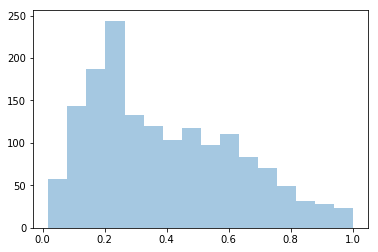

In [540]:
f, axes = plt.subplots(1, 2 ,figsize=(15, 6))
sns.distplot(con_mid.reshape(1,1600) , kde= False ,ax=axes[0])
sns.distplot(cat_mid.reshape(1,1600) , kde= False ,ax=axes[1])

In [542]:
df['Actvy Type Desc Tx'].value_counts()

Suppressed             50275
Action Withheld        25413
Case Opened              204
SAR Filed                200
CTR Filed                  4
Referred for Review        1
Name: Actvy Type Desc Tx, dtype: int64

In [543]:
Actvy_pile_1={'Auto-Closed', 'Action Withheld','Suppressed','Close and Suppress 3 months','Close and Suppress 6 months'}
Actvy_pile_2={'Case Opened'}
Actvy_pile_3={'CTR Filed','Referred for Review','SAR Filed'}

In [544]:
df['con_neuron']=df.loc[:,df.columns[5:9]].apply(lambda x: con_som.winner(np.array(np.array(x))) , axis=1)

df['con_neuron'] = df['con_neuron'].apply(lambda x: str(x))
df.head()

In [547]:
df['Actvy Type Desc Tx'].value_counts()

Suppressed             50275
Action Withheld        25413
Case Opened              204
SAR Filed                200
CTR Filed                  4
Referred for Review        1
Name: Actvy Type Desc Tx, dtype: int64

In [673]:
con_df=df.groupby(['con_neuron'])['Actvy Type Desc Tx'].value_counts().unstack().fillna(0)
con_df.index = [str(neuron) for neuron in list(con_df.index)]
con_df=con_df[['Action Withheld','Suppressed','Case Opened','Referred for Review','CTR Filed','SAR Filed']]
con_df.sort_values( by= ['SAR Filed'] , ascending= False)

Actvy Type Desc Tx,Action Withheld,Suppressed,Case Opened,Referred for Review,CTR Filed,SAR Filed
"(39, 0)",5482.0,5513.0,41.0,0.0,1.0,55.0
"(0, 39)",910.0,2710.0,10.0,0.0,1.0,14.0
"(39, 19)",1496.0,2619.0,18.0,0.0,0.0,13.0
"(0, 0)",529.0,1401.0,5.0,0.0,0.0,6.0
"(39, 3)",468.0,533.0,6.0,0.0,0.0,4.0
"(19, 39)",138.0,496.0,4.0,0.0,0.0,4.0
"(39, 6)",513.0,518.0,2.0,0.0,0.0,4.0
"(22, 39)",104.0,384.0,2.0,0.0,0.0,3.0
"(9, 39)",112.0,317.0,2.0,0.0,0.0,3.0
"(29, 39)",97.0,308.0,0.0,0.0,0.0,3.0


In [675]:
#pile_1_risk = .05
#pile_2_risk = .45
#pile_3_risk = .95

def risk(x):
    return (pile_1_risk *(sum(x[0:2])) + pile_2_risk *x[2] + pile_3_risk * sum(x[3:])) / sum(x)

In [678]:
con_df['con_act_risk']=con_df.iloc[:,0:6].apply(lambda activities_of_neuron: risk(activities_of_neuron) , axis=1)

con_df['index']=con_df.index
con_df['con_distance'] = con_df['index'].apply(lambda x: con_mid[int(x[1:-1].split(',')[0]),\
                                                                 int(x[1:-1].split(',')[1])])
con_df=con_df.drop(['index'] , axis=1)
con_df.sort_values( by= ['con_distance'] , ascending= False)

Actvy Type Desc Tx,Action Withheld,Suppressed,Case Opened,Referred for Review,CTR Filed,SAR Filed,con_act_risk,con_distance
"(15, 8)",1.0,2.0,0.0,0.0,0.0,0.0,0.050000,1.000000
"(16, 8)",0.0,2.0,0.0,0.0,0.0,1.0,0.350000,0.997977
"(14, 8)",1.0,1.0,0.0,0.0,0.0,0.0,0.050000,0.995701
"(15, 7)",1.0,0.0,0.0,0.0,0.0,0.0,0.050000,0.988526
"(16, 7)",1.0,0.0,0.0,0.0,0.0,0.0,0.050000,0.987410
"(13, 8)",1.0,1.0,0.0,0.0,0.0,0.0,0.050000,0.986082
"(14, 7)",0.0,1.0,0.0,0.0,0.0,0.0,0.050000,0.982648
"(17, 7)",0.0,1.0,0.0,0.0,0.0,0.0,0.050000,0.977961
"(12, 8)",0.0,2.0,0.0,0.0,0.0,0.0,0.050000,0.971415
"(13, 7)",0.0,2.0,0.0,0.0,0.0,0.0,0.050000,0.970822


In [679]:
df['con_distance']=con_df.loc[df['con_neuron'],'con_distance'].reset_index().drop(['index'],axis=1)

df['con_act_risk'] = con_df.loc[df['con_neuron'],'con_act_risk'].reset_index().drop(['index'],axis=1)
df.head()

,Acct ID Anonymized,Review Id,Creat Ts,Scnro Short Nm,Actvy Type Desc Tx,ACCT_CT,DEPST_AM,DEPST_CT,Months_after_last_Trans,"Cntry Id__104,000,001","Cntry Id__104,000,004",Pttrn Id__368,Pttrn Id__591,"Pttrn Id__8,000,362","Pttrn Id__8,000,363",DOMAIN__Bank,DOMAIN__Brokerage,DOMAIN__Brokerage/Bank,PATTERN__Existing HH - 1 Month,PATTERN__Existing HH - 3 Month,PATTERN__Existing HH - 6 Month,PATTERN__Foreign Resident,PATTERN__New Account,con_neuron,con_distance,con_act_risk,cat_neuron,cat_distance,cat_act_risk
0,1.14607E+11,4610760,2018-01-31,Incoming Transactions,Action Withheld,0.0,0.004094,0.018868,0.0,0,1,1,0,0,0,0,1,0,1,0,0,0,0,"(39, 10)",0.271194,0.053009,"(20, 39)",0.048530,0.302414
1,1.18666E+11,4613142,2018-01-31,Incoming Transactions,Action Withheld,0.0,0.000572,0.044025,0.0,0,1,1,0,0,0,0,1,0,1,0,0,0,0,"(39, 0)",0.022475,0.056022,"(20, 39)",0.048530,0.302414
2,1.20901E+17,4664454,2018-03-29,Incoming Transactions,Suppressed,0.0,0.001512,0.000000,0.0,0,1,0,1,0,0,0,1,0,1,0,0,0,0,"(39, 19)",0.474873,0.054559,"(26, 28)",0.271520,0.301017
3,1.32682E+11,4578917,2017-12-29,Incoming Transactions,Suppressed,0.2,0.000143,0.000000,0.0,0,1,1,0,0,0,1,0,0,1,0,0,0,0,"(0, 39)",0.029647,0.054801,"(6, 39)",0.087142,0.305688
4,1.33572E+11,4226899,2016-12-30,Incoming Transactions,Suppressed,0.0,0.010690,0.100629,0.0,0,1,1,0,0,0,0,1,0,1,0,0,0,0,"(39, 7)",0.148207,0.054995,"(20, 39)",0.048530,0.302414


In [680]:
df.isna().sum().sum()

0

In [681]:
df['cat_neuron']=df.loc[:,df.columns[9:23]].apply(lambda x: cat_som.winner(np.array(np.array(x))) , axis=1)

In [682]:
df['cat_distance']=df['cat_neuron'].apply(lambda x: cat_mid[x[0],x[1]])

In [683]:
df['cat_neuron'] = df['cat_neuron'].apply(lambda x: str(x))
df.head()

,Acct ID Anonymized,Review Id,Creat Ts,Scnro Short Nm,Actvy Type Desc Tx,ACCT_CT,DEPST_AM,DEPST_CT,Months_after_last_Trans,"Cntry Id__104,000,001","Cntry Id__104,000,004",Pttrn Id__368,Pttrn Id__591,"Pttrn Id__8,000,362","Pttrn Id__8,000,363",DOMAIN__Bank,DOMAIN__Brokerage,DOMAIN__Brokerage/Bank,PATTERN__Existing HH - 1 Month,PATTERN__Existing HH - 3 Month,PATTERN__Existing HH - 6 Month,PATTERN__Foreign Resident,PATTERN__New Account,con_neuron,con_distance,con_act_risk,cat_neuron,cat_distance,cat_act_risk
0,1.14607E+11,4610760,2018-01-31,Incoming Transactions,Action Withheld,0.0,0.004094,0.018868,0.0,0,1,1,0,0,0,0,1,0,1,0,0,0,0,"(39, 10)",0.271194,0.053009,"(20, 39)",0.048530,0.302414
1,1.18666E+11,4613142,2018-01-31,Incoming Transactions,Action Withheld,0.0,0.000572,0.044025,0.0,0,1,1,0,0,0,0,1,0,1,0,0,0,0,"(39, 0)",0.022475,0.056022,"(20, 39)",0.048530,0.302414
2,1.20901E+17,4664454,2018-03-29,Incoming Transactions,Suppressed,0.0,0.001512,0.000000,0.0,0,1,0,1,0,0,0,1,0,1,0,0,0,0,"(39, 19)",0.474873,0.054559,"(26, 28)",0.271520,0.301017
3,1.32682E+11,4578917,2017-12-29,Incoming Transactions,Suppressed,0.2,0.000143,0.000000,0.0,0,1,1,0,0,0,1,0,0,1,0,0,0,0,"(0, 39)",0.029647,0.054801,"(6, 39)",0.087142,0.305688
4,1.33572E+11,4226899,2016-12-30,Incoming Transactions,Suppressed,0.0,0.010690,0.100629,0.0,0,1,1,0,0,0,0,1,0,1,0,0,0,0,"(39, 7)",0.148207,0.054995,"(20, 39)",0.048530,0.302414


In [684]:
cat_df=df.groupby(['cat_neuron'])['Actvy Type Desc Tx'].value_counts().unstack().fillna(0)
cat_df.index = [str(neuron) for neuron in list(cat_df.index)]
cat_df=cat_df[['Action Withheld','Suppressed','Case Opened','Referred for Review','CTR Filed','SAR Filed']]
cat_df.head()

Actvy Type Desc Tx,Action Withheld,Suppressed,Case Opened,Referred for Review,CTR Filed,SAR Filed
"(0, 0)",278.0,1310.0,5.0,0.0,0.0,4.0
"(0, 12)",844.0,3759.0,8.0,0.0,0.0,8.0
"(0, 26)",880.0,2880.0,15.0,0.0,1.0,22.0
"(0, 28)",193.0,715.0,4.0,0.0,0.0,5.0
"(0, 34)",155.0,1029.0,8.0,0.0,0.0,4.0


In [686]:
cat_df['cat_act_risk']=cat_df.loc[:,:].apply(lambda activities_of_neuron: risk(activities_of_neuron) , axis=1)

cat_df['index']=cat_df.index
cat_df['cat_distance'] = cat_df['index'].apply(lambda x: cat_mid[int(x[1:-1].split(',')[0]),\
                                                                 int(x[1:-1].split(',')[1])])
cat_df=cat_df.drop(['index'] , axis=1)
cat_df.sort_values( by= ['cat_distance'] , ascending= False)


Actvy Type Desc Tx,Action Withheld,Suppressed,Case Opened,Referred for Review,CTR Filed,SAR Filed,cat_act_risk,cat_distance
"(33, 32)",185.0,396.0,0.0,0.0,0.0,2.0,0.054271,0.717341
"(34, 38)",283.0,1025.0,4.0,0.0,0.0,1.0,0.052334,0.577266
"(37, 30)",2.0,13.0,0.0,0.0,0.0,0.0,0.086054,0.575977
"(39, 7)",710.0,9.0,4.0,0.0,0.0,4.0,0.057874,0.530514
"(25, 21)",173.0,459.0,0.0,0.0,0.0,1.0,0.052229,0.517617
"(37, 31)",193.0,669.0,0.0,0.0,0.0,0.0,0.050587,0.512179
"(5, 8)",1.0,18.0,0.0,0.0,0.0,0.0,0.073051,0.449433
"(17, 20)",66.0,319.0,3.0,0.0,0.0,3.0,0.061032,0.405105
"(25, 24)",13.0,63.0,0.0,0.0,0.0,1.0,0.066909,0.393532
"(34, 39)",190.0,784.0,2.0,0.0,0.0,5.0,0.055791,0.370991


In [687]:
df['cat_distance']=cat_df.loc[df['cat_neuron'],'cat_distance'].reset_index().drop(['index'],axis=1)

df['cat_act_risk'] = cat_df.loc[df['cat_neuron'],'cat_act_risk'].reset_index().drop(['index'],axis=1)
df.head()

,Acct ID Anonymized,Review Id,Creat Ts,Scnro Short Nm,Actvy Type Desc Tx,ACCT_CT,DEPST_AM,DEPST_CT,Months_after_last_Trans,"Cntry Id__104,000,001","Cntry Id__104,000,004",Pttrn Id__368,Pttrn Id__591,"Pttrn Id__8,000,362","Pttrn Id__8,000,363",DOMAIN__Bank,DOMAIN__Brokerage,DOMAIN__Brokerage/Bank,PATTERN__Existing HH - 1 Month,PATTERN__Existing HH - 3 Month,PATTERN__Existing HH - 6 Month,PATTERN__Foreign Resident,PATTERN__New Account,con_neuron,con_distance,con_act_risk,cat_neuron,cat_distance,cat_act_risk
0,1.14607E+11,4610760,2018-01-31,Incoming Transactions,Action Withheld,0.0,0.004094,0.018868,0.0,0,1,1,0,0,0,0,1,0,1,0,0,0,0,"(39, 10)",0.271194,0.053009,"(20, 39)",0.048530,0.053499
1,1.18666E+11,4613142,2018-01-31,Incoming Transactions,Action Withheld,0.0,0.000572,0.044025,0.0,0,1,1,0,0,0,0,1,0,1,0,0,0,0,"(39, 0)",0.022475,0.056022,"(20, 39)",0.048530,0.053499
2,1.20901E+17,4664454,2018-03-29,Incoming Transactions,Suppressed,0.0,0.001512,0.000000,0.0,0,1,0,1,0,0,0,1,0,1,0,0,0,0,"(39, 19)",0.474873,0.054559,"(26, 28)",0.271520,0.051494
3,1.32682E+11,4578917,2017-12-29,Incoming Transactions,Suppressed,0.2,0.000143,0.000000,0.0,0,1,1,0,0,0,1,0,0,1,0,0,0,0,"(0, 39)",0.029647,0.054801,"(6, 39)",0.087142,0.058257
4,1.33572E+11,4226899,2016-12-30,Incoming Transactions,Suppressed,0.0,0.010690,0.100629,0.0,0,1,1,0,0,0,0,1,0,1,0,0,0,0,"(39, 7)",0.148207,0.054995,"(20, 39)",0.048530,0.053499


In [700]:
con_coef= .62
cat_coef= .28
con_act_coef , cat_act_coef= .05 , .05

In [703]:
df['Risk'] = con_coef * df['con_distance'] + cat_coef * df['cat_distance'] + \
             con_act_coef * df['con_act_risk']  + cat_act_coef * df['cat_act_risk']

df.head()

,Acct ID Anonymized,Review Id,Creat Ts,Scnro Short Nm,Actvy Type Desc Tx,ACCT_CT,DEPST_AM,DEPST_CT,Months_after_last_Trans,"Cntry Id__104,000,001","Cntry Id__104,000,004",Pttrn Id__368,Pttrn Id__591,"Pttrn Id__8,000,362","Pttrn Id__8,000,363",DOMAIN__Bank,DOMAIN__Brokerage,DOMAIN__Brokerage/Bank,PATTERN__Existing HH - 1 Month,PATTERN__Existing HH - 3 Month,PATTERN__Existing HH - 6 Month,PATTERN__Foreign Resident,PATTERN__New Account,con_neuron,con_distance,con_act_risk,cat_neuron,cat_distance,cat_act_risk,Risk
0,1.14607E+11,4610760,2018-01-31,Incoming Transactions,Action Withheld,0.0,0.004094,0.018868,0.0,0,1,1,0,0,0,0,1,0,1,0,0,0,0,"(39, 10)",0.271194,0.053009,"(20, 39)",0.048530,0.053499,0.183073
1,1.18666E+11,4613142,2018-01-31,Incoming Transactions,Action Withheld,0.0,0.000572,0.044025,0.0,0,1,1,0,0,0,0,1,0,1,0,0,0,0,"(39, 0)",0.022475,0.056022,"(20, 39)",0.048530,0.053499,0.034143
2,1.20901E+17,4664454,2018-03-29,Incoming Transactions,Suppressed,0.0,0.001512,0.000000,0.0,0,1,0,1,0,0,0,1,0,1,0,0,0,0,"(39, 19)",0.474873,0.054559,"(26, 28)",0.271520,0.051494,0.349833
3,1.32682E+11,4578917,2017-12-29,Incoming Transactions,Suppressed,0.2,0.000143,0.000000,0.0,0,1,1,0,0,0,1,0,0,1,0,0,0,0,"(0, 39)",0.029647,0.054801,"(6, 39)",0.087142,0.058257,0.046523
4,1.33572E+11,4226899,2016-12-30,Incoming Transactions,Suppressed,0.0,0.010690,0.100629,0.0,0,1,1,0,0,0,0,1,0,1,0,0,0,0,"(39, 7)",0.148207,0.054995,"(20, 39)",0.048530,0.053499,0.109480


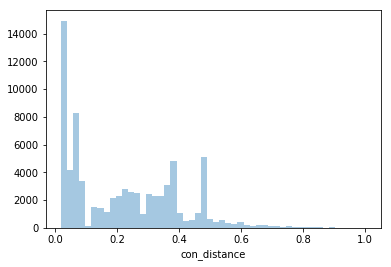

In [688]:
f, axes = plt.subplots(1, 3 ,figsize=(15, 6))
sns.distplot(df['con_distance'] , kde= False ,ax=axes[0])
sns.distplot(df['cat_distance'] , kde= False ,ax=axes[1])
sns.distplot(df['Risk'] , kde= False ,ax=axes[2])

In [705]:
backup_df.head()

,Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Scnro Short Nm,Actvy Type Desc Tx,ACCT_CT,DEPST_AM,DEPST_CT,Months_after_last_Trans,DOMAIN,PATTERN
0,1.14607E+11,4610760,2018-01-31,"104,000,004",368,Incoming Transactions,Action Withheld,1,483618.37,8,0,Brokerage,Existing HH - 1 Month
1,1.18666E+11,4613142,2018-01-31,"104,000,004",368,Incoming Transactions,Action Withheld,1,110534.66,12,0,Brokerage,Existing HH - 1 Month
2,1.20901E+17,4664454,2018-03-29,"104,000,004",591,Incoming Transactions,Suppressed,1,210100.00,5,0,Brokerage,Existing HH - 1 Month
3,1.32682E+11,4578917,2017-12-29,"104,000,004",368,Incoming Transactions,Suppressed,2,65179.23,5,0,Bank,Existing HH - 1 Month
4,1.33572E+11,4226899,2016-12-30,"104,000,004",368,Incoming Transactions,Suppressed,1,1182180.00,21,0,Brokerage,Existing HH - 1 Month


In [706]:
df.columns

Index(['Acct ID Anonymized', 'Review Id', 'Creat Ts', 'Scnro Short Nm', 'Actvy Type Desc Tx', 'ACCT_CT', 'DEPST_AM', 'DEPST_CT', 'Months_after_last_Trans', 'Cntry Id__104,000,001', 'Cntry Id__104,000,004', 'Pttrn Id__368', 'Pttrn Id__591', 'Pttrn Id__8,000,362', 'Pttrn Id__8,000,363', 'DOMAIN__Bank', 'DOMAIN__Brokerage', 'DOMAIN__Brokerage/Bank', 'PATTERN__Existing HH - 1 Month', 'PATTERN__Existing HH - 3 Month', 'PATTERN__Existing HH - 6 Month', 'PATTERN__Foreign Resident', 'PATTERN__New Account', 'con_neuron', 'con_distance', 'con_act_risk', 'cat_neuron', 'cat_distance', 'cat_act_risk', 'Risk'], dtype='object')

In [707]:
df_incoming_final= pd.merge(backup_incoming_df , df[['Review Id','con_neuron', 'con_distance', 'con_act_risk', \
                               'cat_neuron', 'cat_distance', 'cat_act_risk' ,'Risk']] , on = 'Review Id' , how= 'inner')

del backup_incoming_df

In [708]:
df_incoming_.sort_values(by= ['Risk'], ascending = False)

,Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Scnro Short Nm,Actvy Type Desc Tx,ACCT_CT,DEPST_AM,DEPST_CT,Months_after_last_Trans,DOMAIN,PATTERN,con_neuron,con_distance,con_act_risk,cat_neuron,cat_distance,cat_act_risk,Risk
26713,20669680188,4187603,2016-10-31,"104,000,001","8,000,362",Incoming Transactions,Action Withheld,2,1397981.17,46,9,Brokerage,Existing HH - 3 Month,"(14, 8)",0.995701,0.050000,"(34, 38)",0.577266,0.052334,0.723107
27996,21372954268,4427150,2017-09-29,"104,000,001","8,000,362",Incoming Transactions,Action Withheld,2,793379.62,62,12,Brokerage,Existing HH - 6 Month,"(14, 6)",0.930623,0.500000,"(37, 31)",0.512179,0.050587,0.715868
17440,16323717864,4143365,2016-08-31,"104,000,001","8,000,362",Incoming Transactions,Suppressed,2,2773859.19,38,7,Brokerage,Existing HH - 3 Month,"(14, 9)",0.964196,0.050000,"(34, 38)",0.577266,0.052334,0.704204
9393,13001760353,4168407,2016-09-30,"104,000,004",368,Incoming Transactions,Suppressed,2,787153.07,46,7,Brokerage,Existing HH - 6 Month,"(16, 8)",0.997977,0.350000,"(13, 23)",0.293328,0.053102,0.697762
46607,34406994818,4225573,2016-12-30,"104,000,001","8,000,362",Incoming Transactions,Suppressed,2,4075672.30,62,7,Brokerage,Existing HH - 6 Month,"(18, 8)",0.970083,0.050000,"(37, 31)",0.512179,0.050587,0.694544
67544,75975991563,4578660,2017-12-29,"104,000,001","8,000,362",Incoming Transactions,Suppressed,2,1512254.99,31,9,Brokerage,Existing HH - 6 Month,"(11, 8)",0.951139,0.050000,"(37, 31)",0.512179,0.050587,0.683178
26899,20776646443,4296657,2017-03-31,"104,000,001","8,000,362",Incoming Transactions,Suppressed,2,2131133.48,62,6,Brokerage,Existing HH - 6 Month,"(19, 8)",0.943007,0.050000,"(37, 31)",0.512179,0.050587,0.678299
59671,58337000299,4297896,2017-03-31,"104,000,001","8,000,362",Incoming Transactions,Suppressed,2,5114624.29,64,12,Brokerage,Existing HH - 6 Month,"(15, 6)",0.935306,0.050000,"(37, 31)",0.512179,0.050587,0.673678
73709,92475307858,4367539,2017-06-30,"104,000,001","8,000,362",Incoming Transactions,Suppressed,2,1305557.84,48,5,Brokerage,Existing HH - 6 Month,"(18, 9)",0.933403,0.050000,"(37, 31)",0.512179,0.050587,0.672536
38136,23993582874,4427340,2017-09-29,"104,000,004",368,Incoming Transactions,SAR Filed,2,793379.62,62,12,Brokerage,Existing HH - 6 Month,"(14, 6)",0.930623,0.500000,"(13, 23)",0.293328,0.053102,0.672350


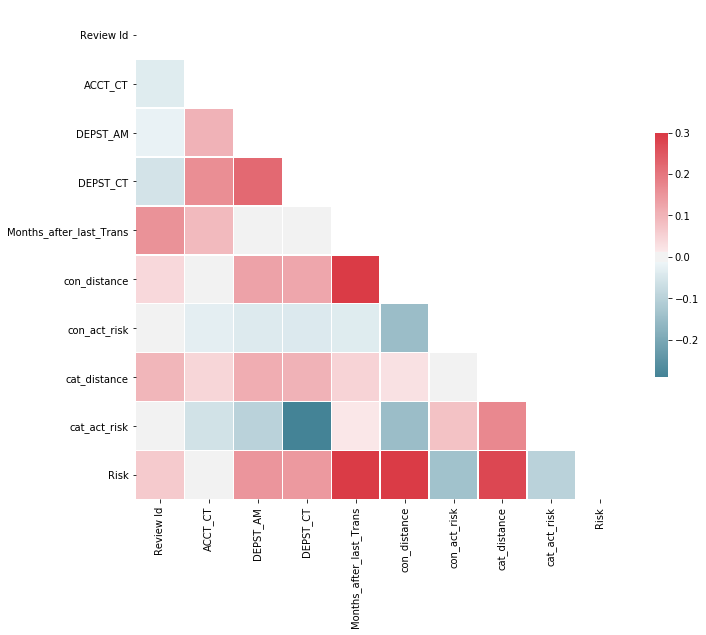

In [709]:
# Compute the correlation matrix
corr = df_incoming_final.corr()

# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

In [710]:
from scipy import stats
F, p = stats.f_oneway(df_final[df_final['PATTERN']=='Existing HH - 1 Month'].Risk,
                      df_final[df_final['PATTERN']=='Existing HH - 3 Month'].Risk,
                      df_final[df_final['PATTERN']=='Existing HH - 6 Month'].Risk,
                      df_final[df_final['PATTERN']=='New Account'].Risk,
                      df_final[df_final['PATTERN']=='Foreign Resident'].Risk)
F , p

(2066.118822262885, 0.0)

## Change of Account Behaviour

In [1230]:
df = pd.read_csv('UofP_HutleyAnalytics_ChangeofAccntBehavior022019_Binary.csv')
df['Review Id']=df['Review Id'].apply(locale.atoi)
print(df.shape)
df.head()

(244496, 9)


,Review Id,Creat Ts,Cntry Id,Acct ID Anonymized,Pttrn Id,Bindg Nm,Value Tx,Scnro Short Nm,Actvy Type Desc Tx
0,3975422,1/4/16 0:00,"104,000,001",55092123074,"8,000,254",ALERT_TYPE,New Wire Destination,Chng of Acct Bhvr,Action Withheld
1,3975422,1/4/16 0:00,"104,000,001",55092123074,"8,000,254",CNTRY_CD,ZA,Chng of Acct Bhvr,Action Withheld
2,3975422,1/4/16 0:00,"104,000,001",55092123074,"8,000,254",HIGH_RISK_SCORE,NaN,Chng of Acct Bhvr,Action Withheld
3,3975422,1/4/16 0:00,"104,000,001",55092123074,"8,000,254",OPP_SIDE_FL,N,Chng of Acct Bhvr,Action Withheld
4,3975422,1/4/16 0:00,"104,000,001",55092123074,"8,000,254",SRC_SYS_CD,A,Chng of Acct Bhvr,Action Withheld


In [1231]:
df['Creat Ts']=df['Creat Ts'].apply(lambda x: datetime.strptime(x, "%m/%d/%y %H:%M"))
df=pd.concat([df, remained_chng_act_in_income])

In [1232]:
%who DataFrame

backup_chng	 backup_df	 cat_df	 con_df	 corr	 df	 df1	 df2	 df_chng_newdes_final	 
df_chng_other_alerts_final	 df_final	 other_df	 remained_chng_act_in_income	 temp	 


In [1233]:
df.duplicated().sum()

30765

In [1234]:
df=df.drop_duplicates()
df.shape

(239788, 9)

In [1235]:
df=df[df['Acct ID Anonymized'] != '#VALUE!']
df.head()

,Review Id,Creat Ts,Cntry Id,Acct ID Anonymized,Pttrn Id,Bindg Nm,Value Tx,Scnro Short Nm,Actvy Type Desc Tx
0,3975422,2016-01-04,"104,000,001",55092123074,"8,000,254",ALERT_TYPE,New Wire Destination,Chng of Acct Bhvr,Action Withheld
1,3975422,2016-01-04,"104,000,001",55092123074,"8,000,254",CNTRY_CD,ZA,Chng of Acct Bhvr,Action Withheld
2,3975422,2016-01-04,"104,000,001",55092123074,"8,000,254",HIGH_RISK_SCORE,NaN,Chng of Acct Bhvr,Action Withheld
3,3975422,2016-01-04,"104,000,001",55092123074,"8,000,254",OPP_SIDE_FL,N,Chng of Acct Bhvr,Action Withheld
4,3975422,2016-01-04,"104,000,001",55092123074,"8,000,254",SRC_SYS_CD,A,Chng of Acct Bhvr,Action Withheld


In [1236]:
df.isna().sum()

Review Id                 0
Creat Ts                  0
Cntry Id                  0
Acct ID Anonymized        0
Pttrn Id                  0
Bindg Nm                  0
Value Tx              25847
Scnro Short Nm            0
Actvy Type Desc Tx        0
dtype: int64

In [1237]:
df.loc[df['Value Tx'].isnull() , 'Bindg Nm'].unique()

array(['HIGH_RISK_SCORE', 'CNTRY_CD'], dtype=object)

In [1238]:
df= df[~(df['Value Tx'].isnull())]

In [1239]:
df.isna().sum()

Review Id             0
Creat Ts              0
Cntry Id              0
Acct ID Anonymized    0
Pttrn Id              0
Bindg Nm              0
Value Tx              0
Scnro Short Nm        0
Actvy Type Desc Tx    0
dtype: int64

In [1240]:
df.sort_values(by=['Acct ID Anonymized','Review Id'], inplace=True)
df=df.reset_index()
df=df.drop(['index'] , axis=1)
df=df.reindex(columns=['Acct ID Anonymized','Review Id', 'Creat Ts', 'Cntry Id','Pttrn Id',
       'Bindg Nm', 'Value Tx', 'Scnro Short Nm', 'Actvy Type Desc Tx'])
df.head()

,Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Bindg Nm,Value Tx,Scnro Short Nm,Actvy Type Desc Tx
0,1.21987E+17,4001913,2016-02-02,"104,000,001","8,000,254",ALERT_TYPE,New Wire Destination,Chng of Acct Bhvr,Action Withheld
1,1.21987E+17,4001913,2016-02-02,"104,000,001","8,000,254",CNTRY_CD,MY,Chng of Acct Bhvr,Action Withheld
2,1.21987E+17,4001913,2016-02-02,"104,000,001","8,000,254",OPP_SIDE_FL,N,Chng of Acct Bhvr,Action Withheld
3,1.21987E+17,4001913,2016-02-02,"104,000,001","8,000,254",SRC_SYS_CD,A,Chng of Acct Bhvr,Action Withheld
4,1.21987E+17,4001913,2016-02-02,"104,000,001","8,000,254",TRAN_AM,28500,Chng of Acct Bhvr,Action Withheld


In [1241]:
df['Pttrn Id'].value_counts()

8,000,253    108496
8,000,254     40473
535           31207
595           20309
Name: Pttrn Id, dtype: int64

In [1242]:
df['Scnro Short Nm'].value_counts()

Chng of Acct Bhvr    200485
Name: Scnro Short Nm, dtype: int64

In [1243]:
df['Actvy Type Desc Tx'].value_counts()

Action Withheld                195555
Case Opened                      2043
Auto-Closed                      1828
SAR Filed                         975
Close and Suppress 3 months        84
Name: Actvy Type Desc Tx, dtype: int64

In [1244]:
df[df.groupby(['Review Id'])['Acct ID Anonymized'].transform('nunique') > 1]

,Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Bindg Nm,Value Tx,Scnro Short Nm,Actvy Type Desc Tx


In [1245]:
df['Bindg Nm'].unique()

array(['ALERT_TYPE', 'CNTRY_CD', 'OPP_SIDE_FL', 'SRC_SYS_CD', 'TRAN_AM',
       'TRAN_CT', 'XACTN_RISK_NB', 'CURR_MTH_AM', 'CURR_MTH_CT',
       'PRIOR_MAX_AM', 'PRIOR_MAX_CT', 'HIGH_RISK_SCORE',
       'FCAL_NTITY_RISK_NB'], dtype=object)

In [1246]:
df=df[df['Bindg Nm'].apply(lambda bindg_name: bindg_name not in not_meaningful)].reset_index()
df=df.drop(['index'] , axis=1)
df.head()

,Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Bindg Nm,Value Tx,Scnro Short Nm,Actvy Type Desc Tx
0,1.21987E+17,4001913,2016-02-02,"104,000,001","8,000,254",ALERT_TYPE,New Wire Destination,Chng of Acct Bhvr,Action Withheld
1,1.21987E+17,4001913,2016-02-02,"104,000,001","8,000,254",CNTRY_CD,MY,Chng of Acct Bhvr,Action Withheld
2,1.21987E+17,4001913,2016-02-02,"104,000,001","8,000,254",SRC_SYS_CD,A,Chng of Acct Bhvr,Action Withheld
3,1.21987E+17,4001913,2016-02-02,"104,000,001","8,000,254",TRAN_AM,28500,Chng of Acct Bhvr,Action Withheld
4,1.21987E+17,4001913,2016-02-02,"104,000,001","8,000,254",TRAN_CT,1,Chng of Acct Bhvr,Action Withheld


In [1247]:
discrete_rows = df['Bindg Nm'].apply(lambda bindg_name: bindg_name in discrete)
continous_rows = df['Bindg Nm'].apply(lambda bindg_name: bindg_name in continous)
string_rows = df['Bindg Nm'].apply(lambda bindg_name: bindg_name in string)
#date_rows= df['Bindg Nm'].apply(lambda bindg_name: bindg_name in dates)

df.loc[discrete_rows,'Value Tx'] = df.loc[discrete_rows,'Value Tx'].astype(int)
df.loc[continous_rows,'Value Tx'] = df.loc[continous_rows,'Value Tx'].astype(float)
df.loc[string_rows,'Value Tx'] = df.loc[string_rows,'Value Tx'].astype(str)
#df.loc[date_rows,'Value Tx']=df.loc[date_rows,'Value Tx'].apply(lambda x: pd.to_datetime(x))

In [1248]:
temp=df.copy()
temp=temp.groupby(['Acct ID Anonymized','Review Id', 'Creat Ts', 'Cntry Id',  'Pttrn Id',
       'Bindg Nm','Scnro Short Nm' ,'Value Tx']).agg({'Actvy Type Desc Tx': set}).reset_index()

In [1249]:
temp['Actvy Type Desc Tx'].value_counts()

{Action Withheld}                                 155614
{Auto-Closed}                                       1568
{SAR Filed, Case Opened}                             652
{Case Opened}                                        621
{Action Withheld, Case Opened}                       214
{Action Withheld, SAR Filed, Case Opened}            122
{Action Withheld, Close and Suppress 3 months}        72
{Action Withheld, SAR Filed}                          11
Name: Actvy Type Desc Tx, dtype: int64

In [1250]:
df=df.groupby(['Acct ID Anonymized','Review Id', 'Creat Ts', 'Cntry Id',  'Pttrn Id',
       'Bindg Nm','Scnro Short Nm']).agg({'Value Tx': set}).reset_index()
df.head()

,Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Bindg Nm,Scnro Short Nm,Value Tx
0,1.21987E+17,4001913,2016-02-02,"104,000,001","8,000,254",ALERT_TYPE,Chng of Acct Bhvr,{New Wire Destination}
1,1.21987E+17,4001913,2016-02-02,"104,000,001","8,000,254",CNTRY_CD,Chng of Acct Bhvr,{MY}
2,1.21987E+17,4001913,2016-02-02,"104,000,001","8,000,254",SRC_SYS_CD,Chng of Acct Bhvr,{A}
3,1.21987E+17,4001913,2016-02-02,"104,000,001","8,000,254",TRAN_AM,Chng of Acct Bhvr,{28500.0}
4,1.21987E+17,4001913,2016-02-02,"104,000,001","8,000,254",TRAN_CT,Chng of Acct Bhvr,{1}


In [1251]:
df = pd.merge(df,
             temp[['Review Id', 'Actvy Type Desc Tx']].drop_duplicates(subset=['Review Id']),
             on='Review Id')
del temp
df.head()

,Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Bindg Nm,Scnro Short Nm,Value Tx,Actvy Type Desc Tx
0,1.21987E+17,4001913,2016-02-02,"104,000,001","8,000,254",ALERT_TYPE,Chng of Acct Bhvr,{New Wire Destination},{Action Withheld}
1,1.21987E+17,4001913,2016-02-02,"104,000,001","8,000,254",CNTRY_CD,Chng of Acct Bhvr,{MY},{Action Withheld}
2,1.21987E+17,4001913,2016-02-02,"104,000,001","8,000,254",SRC_SYS_CD,Chng of Acct Bhvr,{A},{Action Withheld}
3,1.21987E+17,4001913,2016-02-02,"104,000,001","8,000,254",TRAN_AM,Chng of Acct Bhvr,{28500.0},{Action Withheld}
4,1.21987E+17,4001913,2016-02-02,"104,000,001","8,000,254",TRAN_CT,Chng of Acct Bhvr,{1},{Action Withheld}


In [1252]:
df.reset_index()
df=df.reindex(columns=['Acct ID Anonymized','Review Id', 'Creat Ts', 'Cntry Id','Pttrn Id',
       'Bindg Nm', 'Value Tx', 'Scnro Short Nm', 'Actvy Type Desc Tx'])
df.head()

,Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Bindg Nm,Value Tx,Scnro Short Nm,Actvy Type Desc Tx
0,1.21987E+17,4001913,2016-02-02,"104,000,001","8,000,254",ALERT_TYPE,{New Wire Destination},Chng of Acct Bhvr,{Action Withheld}
1,1.21987E+17,4001913,2016-02-02,"104,000,001","8,000,254",CNTRY_CD,{MY},Chng of Acct Bhvr,{Action Withheld}
2,1.21987E+17,4001913,2016-02-02,"104,000,001","8,000,254",SRC_SYS_CD,{A},Chng of Acct Bhvr,{Action Withheld}
3,1.21987E+17,4001913,2016-02-02,"104,000,001","8,000,254",TRAN_AM,{28500.0},Chng of Acct Bhvr,{Action Withheld}
4,1.21987E+17,4001913,2016-02-02,"104,000,001","8,000,254",TRAN_CT,{1},Chng of Acct Bhvr,{Action Withheld}


In [1253]:
df['Actvy Type Desc Tx']=df['Actvy Type Desc Tx'].apply(lambda x: list(x)[0] if (len(x) == 1) else x)

In [1254]:
df['Value Tx']=df['Value Tx'].apply(lambda x: list(x)[0] if (len(x) == 1) else x)

In [1255]:
value_bindname_rows= df['Bindg Nm'].apply(lambda x: (x in discrete) | (x in continous))

In [1256]:
df.loc[value_bindname_rows , 'Value Tx'] = df.loc[value_bindname_rows , 'Value Tx']. \
                                                                      apply(lambda x: max(x) if type(x)== set else x)

In [1257]:
df[df['Value Tx'].apply(lambda x: type(x) == set)]['Bindg Nm'].value_counts()

ALERT_TYPE    234
CNTRY_CD       32
Name: Bindg Nm, dtype: int64

In [1258]:
df[ (df['Bindg Nm'] == 'ALERT_TYPE') & (df['Value Tx']. \
                                                   apply(lambda x: type(x) == set))]['Value Tx'].value_counts()

{Third Party Incoming Journals, Third Party Outgoing Journals}      118
{Electronic Transfer Deposits, Electronic Transfer Withdrawals}      67
{Check Withdrawals, Check Deposits}                                  15
{Check Withdrawals, Electronic Transfer Withdrawals}                  7
{Check Withdrawals, Third Party Outgoing Journals}                    6
{Third Party Incoming Journals, Electronic Transfer Withdrawals}      4
{Third Party Outgoing Journals, Electronic Transfer Withdrawals}      4
{Check Deposits, Electronic Transfer Withdrawals}                     3
{Third Party Incoming Journals, Check Withdrawals}                    2
{Check Withdrawals, Electronic Transfer Deposits}                     2
{Third Party Outgoing Journals, Electronic Transfer Deposits}         2
{Cash Equivalent Deposits, Third Party Outgoing Journals}             1
{Cash Equivalent Deposits, Check Deposits}                            1
{Third Party Incoming Journals, Electronic Transfer Deposits}   

In [1259]:
df[ (df['Bindg Nm'] == 'CNTRY_CD') & (df['Value Tx']. \
                                                   apply(lambda x: type(x) == set))]['Value Tx'].value_counts()

{HK, CA}        2
{IE, KY}        2
{DE, GB}        2
{DK, GB}        1
{IL, BE}        1
{AU, PH}        1
{CL, PE}        1
{HN, CY}        1
{FR, GB}        1
{IT, NL}        1
{DE, CH}        1
{ES, CA}        1
{GG, AT, CH}    1
{PA, CO}        1
{HK, NL}        1
{AE, CH}        1
{NL, GB}        1
{AT, DE}        1
{MX, CA}        1
{HK, KY}        1
{AU, FR}        1
{CA, DE}        1
{ES, CH}        1
{AU, SG}        1
{LU, IE}        1
{JE, GB}        1
{HK, CN}        1
{AU, ZA}        1
{SG, JP, DE}    1
Name: Value Tx, dtype: int64

In [1260]:
df.loc[df['Value Tx'].apply(lambda x: type(x) == set) , 'Value Tx'] = \
    df.loc[df['Value Tx'].apply(lambda x: type(x) == set) , 'Value Tx'].apply(lambda x: max(x) if type(x)== set else x)


In [1261]:
df[df['Value Tx'].apply(lambda x: type(x) == set)]['Bindg Nm'].value_counts()

Series([], Name: Bindg Nm, dtype: int64)

In [1262]:
df['Actvy Type Desc Tx'].value_counts()

Action Withheld                                   154718
Auto-Closed                                         1568
{SAR Filed, Case Opened}                             642
Case Opened                                          604
{Action Withheld, Case Opened}                       214
{Action Withheld, SAR Filed, Case Opened}            122
{Action Withheld, Close and Suppress 3 months}        72
{Action Withheld, SAR Filed}                          11
Name: Actvy Type Desc Tx, dtype: int64

In [1263]:
set_Actvys = df['Actvy Type Desc Tx'].apply(lambda x: type(x) == set)

In [1264]:
df.loc[set_Actvys , 'Actvy Type Desc Tx'] = df.loc[set_Actvys , 'Actvy Type Desc Tx']. \
   apply(final_activity)

In [1265]:
df['Actvy Type Desc Tx'].value_counts()

Action Withheld    154718
Auto-Closed          1568
Case Opened           818
SAR Filed             775
Suppressed             72
Name: Actvy Type Desc Tx, dtype: int64

In [1266]:
df.shape

(157951, 9)

In [1267]:
df['Bindg Nm'].value_counts()

ALERT_TYPE         27628
SRC_SYS_CD         27628
CURR_MTH_CT        17844
CURR_MTH_AM        17844
PRIOR_MAX_CT       17844
PRIOR_MAX_AM       17844
TRAN_AM             9784
TRAN_CT             9784
CNTRY_CD            9783
HIGH_RISK_SCORE     1968
Name: Bindg Nm, dtype: int64

In [1268]:
df.loc[df['Bindg Nm'] == 'ALERT_TYPE' , 'Value Tx'].value_counts()

New Wire Destination               9784
Third Party Incoming Journals      4196
Electronic Transfer Deposits       3610
Third Party Outgoing Journals      3599
Electronic Transfer Withdrawals    3253
Check Withdrawals                  2650
Check Deposits                      389
Cash Equivalent Deposits            147
Name: Value Tx, dtype: int64

In [1269]:
alerts=df.loc[df['Bindg Nm'] == 'ALERT_TYPE' , 'Value Tx'].unique()
alerts

array(['New Wire Destination', 'Check Withdrawals',
       'Third Party Incoming Journals', 'Electronic Transfer Withdrawals',
       'Third Party Outgoing Journals', 'Electronic Transfer Deposits',
       'Cash Equivalent Deposits', 'Check Deposits'], dtype=object)

In [1270]:
df.head()

,Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Bindg Nm,Value Tx,Scnro Short Nm,Actvy Type Desc Tx
0,1.21987E+17,4001913,2016-02-02,"104,000,001","8,000,254",ALERT_TYPE,New Wire Destination,Chng of Acct Bhvr,Action Withheld
1,1.21987E+17,4001913,2016-02-02,"104,000,001","8,000,254",CNTRY_CD,MY,Chng of Acct Bhvr,Action Withheld
2,1.21987E+17,4001913,2016-02-02,"104,000,001","8,000,254",SRC_SYS_CD,A,Chng of Acct Bhvr,Action Withheld
3,1.21987E+17,4001913,2016-02-02,"104,000,001","8,000,254",TRAN_AM,28500,Chng of Acct Bhvr,Action Withheld
4,1.21987E+17,4001913,2016-02-02,"104,000,001","8,000,254",TRAN_CT,1,Chng of Acct Bhvr,Action Withheld


In [1271]:
temp1=df.groupby(['Review Id'])['Value Tx'].filter(lambda x: 'New Wire Destination' not in set(x))
other_df = df.loc[temp1.index,:].reset_index().drop(['index'] , axis=1)
del temp1

In [1272]:
temp2=df.groupby(['Review Id'])['Value Tx'].filter(lambda x: 'New Wire Destination' in set(x))
df = df.loc[temp2.index,:].reset_index().drop(['index'] , axis=1)
del temp2

In [1273]:
df

,Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Bindg Nm,Value Tx,Scnro Short Nm,Actvy Type Desc Tx
0,1.21987E+17,4001913,2016-02-02,"104,000,001","8,000,254",ALERT_TYPE,New Wire Destination,Chng of Acct Bhvr,Action Withheld
1,1.21987E+17,4001913,2016-02-02,"104,000,001","8,000,254",CNTRY_CD,MY,Chng of Acct Bhvr,Action Withheld
2,1.21987E+17,4001913,2016-02-02,"104,000,001","8,000,254",SRC_SYS_CD,A,Chng of Acct Bhvr,Action Withheld
3,1.21987E+17,4001913,2016-02-02,"104,000,001","8,000,254",TRAN_AM,28500,Chng of Acct Bhvr,Action Withheld
4,1.21987E+17,4001913,2016-02-02,"104,000,001","8,000,254",TRAN_CT,1,Chng of Acct Bhvr,Action Withheld
5,1.6878E+109,4116251,2016-07-13,"104,000,001","8,000,254",ALERT_TYPE,New Wire Destination,Chng of Acct Bhvr,Action Withheld
6,1.6878E+109,4116251,2016-07-13,"104,000,001","8,000,254",CNTRY_CD,RU,Chng of Acct Bhvr,Action Withheld
7,1.6878E+109,4116251,2016-07-13,"104,000,001","8,000,254",SRC_SYS_CD,A,Chng of Acct Bhvr,Action Withheld
8,1.6878E+109,4116251,2016-07-13,"104,000,001","8,000,254",TRAN_AM,25000,Chng of Acct Bhvr,Action Withheld
9,1.6878E+109,4116251,2016-07-13,"104,000,001","8,000,254",TRAN_CT,1,Chng of Acct Bhvr,Action Withheld


In [1274]:
result = pd.crosstab([df['Acct ID Anonymized'] , df['Review Id'] , df['Creat Ts'] , df['Cntry Id'] , \
              df['Pttrn Id'] , df['Scnro Short Nm'] , df['Actvy Type Desc Tx']], df['Bindg Nm'] , \
            values=df['Value Tx'] , \
            aggfunc='sum')

In [1275]:
result

,,,,,,Bindg Nm,ALERT_TYPE,CNTRY_CD,HIGH_RISK_SCORE,SRC_SYS_CD,TRAN_AM,TRAN_CT
Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Scnro Short Nm,Actvy Type Desc Tx,,,,,,
1.21987E+17,4001913,2016-02-02,"104,000,001","8,000,254",Chng of Acct Bhvr,Action Withheld,New Wire Destination,MY,NaN,A,28500,1
1.6878E+109,4116251,2016-07-13,"104,000,001","8,000,254",Chng of Acct Bhvr,Action Withheld,New Wire Destination,RU,NaN,A,25000,1
10000067881,3982846,2016-01-12,"104,000,001","8,000,254",Chng of Acct Bhvr,Action Withheld,New Wire Destination,DE,NaN,A,23776.9,1
10001602257,4549757,2017-11-28,"104,000,001",535,Chng of Acct Bhvr,Action Withheld,New Wire Destination,BS,NaN,A,4.56753e+06,1
10003261434,4384784,2017-07-24,"104,000,001",535,Chng of Acct Bhvr,Action Withheld,New Wire Destination,CA,NaN,A,100000,1
10007636795,4312981,2017-04-19,"104,000,001","8,000,254",Chng of Acct Bhvr,Action Withheld,New Wire Destination,DE,NaN,A,150019,1
10008619467,4655887,2018-03-21,"104,000,001",535,Chng of Acct Bhvr,Action Withheld,New Wire Destination,BS,NaN,A,463500,1
10011233362,3992016,2016-01-26,"104,000,001","8,000,254",Chng of Acct Bhvr,Action Withheld,New Wire Destination,JE,NaN,A,150000,1
10012176089,4141099,2016-08-24,"104,000,001","8,000,254",Chng of Acct Bhvr,Action Withheld,New Wire Destination,BS,NaN,A,100015,1


In [1276]:
%who DataFrame

backup_chng	 backup_df	 cat_df	 con_df	 corr	 df	 df1	 df2	 df_chng_newdes_final	 
df_chng_other_alerts_final	 df_final	 other_df	 remained_chng_act_in_income	 result	 


In [1277]:
#del ali_df, changact_in_income , chng_acct_df, income_df , remained_chng_act_in_income , temp , test

In [1278]:
df=result.reset_index().rename_axis("", axis="columns")
df

,Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Scnro Short Nm,Actvy Type Desc Tx,ALERT_TYPE,CNTRY_CD,HIGH_RISK_SCORE,SRC_SYS_CD,TRAN_AM,TRAN_CT
0,1.21987E+17,4001913,2016-02-02,"104,000,001","8,000,254",Chng of Acct Bhvr,Action Withheld,New Wire Destination,MY,NaN,A,28500,1
1,1.6878E+109,4116251,2016-07-13,"104,000,001","8,000,254",Chng of Acct Bhvr,Action Withheld,New Wire Destination,RU,NaN,A,25000,1
2,10000067881,3982846,2016-01-12,"104,000,001","8,000,254",Chng of Acct Bhvr,Action Withheld,New Wire Destination,DE,NaN,A,23776.9,1
3,10001602257,4549757,2017-11-28,"104,000,001",535,Chng of Acct Bhvr,Action Withheld,New Wire Destination,BS,NaN,A,4.56753e+06,1
4,10003261434,4384784,2017-07-24,"104,000,001",535,Chng of Acct Bhvr,Action Withheld,New Wire Destination,CA,NaN,A,100000,1
5,10007636795,4312981,2017-04-19,"104,000,001","8,000,254",Chng of Acct Bhvr,Action Withheld,New Wire Destination,DE,NaN,A,150019,1
6,10008619467,4655887,2018-03-21,"104,000,001",535,Chng of Acct Bhvr,Action Withheld,New Wire Destination,BS,NaN,A,463500,1
7,10011233362,3992016,2016-01-26,"104,000,001","8,000,254",Chng of Acct Bhvr,Action Withheld,New Wire Destination,JE,NaN,A,150000,1
8,10012176089,4141099,2016-08-24,"104,000,001","8,000,254",Chng of Acct Bhvr,Action Withheld,New Wire Destination,BS,NaN,A,100015,1
9,10012683902,4658299,2018-03-28,"104,000,001",535,Chng of Acct Bhvr,Action Withheld,New Wire Destination,DE,FRC,A,574885,1


In [1279]:
del result

In [1280]:
df.shape

(9784, 13)

In [1281]:
df.isna().sum()


Acct ID Anonymized       0
Review Id                0
Creat Ts                 0
Cntry Id                 0
Pttrn Id                 0
Scnro Short Nm           0
Actvy Type Desc Tx       0
ALERT_TYPE               0
CNTRY_CD                 1
HIGH_RISK_SCORE       8381
SRC_SYS_CD               0
TRAN_AM                  0
TRAN_CT                  0
dtype: int64

In [1282]:
df=df.drop(['HIGH_RISK_SCORE'] , axis=1)

In [1283]:
df.isna().sum()


Acct ID Anonymized    0
Review Id             0
Creat Ts              0
Cntry Id              0
Pttrn Id              0
Scnro Short Nm        0
Actvy Type Desc Tx    0
ALERT_TYPE            0
CNTRY_CD              1
SRC_SYS_CD            0
TRAN_AM               0
TRAN_CT               0
dtype: int64

In [1284]:
df.loc[df['CNTRY_CD'].isna(),'CNTRY_CD'] = df['CNTRY_CD'].value_counts().idxmax()

In [1285]:
df.isna().sum().sum()

0

In [1286]:
df.head()

,Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Scnro Short Nm,Actvy Type Desc Tx,ALERT_TYPE,CNTRY_CD,SRC_SYS_CD,TRAN_AM,TRAN_CT
0,1.21987E+17,4001913,2016-02-02,"104,000,001","8,000,254",Chng of Acct Bhvr,Action Withheld,New Wire Destination,MY,A,28500,1
1,1.6878E+109,4116251,2016-07-13,"104,000,001","8,000,254",Chng of Acct Bhvr,Action Withheld,New Wire Destination,RU,A,25000,1
2,10000067881,3982846,2016-01-12,"104,000,001","8,000,254",Chng of Acct Bhvr,Action Withheld,New Wire Destination,DE,A,23776.9,1
3,10001602257,4549757,2017-11-28,"104,000,001",535,Chng of Acct Bhvr,Action Withheld,New Wire Destination,BS,A,4.56753e+06,1
4,10003261434,4384784,2017-07-24,"104,000,001",535,Chng of Acct Bhvr,Action Withheld,New Wire Destination,CA,A,100000,1


In [1287]:
df['Months_after_last_Trans']=df.groupby(['Acct ID Anonymized'])['Creat Ts']. \
                                          diff().fillna(0).apply(lambda x : math.ceil(x / np.timedelta64(1, 'M')))

In [1288]:
backup_chng_newDest=df.copy()
df=backup_chng_newDest.copy()

In [1289]:
df.dtypes


Acct ID Anonymized                 object
Review Id                           int64
Creat Ts                   datetime64[ns]
Cntry Id                           object
Pttrn Id                           object
Scnro Short Nm                     object
Actvy Type Desc Tx                 object
ALERT_TYPE                         object
CNTRY_CD                           object
SRC_SYS_CD                         object
TRAN_AM                            object
TRAN_CT                            object
Months_after_last_Trans             int64
dtype: object

In [1290]:
df['ALERT_TYPE'].value_counts()

New Wire Destination    9784
Name: ALERT_TYPE, dtype: int64

In [1291]:
df['TRAN_AM']=df['TRAN_AM'].astype('float')
df['TRAN_CT']=df['TRAN_CT'].astype('int')

In [1292]:
df.head()

,Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Scnro Short Nm,Actvy Type Desc Tx,ALERT_TYPE,CNTRY_CD,SRC_SYS_CD,TRAN_AM,TRAN_CT,Months_after_last_Trans
0,1.21987E+17,4001913,2016-02-02,"104,000,001","8,000,254",Chng of Acct Bhvr,Action Withheld,New Wire Destination,MY,A,28500.00,1,0
1,1.6878E+109,4116251,2016-07-13,"104,000,001","8,000,254",Chng of Acct Bhvr,Action Withheld,New Wire Destination,RU,A,25000.00,1,0
2,10000067881,3982846,2016-01-12,"104,000,001","8,000,254",Chng of Acct Bhvr,Action Withheld,New Wire Destination,DE,A,23776.88,1,0
3,10001602257,4549757,2017-11-28,"104,000,001",535,Chng of Acct Bhvr,Action Withheld,New Wire Destination,BS,A,4567525.74,1,0
4,10003261434,4384784,2017-07-24,"104,000,001",535,Chng of Acct Bhvr,Action Withheld,New Wire Destination,CA,A,100000.00,1,0


In [1293]:
df['CNTRY_CD'].unique()

array(['MY', 'RU', 'DE', 'BS', 'CA', 'JE', 'GB', 'ZA', 'JP', 'PH', 'AU',
       'MX', 'SE', 'CN', 'CH', 'VN', 'IL', 'PA', 'AE', 'IE', 'ES', 'KR',
       'HK', 'AL', 'CW', 'PT', 'AT', 'RO', 'BM', 'AR', 'TW', 'NO', 'MA',
       'CR', 'KY', 'FR', 'SG', 'RS', 'FI', 'KN', 'TH', 'IS', 'KG', 'EC',
       'CL', 'NL', 'IN', 'IT', 'DK', 'VI', 'SA', 'HN', 'LB', 'CO', 'LU',
       'SZ', 'UY', 'PR', 'TR', 'BR', 'IM', 'GH', 'PL', 'VG', 'HR', 'NZ',
       'FJ', 'PY', 'DZ', 'CY', 'DO', 'AF', 'JO', 'MU', 'UM', 'ID', 'MM',
       'SV', 'BE', 'SC', 'EE', 'PK', 'SM', 'AX', 'EG', 'GT', 'UG', 'CZ',
       'LK', 'NI', 'AM', 'KH', 'OM', 'UA', 'NG', 'PE', 'MQ', 'TC', 'BG',
       'GG', 'HU', 'BB', 'SX', 'NP', 'CG', 'AG', 'MN', 'GR', 'LC', 'MO',
       'BZ', 'TZ', 'MT', 'SI', 'CI', 'PS', 'DM', 'VC', 'BO', 'GE', 'MF',
       'KE', 'VE', 'BL', 'LV', 'QA', 'ME', 'HT', 'GU', 'MC', 'CD', 'GF',
       'VU', 'MZ', 'JM', 'BQ', 'LA', 'BA', 'GI', 'SO', 'AD', 'HM', 'MH',
       'AW', 'ZW', 'TT', 'GP', 'RW', 'SK', 'CX', 'A

In [1294]:
df['SRC_SYS_CD'].unique()

array(['A', 'B'], dtype=object)

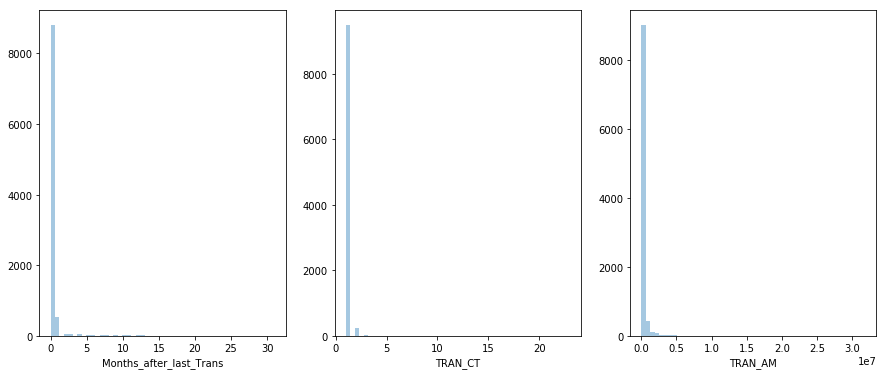

In [1295]:
f, axes = plt.subplots(1, 3 ,figsize=(15, 6))
sns.distplot(df['Months_after_last_Trans'] , kde= False ,ax=axes[0])
sns.distplot(df['TRAN_CT'] , kde= False ,ax=axes[1])
sns.distplot(df['TRAN_AM'] , kde= False ,ax=axes[2])

In [1296]:
#threshold= 3

zscore_tran_ct=pd.Series(np.abs(stats.zscore(df['TRAN_CT'])))
zscore_tran_am=pd.Series(np.abs(stats.zscore(df['TRAN_AM'])))
#zscore_Months_after_last_Trans =pd.Series(np.abs(stats.zscore(df['Months_after_last_Trans'])))

In [1297]:
desired_records = (zscore_tran_ct < threshold) & (zscore_tran_am < threshold) 
                 #& (zscore_Days_after_last_Trans < threshold)
sum(desired_records)

9623

In [1298]:
temp=df[~desired_records]

len(temp['Acct ID Anonymized'].unique()) / len(df['Acct ID Anonymized'].unique())

0.016592661836877774

In [1299]:
outliers_chng_new_wire_transfer = temp['Acct ID Anonymized'].unique()
len(outliers_chng_new_wire_transfer)

142

In [1300]:
df= df[desired_records].reset_index().drop(['index'] , axis=1)

In [1301]:
df.shape

(9623, 13)

(array([-500000.,       0.,  500000., 1000000., 1500000., 2000000.,
        2500000., 3000000., 3500000., 4000000.]),
 <a list of 10 Text xticklabel objects>)

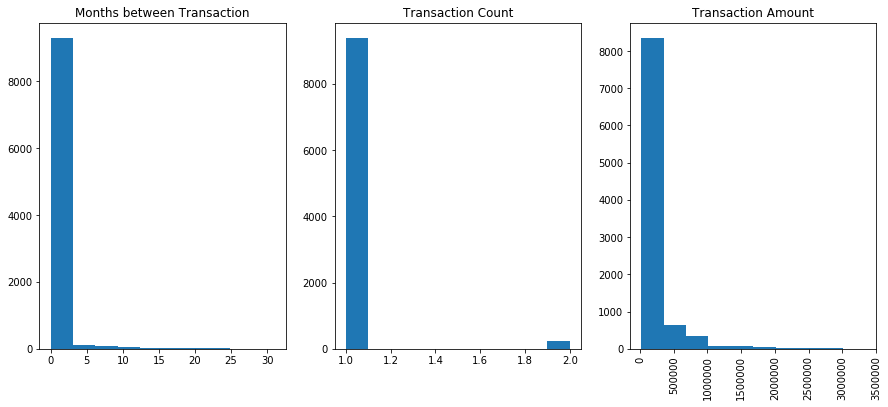

In [1302]:
# Create a figure instance
fig = plt.figure(1, figsize=(15, 6))

# Create an axes instance
ax1 = fig.add_subplot(131)
ax2 = fig.add_subplot(132)
ax3 = fig.add_subplot(133)

# Create the boxplot


ax1.hist(df['Months_after_last_Trans'])
ax1.set_title('Months between Transaction')

ax2.hist(df['TRAN_CT'])
ax2.set_title('Transaction Count')

ax3.hist(df['TRAN_AM'])
ax3.set_title('Transaction Amount')

plt.xticks(rotation='vertical')

Text(0.5, 1.0, 'Transaction Amount')

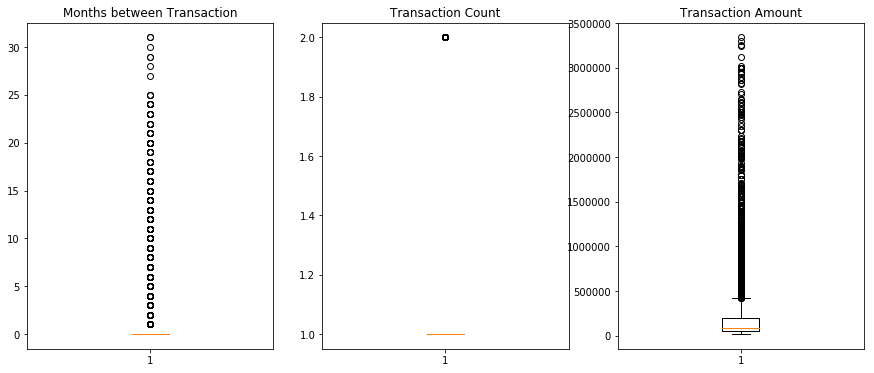

In [1303]:
# Create a figure instance
fig = plt.figure(1, figsize=(15, 6))

# Create an axes instance
ax1 = fig.add_subplot(131)
ax2 = fig.add_subplot(132)
ax3 = fig.add_subplot(133)

# Create the boxplot
ax1.boxplot(df['Months_after_last_Trans'])
ax1.set_title('Months between Transaction')

ax2.boxplot(df['TRAN_CT'])
ax2.set_title('Transaction Count')

ax3.boxplot(df['TRAN_AM'])
ax3.set_title('Transaction Amount')

In [1304]:
cat_columns = ["Cntry Id","Pttrn Id","CNTRY_CD", "SRC_SYS_CD"]

In [1305]:
df = pd.get_dummies(df, prefix_sep="__",
                              columns=cat_columns)
df

,Acct ID Anonymized,Review Id,Creat Ts,Scnro Short Nm,Actvy Type Desc Tx,ALERT_TYPE,TRAN_AM,TRAN_CT,Months_after_last_Trans,"Cntry Id__104,000,001",Pttrn Id__535,"Pttrn Id__8,000,254",CNTRY_CD__AD,CNTRY_CD__AE,CNTRY_CD__AF,CNTRY_CD__AG,CNTRY_CD__AI,CNTRY_CD__AL,CNTRY_CD__AM,CNTRY_CD__AR,CNTRY_CD__AS,CNTRY_CD__AT,CNTRY_CD__AU,CNTRY_CD__AW,CNTRY_CD__AX,CNTRY_CD__BA,CNTRY_CD__BB,CNTRY_CD__BE,CNTRY_CD__BF,CNTRY_CD__BG,CNTRY_CD__BH,CNTRY_CD__BL,CNTRY_CD__BM,CNTRY_CD__BN,CNTRY_CD__BO,CNTRY_CD__BQ,CNTRY_CD__BR,CNTRY_CD__BS,CNTRY_CD__BT,CNTRY_CD__BW,CNTRY_CD__BY,CNTRY_CD__BZ,CNTRY_CD__CA,CNTRY_CD__CC,CNTRY_CD__CD,CNTRY_CD__CG,CNTRY_CD__CH,CNTRY_CD__CI,CNTRY_CD__CL,CNTRY_CD__CM,CNTRY_CD__CN,CNTRY_CD__CO,CNTRY_CD__CR,CNTRY_CD__CV,CNTRY_CD__CW,CNTRY_CD__CX,CNTRY_CD__CY,CNTRY_CD__CZ,CNTRY_CD__DE,CNTRY_CD__DK,CNTRY_CD__DM,CNTRY_CD__DO,CNTRY_CD__DZ,CNTRY_CD__EC,CNTRY_CD__EE,CNTRY_CD__EG,CNTRY_CD__ER,CNTRY_CD__ES,CNTRY_CD__FI,CNTRY_CD__FJ,CNTRY_CD__FK,CNTRY_CD__FR,CNTRY_CD__GB,CNTRY_CD__GD,CNTRY_CD__GE,CNTRY_CD__GF,CNTRY_CD__GG,CNTRY_CD__GH,CNTRY_CD__GI,CNTRY_CD__GM,CNTRY_CD__GP,CNTRY_CD__GR,CNTRY_CD__GT,CNTRY_CD__GU,CNTRY_CD__HK,CNTRY_CD__HM,CNTRY_CD__HN,CNTRY_CD__HR,CNTRY_CD__HT,CNTRY_CD__HU,CNTRY_CD__ID,CNTRY_CD__IE,CNTRY_CD__IL,CNTRY_CD__IM,CNTRY_CD__IN,CNTRY_CD__IO,CNTRY_CD__IQ,CNTRY_CD__IS,CNTRY_CD__IT,CNTRY_CD__JE,CNTRY_CD__JM,CNTRY_CD__JO,CNTRY_CD__JP,CNTRY_CD__KE,CNTRY_CD__KG,CNTRY_CD__KH,CNTRY_CD__KN,CNTRY_CD__KR,CNTRY_CD__KY,CNTRY_CD__KZ,CNTRY_CD__LA,CNTRY_CD__LB,CNTRY_CD__LC,CNTRY_CD__LI,CNTRY_CD__LK,CNTRY_CD__LS,CNTRY_CD__LT,CNTRY_CD__LU,CNTRY_CD__LV,CNTRY_CD__MA,CNTRY_CD__MC,CNTRY_CD__ME,CNTRY_CD__MF,CNTRY_CD__MG,CNTRY_CD__MH,CNTRY_CD__MM,CNTRY_CD__MN,CNTRY_CD__MO,CNTRY_CD__MP,CNTRY_CD__MQ,CNTRY_CD__MR,CNTRY_CD__MT,CNTRY_CD__MU,CNTRY_CD__MX,CNTRY_CD__MY,CNTRY_CD__MZ,CNTRY_CD__NC,CNTRY_CD__NG,CNTRY_CD__NI,CNTRY_CD__NL,CNTRY_CD__NO,CNTRY_CD__NP,CNTRY_CD__NZ,CNTRY_CD__OM,CNTRY_CD__PA,CNTRY_CD__PE,CNTRY_CD__PF,CNTRY_CD__PH,CNTRY_CD__PK,CNTRY_CD__PL,CNTRY_CD__PR,CNTRY_CD__PS,CNTRY_CD__PT,CNTRY_CD__PW,CNTRY_CD__PY,CNTRY_CD__QA,CNTRY_CD__RO,CNTRY_CD__RS,CNTRY_CD__RU,CNTRY_CD__RW,CNTRY_CD__SA,CNTRY_CD__SC,CNTRY_CD__SE,CNTRY_CD__SG,CNTRY_CD__SI,CNTRY_CD__SK,CNTRY_CD__SM,CNTRY_CD__SN,CNTRY_CD__SO,CNTRY_CD__SV,CNTRY_CD__SX,CNTRY_CD__SZ,CNTRY_CD__TC,CNTRY_CD__TG,CNTRY_CD__TH,CNTRY_CD__TJ,CNTRY_CD__TN,CNTRY_CD__TR,CNTRY_CD__TT,CNTRY_CD__TW,CNTRY_CD__TZ,CNTRY_CD__UA,CNTRY_CD__UG,CNTRY_CD__UM,CNTRY_CD__UY,CNTRY_CD__UZ,CNTRY_CD__VA,CNTRY_CD__VC,CNTRY_CD__VE,CNTRY_CD__VG,CNTRY_CD__VI,CNTRY_CD__VN,CNTRY_CD__VU,CNTRY_CD__WF,CNTRY_CD__WS,CNTRY_CD__XK,CNTRY_CD__YE,CNTRY_CD__ZA,CNTRY_CD__ZW,SRC_SYS_CD__A,SRC_SYS_CD__B
0,1.21987E+17,4001913,2016-02-02,Chng of Acct Bhvr,Action Withheld,New Wire Destination,28500.00,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
1,1.6878E+109,4116251,2016-07-13,Chng of Acct Bhvr,Action Withheld,New Wire Destination,25000.00,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
2,10000067881,3982846,2016-01-12,Chng of Acct Bhvr,Action Withheld,New Wire Destination,23776.88,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

In [1306]:
df.shape

(9623, 201)

In [1307]:
x, y = df['TRAN_AM'].min(), df['TRAN_AM'].max()
df['TRAN_AM'] = (df['TRAN_AM'] - x) / (y - x) 


x, y = df['TRAN_CT'].min(), df['TRAN_CT'].max()
df['TRAN_CT'] = (df['TRAN_CT'] - x) / (y - x) 

x, y = df['Months_after_last_Trans'].min(), df['Months_after_last_Trans'].max()
df['Months_after_last_Trans'] = (df['Months_after_last_Trans'] - x) / (y - x) 

In [1308]:
df.head()

,Acct ID Anonymized,Review Id,Creat Ts,Scnro Short Nm,Actvy Type Desc Tx,ALERT_TYPE,TRAN_AM,TRAN_CT,Months_after_last_Trans,"Cntry Id__104,000,001",Pttrn Id__535,"Pttrn Id__8,000,254",CNTRY_CD__AD,CNTRY_CD__AE,CNTRY_CD__AF,CNTRY_CD__AG,CNTRY_CD__AI,CNTRY_CD__AL,CNTRY_CD__AM,CNTRY_CD__AR,CNTRY_CD__AS,CNTRY_CD__AT,CNTRY_CD__AU,CNTRY_CD__AW,CNTRY_CD__AX,CNTRY_CD__BA,CNTRY_CD__BB,CNTRY_CD__BE,CNTRY_CD__BF,CNTRY_CD__BG,CNTRY_CD__BH,CNTRY_CD__BL,CNTRY_CD__BM,CNTRY_CD__BN,CNTRY_CD__BO,CNTRY_CD__BQ,CNTRY_CD__BR,CNTRY_CD__BS,CNTRY_CD__BT,CNTRY_CD__BW,CNTRY_CD__BY,CNTRY_CD__BZ,CNTRY_CD__CA,CNTRY_CD__CC,CNTRY_CD__CD,CNTRY_CD__CG,CNTRY_CD__CH,CNTRY_CD__CI,CNTRY_CD__CL,CNTRY_CD__CM,CNTRY_CD__CN,CNTRY_CD__CO,CNTRY_CD__CR,CNTRY_CD__CV,CNTRY_CD__CW,CNTRY_CD__CX,CNTRY_CD__CY,CNTRY_CD__CZ,CNTRY_CD__DE,CNTRY_CD__DK,CNTRY_CD__DM,CNTRY_CD__DO,CNTRY_CD__DZ,CNTRY_CD__EC,CNTRY_CD__EE,CNTRY_CD__EG,CNTRY_CD__ER,CNTRY_CD__ES,CNTRY_CD__FI,CNTRY_CD__FJ,CNTRY_CD__FK,CNTRY_CD__FR,CNTRY_CD__GB,CNTRY_CD__GD,CNTRY_CD__GE,CNTRY_CD__GF,CNTRY_CD__GG,CNTRY_CD__GH,CNTRY_CD__GI,CNTRY_CD__GM,CNTRY_CD__GP,CNTRY_CD__GR,CNTRY_CD__GT,CNTRY_CD__GU,CNTRY_CD__HK,CNTRY_CD__HM,CNTRY_CD__HN,CNTRY_CD__HR,CNTRY_CD__HT,CNTRY_CD__HU,CNTRY_CD__ID,CNTRY_CD__IE,CNTRY_CD__IL,CNTRY_CD__IM,CNTRY_CD__IN,CNTRY_CD__IO,CNTRY_CD__IQ,CNTRY_CD__IS,CNTRY_CD__IT,CNTRY_CD__JE,CNTRY_CD__JM,CNTRY_CD__JO,CNTRY_CD__JP,CNTRY_CD__KE,CNTRY_CD__KG,CNTRY_CD__KH,CNTRY_CD__KN,CNTRY_CD__KR,CNTRY_CD__KY,CNTRY_CD__KZ,CNTRY_CD__LA,CNTRY_CD__LB,CNTRY_CD__LC,CNTRY_CD__LI,CNTRY_CD__LK,CNTRY_CD__LS,CNTRY_CD__LT,CNTRY_CD__LU,CNTRY_CD__LV,CNTRY_CD__MA,CNTRY_CD__MC,CNTRY_CD__ME,CNTRY_CD__MF,CNTRY_CD__MG,CNTRY_CD__MH,CNTRY_CD__MM,CNTRY_CD__MN,CNTRY_CD__MO,CNTRY_CD__MP,CNTRY_CD__MQ,CNTRY_CD__MR,CNTRY_CD__MT,CNTRY_CD__MU,CNTRY_CD__MX,CNTRY_CD__MY,CNTRY_CD__MZ,CNTRY_CD__NC,CNTRY_CD__NG,CNTRY_CD__NI,CNTRY_CD__NL,CNTRY_CD__NO,CNTRY_CD__NP,CNTRY_CD__NZ,CNTRY_CD__OM,CNTRY_CD__PA,CNTRY_CD__PE,CNTRY_CD__PF,CNTRY_CD__PH,CNTRY_CD__PK,CNTRY_CD__PL,CNTRY_CD__PR,CNTRY_CD__PS,CNTRY_CD__PT,CNTRY_CD__PW,CNTRY_CD__PY,CNTRY_CD__QA,CNTRY_CD__RO,CNTRY_CD__RS,CNTRY_CD__RU,CNTRY_CD__RW,CNTRY_CD__SA,CNTRY_CD__SC,CNTRY_CD__SE,CNTRY_CD__SG,CNTRY_CD__SI,CNTRY_CD__SK,CNTRY_CD__SM,CNTRY_CD__SN,CNTRY_CD__SO,CNTRY_CD__SV,CNTRY_CD__SX,CNTRY_CD__SZ,CNTRY_CD__TC,CNTRY_CD__TG,CNTRY_CD__TH,CNTRY_CD__TJ,CNTRY_CD__TN,CNTRY_CD__TR,CNTRY_CD__TT,CNTRY_CD__TW,CNTRY_CD__TZ,CNTRY_CD__UA,CNTRY_CD__UG,CNTRY_CD__UM,CNTRY_CD__UY,CNTRY_CD__UZ,CNTRY_CD__VA,CNTRY_CD__VC,CNTRY_CD__VE,CNTRY_CD__VG,CNTRY_CD__VI,CNTRY_CD__VN,CNTRY_CD__VU,CNTRY_CD__WF,CNTRY_CD__WS,CNTRY_CD__XK,CNTRY_CD__YE,CNTRY_CD__ZA,CNTRY_CD__ZW,SRC_SYS_CD__A,SRC_SYS_CD__B
0,1.21987E+17,4001913,2016-02-02,Chng of Acct Bhvr,Action Withheld,New Wire Destination,0.002562,0.0,0.0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
1,1.6878E+109,4116251,2016-07-13,Chng of Acct Bhvr,Action Withheld,New Wire Destination,0.001507,0.0,0.0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
2,10000067881,3982846,2016-01-12,Chng of Acct Bhvr,Action Withheld,New Wire Destination,0.001138,0.0,0.0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

In [1309]:
con_var=np.array(df.iloc[:,6:9])
cat_var= np.array(df.iloc[:,9:201])

In [1310]:
con_var.shape , cat_var.shape

((9623, 3), (9623, 192))

In [1311]:
con_som = MiniSom(20, 20, 3, sigma=10, learning_rate=0.5,neighborhood_function='gaussian', random_seed=10)
con_som.pca_weights_init(con_var)
con_som.train_random(con_var, epochs, verbose=True)

 [ 20000 / 20000 ] 100% 0.00594 it/s

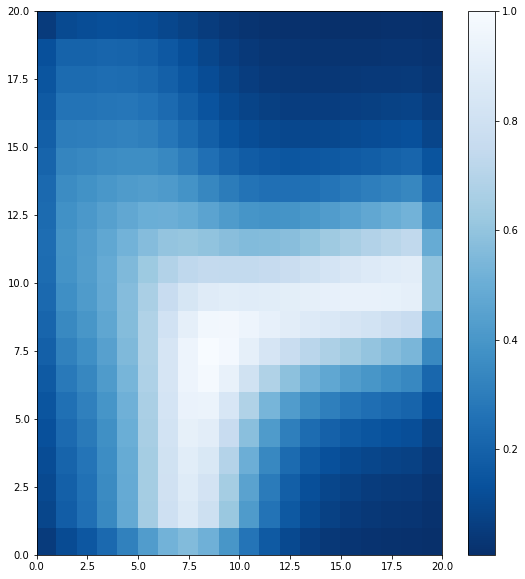

In [1312]:
plt.figure(figsize=(20, 10))
# Plotting the response for each pattern in the iris dataset

plt.subplot(1, 2, 1)
plt.pcolormesh(con_som.distance_map(), cmap='Blues_r')  # plotting the distance map as background
plt.colorbar()
#plt.subplot(1, 2, 2)
#plt.pcolormesh(sar_stat.T, cmap='Blues')
#plt.colorbar()

In [1313]:
cat_som = MiniSom(20, 20, 192, sigma=10, learning_rate=0.5,neighborhood_function='gaussian', random_seed=10)
cat_som.pca_weights_init(cat_var)
cat_som.train_random(cat_var, epochs, verbose=True)

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/minisom.py:296: ComplexWarning: Casting complex values to real discards the imaginary part
  self._weights[i, j] = c1*pc[pc_order[0]] + c2*pc[pc_order[1]]


 [ 20000 / 20000 ] 100% 0.00718 it/s

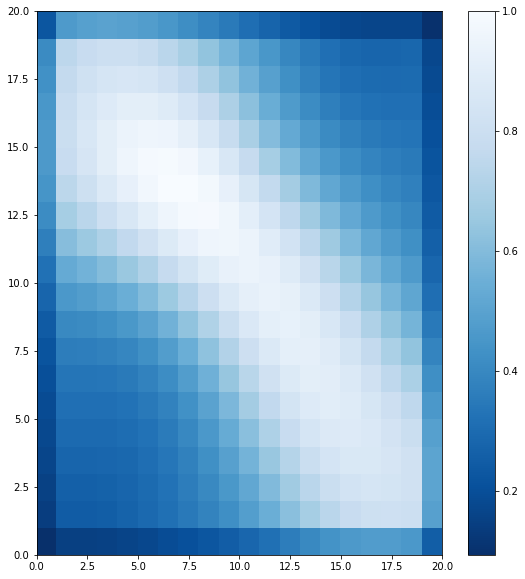

In [1314]:
plt.figure(figsize=(20, 10))
# Plotting the response for each pattern in the iris dataset

plt.subplot(1, 2, 1)
plt.pcolormesh(cat_som.distance_map(), cmap='Blues_r')  # plotting the distance map as background
plt.colorbar()
#plt.subplot(1, 2, 2)
#plt.pcolormesh(sar_stat.T, cmap='Blues')
#plt.colorbar()

In [1315]:
con_mid=con_som.distance_map()
cat_mid=cat_som.distance_map()

con_mid, cat_mid

(array([[0.05229011, 0.11159598, 0.15760831, 0.22475877, 0.31552188,
         0.4228787 , 0.52005986, 0.5613526 , 0.51420066, 0.39764895,
         0.26768099, 0.16601335, 0.10074797, 0.06245247, 0.04036136,
         0.02738532, 0.01957713, 0.01478379, 0.01178997, 0.00696273],
        [0.09022503, 0.18088638, 0.24825823, 0.34765146, 0.48300143,
         0.64425722, 0.79195664, 0.85755922, 0.79043213, 0.61667708,
         0.41989906, 0.26440844, 0.16397577, 0.10494285, 0.07095126,
         0.05100549, 0.03892613, 0.03137625, 0.02651988, 0.01594223],
        [0.10025332, 0.19252458, 0.25711192, 0.35365261, 0.48664615,
         0.64732525, 0.79840526, 0.87262103, 0.81630833, 0.64934724,
         0.45261881, 0.29327506, 0.18885524, 0.12717425, 0.09158111,
         0.07043338, 0.05718837, 0.04843024, 0.04238691, 0.02605843],
        [0.11316299, 0.20836463, 0.26958299, 0.36220972, 0.49148668,
         0.65041158, 0.80495948, 0.89057315, 0.8506815 , 0.69651448,
         0.50349152, 0.34136798

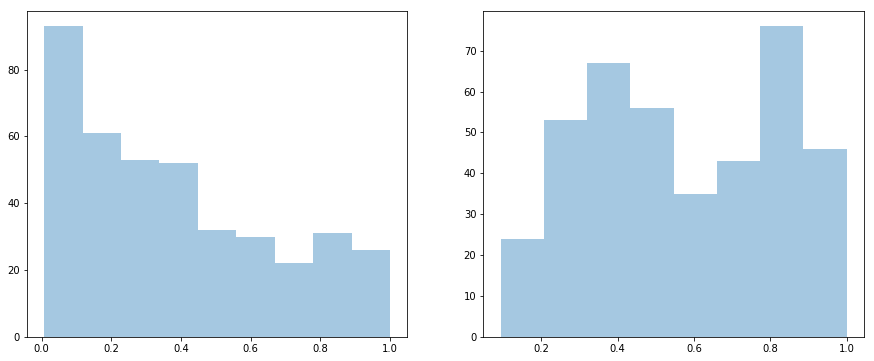

In [1316]:
f, axes = plt.subplots(1, 2 ,figsize=(15, 6))
sns.distplot(con_mid.reshape(1,400) , kde= False ,ax=axes[0])
sns.distplot(cat_mid.reshape(1,400) , kde= False ,ax=axes[1])


In [1317]:
df['Actvy Type Desc Tx'].value_counts()

Action Withheld    9519
Case Opened          59
SAR Filed            45
Name: Actvy Type Desc Tx, dtype: int64

In [1318]:
Actvy_pile_1={'Auto-Closed', 'Action Withheld','Suppressed','Close and Suppress 3 months','Close and Suppress 6 months'}
Actvy_pile_2={'Case Opened'}
Actvy_pile_3={'CTR Filed','Referred for Review','SAR Filed'}

In [1319]:
df.head()

,Acct ID Anonymized,Review Id,Creat Ts,Scnro Short Nm,Actvy Type Desc Tx,ALERT_TYPE,TRAN_AM,TRAN_CT,Months_after_last_Trans,"Cntry Id__104,000,001",Pttrn Id__535,"Pttrn Id__8,000,254",CNTRY_CD__AD,CNTRY_CD__AE,CNTRY_CD__AF,CNTRY_CD__AG,CNTRY_CD__AI,CNTRY_CD__AL,CNTRY_CD__AM,CNTRY_CD__AR,CNTRY_CD__AS,CNTRY_CD__AT,CNTRY_CD__AU,CNTRY_CD__AW,CNTRY_CD__AX,CNTRY_CD__BA,CNTRY_CD__BB,CNTRY_CD__BE,CNTRY_CD__BF,CNTRY_CD__BG,CNTRY_CD__BH,CNTRY_CD__BL,CNTRY_CD__BM,CNTRY_CD__BN,CNTRY_CD__BO,CNTRY_CD__BQ,CNTRY_CD__BR,CNTRY_CD__BS,CNTRY_CD__BT,CNTRY_CD__BW,CNTRY_CD__BY,CNTRY_CD__BZ,CNTRY_CD__CA,CNTRY_CD__CC,CNTRY_CD__CD,CNTRY_CD__CG,CNTRY_CD__CH,CNTRY_CD__CI,CNTRY_CD__CL,CNTRY_CD__CM,CNTRY_CD__CN,CNTRY_CD__CO,CNTRY_CD__CR,CNTRY_CD__CV,CNTRY_CD__CW,CNTRY_CD__CX,CNTRY_CD__CY,CNTRY_CD__CZ,CNTRY_CD__DE,CNTRY_CD__DK,CNTRY_CD__DM,CNTRY_CD__DO,CNTRY_CD__DZ,CNTRY_CD__EC,CNTRY_CD__EE,CNTRY_CD__EG,CNTRY_CD__ER,CNTRY_CD__ES,CNTRY_CD__FI,CNTRY_CD__FJ,CNTRY_CD__FK,CNTRY_CD__FR,CNTRY_CD__GB,CNTRY_CD__GD,CNTRY_CD__GE,CNTRY_CD__GF,CNTRY_CD__GG,CNTRY_CD__GH,CNTRY_CD__GI,CNTRY_CD__GM,CNTRY_CD__GP,CNTRY_CD__GR,CNTRY_CD__GT,CNTRY_CD__GU,CNTRY_CD__HK,CNTRY_CD__HM,CNTRY_CD__HN,CNTRY_CD__HR,CNTRY_CD__HT,CNTRY_CD__HU,CNTRY_CD__ID,CNTRY_CD__IE,CNTRY_CD__IL,CNTRY_CD__IM,CNTRY_CD__IN,CNTRY_CD__IO,CNTRY_CD__IQ,CNTRY_CD__IS,CNTRY_CD__IT,CNTRY_CD__JE,CNTRY_CD__JM,CNTRY_CD__JO,CNTRY_CD__JP,CNTRY_CD__KE,CNTRY_CD__KG,CNTRY_CD__KH,CNTRY_CD__KN,CNTRY_CD__KR,CNTRY_CD__KY,CNTRY_CD__KZ,CNTRY_CD__LA,CNTRY_CD__LB,CNTRY_CD__LC,CNTRY_CD__LI,CNTRY_CD__LK,CNTRY_CD__LS,CNTRY_CD__LT,CNTRY_CD__LU,CNTRY_CD__LV,CNTRY_CD__MA,CNTRY_CD__MC,CNTRY_CD__ME,CNTRY_CD__MF,CNTRY_CD__MG,CNTRY_CD__MH,CNTRY_CD__MM,CNTRY_CD__MN,CNTRY_CD__MO,CNTRY_CD__MP,CNTRY_CD__MQ,CNTRY_CD__MR,CNTRY_CD__MT,CNTRY_CD__MU,CNTRY_CD__MX,CNTRY_CD__MY,CNTRY_CD__MZ,CNTRY_CD__NC,CNTRY_CD__NG,CNTRY_CD__NI,CNTRY_CD__NL,CNTRY_CD__NO,CNTRY_CD__NP,CNTRY_CD__NZ,CNTRY_CD__OM,CNTRY_CD__PA,CNTRY_CD__PE,CNTRY_CD__PF,CNTRY_CD__PH,CNTRY_CD__PK,CNTRY_CD__PL,CNTRY_CD__PR,CNTRY_CD__PS,CNTRY_CD__PT,CNTRY_CD__PW,CNTRY_CD__PY,CNTRY_CD__QA,CNTRY_CD__RO,CNTRY_CD__RS,CNTRY_CD__RU,CNTRY_CD__RW,CNTRY_CD__SA,CNTRY_CD__SC,CNTRY_CD__SE,CNTRY_CD__SG,CNTRY_CD__SI,CNTRY_CD__SK,CNTRY_CD__SM,CNTRY_CD__SN,CNTRY_CD__SO,CNTRY_CD__SV,CNTRY_CD__SX,CNTRY_CD__SZ,CNTRY_CD__TC,CNTRY_CD__TG,CNTRY_CD__TH,CNTRY_CD__TJ,CNTRY_CD__TN,CNTRY_CD__TR,CNTRY_CD__TT,CNTRY_CD__TW,CNTRY_CD__TZ,CNTRY_CD__UA,CNTRY_CD__UG,CNTRY_CD__UM,CNTRY_CD__UY,CNTRY_CD__UZ,CNTRY_CD__VA,CNTRY_CD__VC,CNTRY_CD__VE,CNTRY_CD__VG,CNTRY_CD__VI,CNTRY_CD__VN,CNTRY_CD__VU,CNTRY_CD__WF,CNTRY_CD__WS,CNTRY_CD__XK,CNTRY_CD__YE,CNTRY_CD__ZA,CNTRY_CD__ZW,SRC_SYS_CD__A,SRC_SYS_CD__B
0,1.21987E+17,4001913,2016-02-02,Chng of Acct Bhvr,Action Withheld,New Wire Destination,0.002562,0.0,0.0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
1,1.6878E+109,4116251,2016-07-13,Chng of Acct Bhvr,Action Withheld,New Wire Destination,0.001507,0.0,0.0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
2,10000067881,3982846,2016-01-12,Chng of Acct Bhvr,Action Withheld,New Wire Destination,0.001138,0.0,0.0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

In [1320]:
df['con_neuron']=df.loc[:,df.columns[6:9]].apply(lambda x: con_som.winner(np.array(np.array(x))) , axis=1)

df['con_neuron'] = df['con_neuron'].apply(lambda x: str(x))
df.head()

,Acct ID Anonymized,Review Id,Creat Ts,Scnro Short Nm,Actvy Type Desc Tx,ALERT_TYPE,TRAN_AM,TRAN_CT,Months_after_last_Trans,"Cntry Id__104,000,001",Pttrn Id__535,"Pttrn Id__8,000,254",CNTRY_CD__AD,CNTRY_CD__AE,CNTRY_CD__AF,CNTRY_CD__AG,CNTRY_CD__AI,CNTRY_CD__AL,CNTRY_CD__AM,CNTRY_CD__AR,CNTRY_CD__AS,CNTRY_CD__AT,CNTRY_CD__AU,CNTRY_CD__AW,CNTRY_CD__AX,CNTRY_CD__BA,CNTRY_CD__BB,CNTRY_CD__BE,CNTRY_CD__BF,CNTRY_CD__BG,CNTRY_CD__BH,CNTRY_CD__BL,CNTRY_CD__BM,CNTRY_CD__BN,CNTRY_CD__BO,CNTRY_CD__BQ,CNTRY_CD__BR,CNTRY_CD__BS,CNTRY_CD__BT,CNTRY_CD__BW,CNTRY_CD__BY,CNTRY_CD__BZ,CNTRY_CD__CA,CNTRY_CD__CC,CNTRY_CD__CD,CNTRY_CD__CG,CNTRY_CD__CH,CNTRY_CD__CI,CNTRY_CD__CL,CNTRY_CD__CM,CNTRY_CD__CN,CNTRY_CD__CO,CNTRY_CD__CR,CNTRY_CD__CV,CNTRY_CD__CW,CNTRY_CD__CX,CNTRY_CD__CY,CNTRY_CD__CZ,CNTRY_CD__DE,CNTRY_CD__DK,CNTRY_CD__DM,CNTRY_CD__DO,CNTRY_CD__DZ,CNTRY_CD__EC,CNTRY_CD__EE,CNTRY_CD__EG,CNTRY_CD__ER,CNTRY_CD__ES,CNTRY_CD__FI,CNTRY_CD__FJ,CNTRY_CD__FK,CNTRY_CD__FR,CNTRY_CD__GB,CNTRY_CD__GD,CNTRY_CD__GE,CNTRY_CD__GF,CNTRY_CD__GG,CNTRY_CD__GH,CNTRY_CD__GI,CNTRY_CD__GM,CNTRY_CD__GP,CNTRY_CD__GR,CNTRY_CD__GT,CNTRY_CD__GU,CNTRY_CD__HK,CNTRY_CD__HM,CNTRY_CD__HN,CNTRY_CD__HR,CNTRY_CD__HT,CNTRY_CD__HU,CNTRY_CD__ID,CNTRY_CD__IE,CNTRY_CD__IL,CNTRY_CD__IM,CNTRY_CD__IN,CNTRY_CD__IO,CNTRY_CD__IQ,CNTRY_CD__IS,CNTRY_CD__IT,CNTRY_CD__JE,CNTRY_CD__JM,CNTRY_CD__JO,CNTRY_CD__JP,CNTRY_CD__KE,CNTRY_CD__KG,CNTRY_CD__KH,CNTRY_CD__KN,CNTRY_CD__KR,CNTRY_CD__KY,CNTRY_CD__KZ,CNTRY_CD__LA,CNTRY_CD__LB,CNTRY_CD__LC,CNTRY_CD__LI,CNTRY_CD__LK,CNTRY_CD__LS,CNTRY_CD__LT,CNTRY_CD__LU,CNTRY_CD__LV,CNTRY_CD__MA,CNTRY_CD__MC,CNTRY_CD__ME,CNTRY_CD__MF,CNTRY_CD__MG,CNTRY_CD__MH,CNTRY_CD__MM,CNTRY_CD__MN,CNTRY_CD__MO,CNTRY_CD__MP,CNTRY_CD__MQ,CNTRY_CD__MR,CNTRY_CD__MT,CNTRY_CD__MU,CNTRY_CD__MX,CNTRY_CD__MY,CNTRY_CD__MZ,CNTRY_CD__NC,CNTRY_CD__NG,CNTRY_CD__NI,CNTRY_CD__NL,CNTRY_CD__NO,CNTRY_CD__NP,CNTRY_CD__NZ,CNTRY_CD__OM,CNTRY_CD__PA,CNTRY_CD__PE,CNTRY_CD__PF,CNTRY_CD__PH,CNTRY_CD__PK,CNTRY_CD__PL,CNTRY_CD__PR,CNTRY_CD__PS,CNTRY_CD__PT,CNTRY_CD__PW,CNTRY_CD__PY,CNTRY_CD__QA,CNTRY_CD__RO,CNTRY_CD__RS,CNTRY_CD__RU,CNTRY_CD__RW,CNTRY_CD__SA,CNTRY_CD__SC,CNTRY_CD__SE,CNTRY_CD__SG,CNTRY_CD__SI,CNTRY_CD__SK,CNTRY_CD__SM,CNTRY_CD__SN,CNTRY_CD__SO,CNTRY_CD__SV,CNTRY_CD__SX,CNTRY_CD__SZ,CNTRY_CD__TC,CNTRY_CD__TG,CNTRY_CD__TH,CNTRY_CD__TJ,CNTRY_CD__TN,CNTRY_CD__TR,CNTRY_CD__TT,CNTRY_CD__TW,CNTRY_CD__TZ,CNTRY_CD__UA,CNTRY_CD__UG,CNTRY_CD__UM,CNTRY_CD__UY,CNTRY_CD__UZ,CNTRY_CD__VA,CNTRY_CD__VC,CNTRY_CD__VE,CNTRY_CD__VG,CNTRY_CD__VI,CNTRY_CD__VN,CNTRY_CD__VU,CNTRY_CD__WF,CNTRY_CD__WS,CNTRY_CD__XK,CNTRY_CD__YE,CNTRY_CD__ZA,CNTRY_CD__ZW,SRC_SYS_CD__A,SRC_SYS_CD__B,con_neuron
0,1.21987E+17,4001913,2016-02-02,Chng of Acct Bhvr,Action Withheld,New Wire Destination,0.002562,0.0,0.0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,"(19, 15)"
1,1.6878E+109,4116251,2016-07-13,Chng of Acct Bhvr,Action Withheld,New Wire Destination,0.001507,0.0,0.0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,"(19, 15)"
2,10000067881,3982846,2016-01-12,Chng of Acct Bhvr,Action Withheld,New Wire Destination,0.001138,0.0,0.0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

In [1321]:
df['Actvy Type Desc Tx'].value_counts()

Action Withheld    9519
Case Opened          59
SAR Filed            45
Name: Actvy Type Desc Tx, dtype: int64

In [1322]:
con_df=df.groupby(['con_neuron'])['Actvy Type Desc Tx'].value_counts().unstack().fillna(0)
con_df.index = [str(neuron) for neuron in list(con_df.index)]
con_df=con_df[['Action Withheld','Case Opened','SAR Filed']]
con_df.sort_values( by= ['SAR Filed'] , ascending= False)

Actvy Type Desc Tx,Action Withheld,Case Opened,SAR Filed
"(19, 15)",8114.0,51.0,34.0
"(0, 0)",307.0,0.0,4.0
"(9, 17)",247.0,1.0,2.0
"(0, 19)",128.0,0.0,2.0
"(5, 0)",33.0,1.0,1.0
"(4, 18)",1.0,0.0,1.0
"(13, 1)",5.0,0.0,1.0
"(3, 19)",12.0,0.0,0.0
"(4, 19)",4.0,0.0,0.0
"(4, 17)",2.0,0.0,0.0


In [1323]:
#pile_1_risk = .05
#pile_2_risk = .45
#pile_3_risk = .95

def risk(x):
    return (pile_1_risk *x[0] + pile_2_risk *x[1] + pile_3_risk * x[2]) / sum(x)

In [1324]:
con_df['con_act_risk']=con_df.iloc[:,0:3].apply(lambda activities_of_neuron: risk(activities_of_neuron) , axis=1)

con_df['index']=con_df.index
con_df['con_distance'] = con_df['index'].apply(lambda x: con_mid[int(x[1:-1].split(',')[0]),\
                                                                 int(x[1:-1].split(',')[1])])
con_df=con_df.drop(['index'] , axis=1)
con_df.sort_values( by= ['con_distance'] , ascending= False)

Actvy Type Desc Tx,Action Withheld,Case Opened,SAR Filed,con_act_risk,con_distance
"(9, 17)",247.0,1.0,2.0,0.058800,0.918775
"(9, 18)",2.0,0.0,0.0,0.050000,0.908344
"(7, 11)",1.0,0.0,0.0,0.050000,0.832200
"(6, 10)",1.0,0.0,0.0,0.050000,0.804789
"(2, 9)",1.0,0.0,0.0,0.050000,0.649347
"(7, 15)",1.0,0.0,0.0,0.050000,0.635599
"(7, 16)",1.0,0.0,0.0,0.050000,0.601984
"(9, 19)",1.0,0.0,0.0,0.050000,0.595643
"(7, 18)",3.0,0.0,0.0,0.050000,0.540722
"(8, 19)",2.0,0.0,0.0,0.050000,0.493321


In [1325]:
df['con_distance']=con_df.loc[df['con_neuron'],'con_distance'].reset_index().drop(['index'],axis=1)

df['con_act_risk'] = con_df.loc[df['con_neuron'],'con_act_risk'].reset_index().drop(['index'],axis=1)
df.head()

,Acct ID Anonymized,Review Id,Creat Ts,Scnro Short Nm,Actvy Type Desc Tx,ALERT_TYPE,TRAN_AM,TRAN_CT,Months_after_last_Trans,"Cntry Id__104,000,001",Pttrn Id__535,"Pttrn Id__8,000,254",CNTRY_CD__AD,CNTRY_CD__AE,CNTRY_CD__AF,CNTRY_CD__AG,CNTRY_CD__AI,CNTRY_CD__AL,CNTRY_CD__AM,CNTRY_CD__AR,CNTRY_CD__AS,CNTRY_CD__AT,CNTRY_CD__AU,CNTRY_CD__AW,CNTRY_CD__AX,CNTRY_CD__BA,CNTRY_CD__BB,CNTRY_CD__BE,CNTRY_CD__BF,CNTRY_CD__BG,CNTRY_CD__BH,CNTRY_CD__BL,CNTRY_CD__BM,CNTRY_CD__BN,CNTRY_CD__BO,CNTRY_CD__BQ,CNTRY_CD__BR,CNTRY_CD__BS,CNTRY_CD__BT,CNTRY_CD__BW,CNTRY_CD__BY,CNTRY_CD__BZ,CNTRY_CD__CA,CNTRY_CD__CC,CNTRY_CD__CD,CNTRY_CD__CG,CNTRY_CD__CH,CNTRY_CD__CI,CNTRY_CD__CL,CNTRY_CD__CM,CNTRY_CD__CN,CNTRY_CD__CO,CNTRY_CD__CR,CNTRY_CD__CV,CNTRY_CD__CW,CNTRY_CD__CX,CNTRY_CD__CY,CNTRY_CD__CZ,CNTRY_CD__DE,CNTRY_CD__DK,CNTRY_CD__DM,CNTRY_CD__DO,CNTRY_CD__DZ,CNTRY_CD__EC,CNTRY_CD__EE,CNTRY_CD__EG,CNTRY_CD__ER,CNTRY_CD__ES,CNTRY_CD__FI,CNTRY_CD__FJ,CNTRY_CD__FK,CNTRY_CD__FR,CNTRY_CD__GB,CNTRY_CD__GD,CNTRY_CD__GE,CNTRY_CD__GF,CNTRY_CD__GG,CNTRY_CD__GH,CNTRY_CD__GI,CNTRY_CD__GM,CNTRY_CD__GP,CNTRY_CD__GR,CNTRY_CD__GT,CNTRY_CD__GU,CNTRY_CD__HK,CNTRY_CD__HM,CNTRY_CD__HN,CNTRY_CD__HR,CNTRY_CD__HT,CNTRY_CD__HU,CNTRY_CD__ID,CNTRY_CD__IE,CNTRY_CD__IL,CNTRY_CD__IM,CNTRY_CD__IN,CNTRY_CD__IO,CNTRY_CD__IQ,CNTRY_CD__IS,CNTRY_CD__IT,CNTRY_CD__JE,CNTRY_CD__JM,CNTRY_CD__JO,CNTRY_CD__JP,CNTRY_CD__KE,CNTRY_CD__KG,CNTRY_CD__KH,CNTRY_CD__KN,CNTRY_CD__KR,CNTRY_CD__KY,CNTRY_CD__KZ,CNTRY_CD__LA,CNTRY_CD__LB,CNTRY_CD__LC,CNTRY_CD__LI,CNTRY_CD__LK,CNTRY_CD__LS,CNTRY_CD__LT,CNTRY_CD__LU,CNTRY_CD__LV,CNTRY_CD__MA,CNTRY_CD__MC,CNTRY_CD__ME,CNTRY_CD__MF,CNTRY_CD__MG,CNTRY_CD__MH,CNTRY_CD__MM,CNTRY_CD__MN,CNTRY_CD__MO,CNTRY_CD__MP,CNTRY_CD__MQ,CNTRY_CD__MR,CNTRY_CD__MT,CNTRY_CD__MU,CNTRY_CD__MX,CNTRY_CD__MY,CNTRY_CD__MZ,CNTRY_CD__NC,CNTRY_CD__NG,CNTRY_CD__NI,CNTRY_CD__NL,CNTRY_CD__NO,CNTRY_CD__NP,CNTRY_CD__NZ,CNTRY_CD__OM,CNTRY_CD__PA,CNTRY_CD__PE,CNTRY_CD__PF,CNTRY_CD__PH,CNTRY_CD__PK,CNTRY_CD__PL,CNTRY_CD__PR,CNTRY_CD__PS,CNTRY_CD__PT,CNTRY_CD__PW,CNTRY_CD__PY,CNTRY_CD__QA,CNTRY_CD__RO,CNTRY_CD__RS,CNTRY_CD__RU,CNTRY_CD__RW,CNTRY_CD__SA,CNTRY_CD__SC,CNTRY_CD__SE,CNTRY_CD__SG,CNTRY_CD__SI,CNTRY_CD__SK,CNTRY_CD__SM,CNTRY_CD__SN,CNTRY_CD__SO,CNTRY_CD__SV,CNTRY_CD__SX,CNTRY_CD__SZ,CNTRY_CD__TC,CNTRY_CD__TG,CNTRY_CD__TH,CNTRY_CD__TJ,CNTRY_CD__TN,CNTRY_CD__TR,CNTRY_CD__TT,CNTRY_CD__TW,CNTRY_CD__TZ,CNTRY_CD__UA,CNTRY_CD__UG,CNTRY_CD__UM,CNTRY_CD__UY,CNTRY_CD__UZ,CNTRY_CD__VA,CNTRY_CD__VC,CNTRY_CD__VE,CNTRY_CD__VG,CNTRY_CD__VI,CNTRY_CD__VN,CNTRY_CD__VU,CNTRY_CD__WF,CNTRY_CD__WS,CNTRY_CD__XK,CNTRY_CD__YE,CNTRY_CD__ZA,CNTRY_CD__ZW,SRC_SYS_CD__A,SRC_SYS_CD__B,con_neuron,con_distance,con_act_risk
0,1.21987E+17,4001913,2016-02-02,Chng of Acct Bhvr,Action Withheld,New Wire Destination,0.002562,0.0,0.0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,"(19, 15)",0.010184,0.05622
1,1.6878E+109,4116251,2016-07-13,Chng of Acct Bhvr,Action Withheld,New Wire Destination,0.001507,0.0,0.0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,"(19, 15)",0.010184,0.05622
2,10000067881,3982846,2016-01-12,Chng of Acct Bhvr,Action Withheld,New Wire Destination,0.001138,0.0,0.0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

In [1326]:
df.isna().sum().sum()

0

In [1327]:
df['cat_neuron']=df.loc[:,df.columns[9:201]].apply(lambda x: cat_som.winner(np.array(np.array(x))) , axis=1)

df['cat_neuron'] = df['cat_neuron'].apply(lambda x: str(x))
df.head()

,Acct ID Anonymized,Review Id,Creat Ts,Scnro Short Nm,Actvy Type Desc Tx,ALERT_TYPE,TRAN_AM,TRAN_CT,Months_after_last_Trans,"Cntry Id__104,000,001",Pttrn Id__535,"Pttrn Id__8,000,254",CNTRY_CD__AD,CNTRY_CD__AE,CNTRY_CD__AF,CNTRY_CD__AG,CNTRY_CD__AI,CNTRY_CD__AL,CNTRY_CD__AM,CNTRY_CD__AR,CNTRY_CD__AS,CNTRY_CD__AT,CNTRY_CD__AU,CNTRY_CD__AW,CNTRY_CD__AX,CNTRY_CD__BA,CNTRY_CD__BB,CNTRY_CD__BE,CNTRY_CD__BF,CNTRY_CD__BG,CNTRY_CD__BH,CNTRY_CD__BL,CNTRY_CD__BM,CNTRY_CD__BN,CNTRY_CD__BO,CNTRY_CD__BQ,CNTRY_CD__BR,CNTRY_CD__BS,CNTRY_CD__BT,CNTRY_CD__BW,CNTRY_CD__BY,CNTRY_CD__BZ,CNTRY_CD__CA,CNTRY_CD__CC,CNTRY_CD__CD,CNTRY_CD__CG,CNTRY_CD__CH,CNTRY_CD__CI,CNTRY_CD__CL,CNTRY_CD__CM,CNTRY_CD__CN,CNTRY_CD__CO,CNTRY_CD__CR,CNTRY_CD__CV,CNTRY_CD__CW,CNTRY_CD__CX,CNTRY_CD__CY,CNTRY_CD__CZ,CNTRY_CD__DE,CNTRY_CD__DK,CNTRY_CD__DM,CNTRY_CD__DO,CNTRY_CD__DZ,CNTRY_CD__EC,CNTRY_CD__EE,CNTRY_CD__EG,CNTRY_CD__ER,CNTRY_CD__ES,CNTRY_CD__FI,CNTRY_CD__FJ,CNTRY_CD__FK,CNTRY_CD__FR,CNTRY_CD__GB,CNTRY_CD__GD,CNTRY_CD__GE,CNTRY_CD__GF,CNTRY_CD__GG,CNTRY_CD__GH,CNTRY_CD__GI,CNTRY_CD__GM,CNTRY_CD__GP,CNTRY_CD__GR,CNTRY_CD__GT,CNTRY_CD__GU,CNTRY_CD__HK,CNTRY_CD__HM,CNTRY_CD__HN,CNTRY_CD__HR,CNTRY_CD__HT,CNTRY_CD__HU,CNTRY_CD__ID,CNTRY_CD__IE,CNTRY_CD__IL,CNTRY_CD__IM,CNTRY_CD__IN,CNTRY_CD__IO,CNTRY_CD__IQ,CNTRY_CD__IS,CNTRY_CD__IT,CNTRY_CD__JE,CNTRY_CD__JM,CNTRY_CD__JO,CNTRY_CD__JP,CNTRY_CD__KE,CNTRY_CD__KG,CNTRY_CD__KH,CNTRY_CD__KN,CNTRY_CD__KR,CNTRY_CD__KY,CNTRY_CD__KZ,CNTRY_CD__LA,CNTRY_CD__LB,CNTRY_CD__LC,CNTRY_CD__LI,CNTRY_CD__LK,CNTRY_CD__LS,CNTRY_CD__LT,CNTRY_CD__LU,CNTRY_CD__LV,CNTRY_CD__MA,CNTRY_CD__MC,CNTRY_CD__ME,CNTRY_CD__MF,CNTRY_CD__MG,CNTRY_CD__MH,CNTRY_CD__MM,CNTRY_CD__MN,CNTRY_CD__MO,CNTRY_CD__MP,CNTRY_CD__MQ,CNTRY_CD__MR,CNTRY_CD__MT,CNTRY_CD__MU,CNTRY_CD__MX,CNTRY_CD__MY,CNTRY_CD__MZ,CNTRY_CD__NC,CNTRY_CD__NG,CNTRY_CD__NI,CNTRY_CD__NL,CNTRY_CD__NO,CNTRY_CD__NP,CNTRY_CD__NZ,CNTRY_CD__OM,CNTRY_CD__PA,CNTRY_CD__PE,CNTRY_CD__PF,CNTRY_CD__PH,CNTRY_CD__PK,CNTRY_CD__PL,CNTRY_CD__PR,CNTRY_CD__PS,CNTRY_CD__PT,CNTRY_CD__PW,CNTRY_CD__PY,CNTRY_CD__QA,CNTRY_CD__RO,CNTRY_CD__RS,CNTRY_CD__RU,CNTRY_CD__RW,CNTRY_CD__SA,CNTRY_CD__SC,CNTRY_CD__SE,CNTRY_CD__SG,CNTRY_CD__SI,CNTRY_CD__SK,CNTRY_CD__SM,CNTRY_CD__SN,CNTRY_CD__SO,CNTRY_CD__SV,CNTRY_CD__SX,CNTRY_CD__SZ,CNTRY_CD__TC,CNTRY_CD__TG,CNTRY_CD__TH,CNTRY_CD__TJ,CNTRY_CD__TN,CNTRY_CD__TR,CNTRY_CD__TT,CNTRY_CD__TW,CNTRY_CD__TZ,CNTRY_CD__UA,CNTRY_CD__UG,CNTRY_CD__UM,CNTRY_CD__UY,CNTRY_CD__UZ,CNTRY_CD__VA,CNTRY_CD__VC,CNTRY_CD__VE,CNTRY_CD__VG,CNTRY_CD__VI,CNTRY_CD__VN,CNTRY_CD__VU,CNTRY_CD__WF,CNTRY_CD__WS,CNTRY_CD__XK,CNTRY_CD__YE,CNTRY_CD__ZA,CNTRY_CD__ZW,SRC_SYS_CD__A,SRC_SYS_CD__B,con_neuron,con_distance,con_act_risk,cat_neuron
0,1.21987E+17,4001913,2016-02-02,Chng of Acct Bhvr,Action Withheld,New Wire Destination,0.002562,0.0,0.0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,"(19, 15)",0.010184,0.05622,"(8, 0)"
1,1.6878E+109,4116251,2016-07-13,Chng of Acct Bhvr,Action Withheld,New Wire Destination,0.001507,0.0,0.0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,"(19, 15)",0.010184,0.05622,"(8, 0)"
2,10000067881,3982846,2016-01-12,Chng of Acct Bhvr,Action Withheld,New Wire Destination,0.001138,0.0,0.0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

In [1328]:
cat_df=df.groupby(['cat_neuron'])['Actvy Type Desc Tx'].value_counts().unstack().fillna(0)
cat_df.index = [str(neuron) for neuron in list(cat_df.index)]
cat_df=cat_df[['Action Withheld','Case Opened','SAR Filed']]
cat_df.head()

Actvy Type Desc Tx,Action Withheld,Case Opened,SAR Filed
"(0, 0)",358.0,0.0,2.0
"(0, 10)",163.0,1.0,1.0
"(0, 11)",119.0,1.0,0.0
"(0, 13)",183.0,0.0,0.0
"(0, 19)",678.0,3.0,1.0


In [1329]:
cat_df['cat_act_risk']=cat_df.iloc[:,0:3].apply(lambda activities_of_neuron: risk(activities_of_neuron) , axis=1)

cat_df['index']=cat_df.index
cat_df['cat_distance'] = cat_df['index'].apply(lambda x: cat_mid[int(x[1:-1].split(',')[0]),\
                                                                 int(x[1:-1].split(',')[1])])
cat_df=cat_df.drop(['index'] , axis=1)
cat_df.sort_values( by= ['cat_distance'] , ascending= False)


Actvy Type Desc Tx,Action Withheld,Case Opened,SAR Filed,cat_act_risk,cat_distance
"(12, 13)",133.0,1.0,0.0,0.052985,0.669077
"(14, 13)",13.0,0.0,0.0,0.050000,0.521706
"(6, 7)",165.0,0.0,0.0,0.050000,0.478713
"(19, 6)",482.0,7.0,6.0,0.066566,0.452304
"(0, 13)",183.0,0.0,0.0,0.050000,0.402932
"(7, 19)",537.0,9.0,1.0,0.058227,0.384390
"(11, 0)",253.0,1.0,0.0,0.051575,0.369500
"(7, 2)",39.0,0.0,0.0,0.050000,0.365402
"(0, 11)",119.0,1.0,0.0,0.053333,0.320146
"(0, 10)",163.0,1.0,1.0,0.057879,0.282307


In [1330]:
df['cat_distance']=cat_df.loc[df['cat_neuron'],'cat_distance'].reset_index().drop(['index'],axis=1)

df['cat_act_risk'] = cat_df.loc[df['cat_neuron'],'cat_act_risk'].reset_index().drop(['index'],axis=1)
df.head()

,Acct ID Anonymized,Review Id,Creat Ts,Scnro Short Nm,Actvy Type Desc Tx,ALERT_TYPE,TRAN_AM,TRAN_CT,Months_after_last_Trans,"Cntry Id__104,000,001",Pttrn Id__535,"Pttrn Id__8,000,254",CNTRY_CD__AD,CNTRY_CD__AE,CNTRY_CD__AF,CNTRY_CD__AG,CNTRY_CD__AI,CNTRY_CD__AL,CNTRY_CD__AM,CNTRY_CD__AR,CNTRY_CD__AS,CNTRY_CD__AT,CNTRY_CD__AU,CNTRY_CD__AW,CNTRY_CD__AX,CNTRY_CD__BA,CNTRY_CD__BB,CNTRY_CD__BE,CNTRY_CD__BF,CNTRY_CD__BG,CNTRY_CD__BH,CNTRY_CD__BL,CNTRY_CD__BM,CNTRY_CD__BN,CNTRY_CD__BO,CNTRY_CD__BQ,CNTRY_CD__BR,CNTRY_CD__BS,CNTRY_CD__BT,CNTRY_CD__BW,CNTRY_CD__BY,CNTRY_CD__BZ,CNTRY_CD__CA,CNTRY_CD__CC,CNTRY_CD__CD,CNTRY_CD__CG,CNTRY_CD__CH,CNTRY_CD__CI,CNTRY_CD__CL,CNTRY_CD__CM,CNTRY_CD__CN,CNTRY_CD__CO,CNTRY_CD__CR,CNTRY_CD__CV,CNTRY_CD__CW,CNTRY_CD__CX,CNTRY_CD__CY,CNTRY_CD__CZ,CNTRY_CD__DE,CNTRY_CD__DK,CNTRY_CD__DM,CNTRY_CD__DO,CNTRY_CD__DZ,CNTRY_CD__EC,CNTRY_CD__EE,CNTRY_CD__EG,CNTRY_CD__ER,CNTRY_CD__ES,CNTRY_CD__FI,CNTRY_CD__FJ,CNTRY_CD__FK,CNTRY_CD__FR,CNTRY_CD__GB,CNTRY_CD__GD,CNTRY_CD__GE,CNTRY_CD__GF,CNTRY_CD__GG,CNTRY_CD__GH,CNTRY_CD__GI,CNTRY_CD__GM,CNTRY_CD__GP,CNTRY_CD__GR,CNTRY_CD__GT,CNTRY_CD__GU,CNTRY_CD__HK,CNTRY_CD__HM,CNTRY_CD__HN,CNTRY_CD__HR,CNTRY_CD__HT,CNTRY_CD__HU,CNTRY_CD__ID,CNTRY_CD__IE,CNTRY_CD__IL,CNTRY_CD__IM,CNTRY_CD__IN,CNTRY_CD__IO,CNTRY_CD__IQ,CNTRY_CD__IS,CNTRY_CD__IT,CNTRY_CD__JE,CNTRY_CD__JM,CNTRY_CD__JO,CNTRY_CD__JP,CNTRY_CD__KE,CNTRY_CD__KG,CNTRY_CD__KH,CNTRY_CD__KN,CNTRY_CD__KR,CNTRY_CD__KY,CNTRY_CD__KZ,CNTRY_CD__LA,CNTRY_CD__LB,CNTRY_CD__LC,CNTRY_CD__LI,CNTRY_CD__LK,CNTRY_CD__LS,CNTRY_CD__LT,CNTRY_CD__LU,CNTRY_CD__LV,CNTRY_CD__MA,CNTRY_CD__MC,CNTRY_CD__ME,CNTRY_CD__MF,CNTRY_CD__MG,CNTRY_CD__MH,CNTRY_CD__MM,CNTRY_CD__MN,CNTRY_CD__MO,CNTRY_CD__MP,CNTRY_CD__MQ,CNTRY_CD__MR,CNTRY_CD__MT,CNTRY_CD__MU,CNTRY_CD__MX,CNTRY_CD__MY,CNTRY_CD__MZ,CNTRY_CD__NC,CNTRY_CD__NG,CNTRY_CD__NI,CNTRY_CD__NL,CNTRY_CD__NO,CNTRY_CD__NP,CNTRY_CD__NZ,CNTRY_CD__OM,CNTRY_CD__PA,CNTRY_CD__PE,CNTRY_CD__PF,CNTRY_CD__PH,CNTRY_CD__PK,CNTRY_CD__PL,CNTRY_CD__PR,CNTRY_CD__PS,CNTRY_CD__PT,CNTRY_CD__PW,CNTRY_CD__PY,CNTRY_CD__QA,CNTRY_CD__RO,CNTRY_CD__RS,CNTRY_CD__RU,CNTRY_CD__RW,CNTRY_CD__SA,CNTRY_CD__SC,CNTRY_CD__SE,CNTRY_CD__SG,CNTRY_CD__SI,CNTRY_CD__SK,CNTRY_CD__SM,CNTRY_CD__SN,CNTRY_CD__SO,CNTRY_CD__SV,CNTRY_CD__SX,CNTRY_CD__SZ,CNTRY_CD__TC,CNTRY_CD__TG,CNTRY_CD__TH,CNTRY_CD__TJ,CNTRY_CD__TN,CNTRY_CD__TR,CNTRY_CD__TT,CNTRY_CD__TW,CNTRY_CD__TZ,CNTRY_CD__UA,CNTRY_CD__UG,CNTRY_CD__UM,CNTRY_CD__UY,CNTRY_CD__UZ,CNTRY_CD__VA,CNTRY_CD__VC,CNTRY_CD__VE,CNTRY_CD__VG,CNTRY_CD__VI,CNTRY_CD__VN,CNTRY_CD__VU,CNTRY_CD__WF,CNTRY_CD__WS,CNTRY_CD__XK,CNTRY_CD__YE,CNTRY_CD__ZA,CNTRY_CD__ZW,SRC_SYS_CD__A,SRC_SYS_CD__B,con_neuron,con_distance,con_act_risk,cat_neuron,cat_distance,cat_act_risk
0,1.21987E+17,4001913,2016-02-02,Chng of Acct Bhvr,Action Withheld,New Wire Destination,0.002562,0.0,0.0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,"(19, 15)",0.010184,0.05622,"(8, 0)",0.243409,0.053348
1,1.6878E+109,4116251,2016-07-13,Chng of Acct Bhvr,Action Withheld,New Wire Destination,0.001507,0.0,0.0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,"(19, 15)",0.010184,0.05622,"(8, 0)",0.243409,0.053348
2,10000067881,3982846,2016-01-12,Chng of Acct Bhvr,Action Withheld,New Wire Destination,0.001138,0.0,0.0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

In [1331]:
con_coef= .6
cat_coef= .2
con_act_coef , cat_act_coef= .1 , .1

In [1332]:
df['Risk'] = con_coef * df['con_distance'] + cat_coef * df['cat_distance'] + \
             con_act_coef * df['con_act_risk']  + cat_act_coef * df['cat_act_risk']

df.head()

,Acct ID Anonymized,Review Id,Creat Ts,Scnro Short Nm,Actvy Type Desc Tx,ALERT_TYPE,TRAN_AM,TRAN_CT,Months_after_last_Trans,"Cntry Id__104,000,001",Pttrn Id__535,"Pttrn Id__8,000,254",CNTRY_CD__AD,CNTRY_CD__AE,CNTRY_CD__AF,CNTRY_CD__AG,CNTRY_CD__AI,CNTRY_CD__AL,CNTRY_CD__AM,CNTRY_CD__AR,CNTRY_CD__AS,CNTRY_CD__AT,CNTRY_CD__AU,CNTRY_CD__AW,CNTRY_CD__AX,CNTRY_CD__BA,CNTRY_CD__BB,CNTRY_CD__BE,CNTRY_CD__BF,CNTRY_CD__BG,CNTRY_CD__BH,CNTRY_CD__BL,CNTRY_CD__BM,CNTRY_CD__BN,CNTRY_CD__BO,CNTRY_CD__BQ,CNTRY_CD__BR,CNTRY_CD__BS,CNTRY_CD__BT,CNTRY_CD__BW,CNTRY_CD__BY,CNTRY_CD__BZ,CNTRY_CD__CA,CNTRY_CD__CC,CNTRY_CD__CD,CNTRY_CD__CG,CNTRY_CD__CH,CNTRY_CD__CI,CNTRY_CD__CL,CNTRY_CD__CM,CNTRY_CD__CN,CNTRY_CD__CO,CNTRY_CD__CR,CNTRY_CD__CV,CNTRY_CD__CW,CNTRY_CD__CX,CNTRY_CD__CY,CNTRY_CD__CZ,CNTRY_CD__DE,CNTRY_CD__DK,CNTRY_CD__DM,CNTRY_CD__DO,CNTRY_CD__DZ,CNTRY_CD__EC,CNTRY_CD__EE,CNTRY_CD__EG,CNTRY_CD__ER,CNTRY_CD__ES,CNTRY_CD__FI,CNTRY_CD__FJ,CNTRY_CD__FK,CNTRY_CD__FR,CNTRY_CD__GB,CNTRY_CD__GD,CNTRY_CD__GE,CNTRY_CD__GF,CNTRY_CD__GG,CNTRY_CD__GH,CNTRY_CD__GI,CNTRY_CD__GM,CNTRY_CD__GP,CNTRY_CD__GR,CNTRY_CD__GT,CNTRY_CD__GU,CNTRY_CD__HK,CNTRY_CD__HM,CNTRY_CD__HN,CNTRY_CD__HR,CNTRY_CD__HT,CNTRY_CD__HU,CNTRY_CD__ID,CNTRY_CD__IE,CNTRY_CD__IL,CNTRY_CD__IM,CNTRY_CD__IN,CNTRY_CD__IO,CNTRY_CD__IQ,CNTRY_CD__IS,CNTRY_CD__IT,CNTRY_CD__JE,CNTRY_CD__JM,CNTRY_CD__JO,CNTRY_CD__JP,CNTRY_CD__KE,CNTRY_CD__KG,CNTRY_CD__KH,CNTRY_CD__KN,CNTRY_CD__KR,CNTRY_CD__KY,CNTRY_CD__KZ,CNTRY_CD__LA,CNTRY_CD__LB,CNTRY_CD__LC,CNTRY_CD__LI,CNTRY_CD__LK,CNTRY_CD__LS,CNTRY_CD__LT,CNTRY_CD__LU,CNTRY_CD__LV,CNTRY_CD__MA,CNTRY_CD__MC,CNTRY_CD__ME,CNTRY_CD__MF,CNTRY_CD__MG,CNTRY_CD__MH,CNTRY_CD__MM,CNTRY_CD__MN,CNTRY_CD__MO,CNTRY_CD__MP,CNTRY_CD__MQ,CNTRY_CD__MR,CNTRY_CD__MT,CNTRY_CD__MU,CNTRY_CD__MX,CNTRY_CD__MY,CNTRY_CD__MZ,CNTRY_CD__NC,CNTRY_CD__NG,CNTRY_CD__NI,CNTRY_CD__NL,CNTRY_CD__NO,CNTRY_CD__NP,CNTRY_CD__NZ,CNTRY_CD__OM,CNTRY_CD__PA,CNTRY_CD__PE,CNTRY_CD__PF,CNTRY_CD__PH,CNTRY_CD__PK,CNTRY_CD__PL,CNTRY_CD__PR,CNTRY_CD__PS,CNTRY_CD__PT,CNTRY_CD__PW,CNTRY_CD__PY,CNTRY_CD__QA,CNTRY_CD__RO,CNTRY_CD__RS,CNTRY_CD__RU,CNTRY_CD__RW,CNTRY_CD__SA,CNTRY_CD__SC,CNTRY_CD__SE,CNTRY_CD__SG,CNTRY_CD__SI,CNTRY_CD__SK,CNTRY_CD__SM,CNTRY_CD__SN,CNTRY_CD__SO,CNTRY_CD__SV,CNTRY_CD__SX,CNTRY_CD__SZ,CNTRY_CD__TC,CNTRY_CD__TG,CNTRY_CD__TH,CNTRY_CD__TJ,CNTRY_CD__TN,CNTRY_CD__TR,CNTRY_CD__TT,CNTRY_CD__TW,CNTRY_CD__TZ,CNTRY_CD__UA,CNTRY_CD__UG,CNTRY_CD__UM,CNTRY_CD__UY,CNTRY_CD__UZ,CNTRY_CD__VA,CNTRY_CD__VC,CNTRY_CD__VE,CNTRY_CD__VG,CNTRY_CD__VI,CNTRY_CD__VN,CNTRY_CD__VU,CNTRY_CD__WF,CNTRY_CD__WS,CNTRY_CD__XK,CNTRY_CD__YE,CNTRY_CD__ZA,CNTRY_CD__ZW,SRC_SYS_CD__A,SRC_SYS_CD__B,con_neuron,con_distance,con_act_risk,cat_neuron,cat_distance,cat_act_risk,Risk
0,1.21987E+17,4001913,2016-02-02,Chng of Acct Bhvr,Action Withheld,New Wire Destination,0.002562,0.0,0.0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,"(19, 15)",0.010184,0.05622,"(8, 0)",0.243409,0.053348,0.065749
1,1.6878E+109,4116251,2016-07-13,Chng of Acct Bhvr,Action Withheld,New Wire Destination,0.001507,0.0,0.0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,"(19, 15)",0.010184,0.05622,"(8, 0)",0.243409,0.053348,0.065749
2,10000067881,3982846,2016-01-12,Chng of Acct Bhvr,Action Withheld,New Wire Destination,0.001138,0.0,0.0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

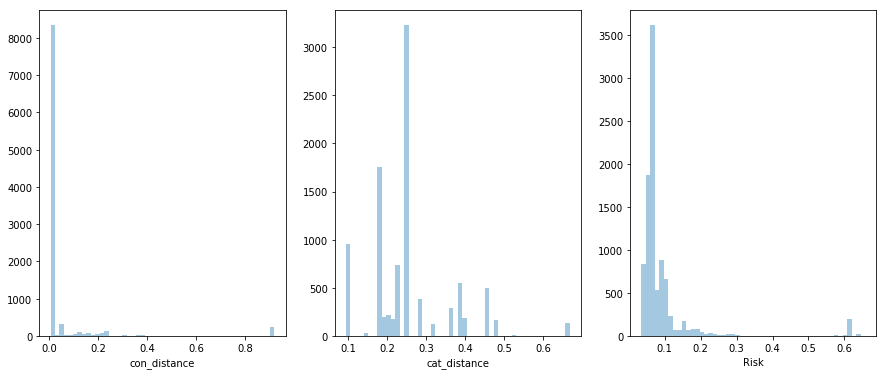

In [1333]:
f, axes = plt.subplots(1, 3 ,figsize=(15, 6))
sns.distplot(df['con_distance'] , kde= False ,ax=axes[0])
sns.distplot(df['cat_distance'] , kde= False ,ax=axes[1])
sns.distplot(df['Risk'] , kde= False ,ax=axes[2])

In [1336]:
df.columns

Index(['Acct ID Anonymized', 'Review Id', 'Creat Ts', 'Scnro Short Nm', 'Actvy Type Desc Tx', 'ALERT_TYPE', 'TRAN_AM', 'TRAN_CT', 'Months_after_last_Trans', 'Cntry Id__104,000,001',
       ...
       'CNTRY_CD__ZW', 'SRC_SYS_CD__A', 'SRC_SYS_CD__B', 'con_neuron', 'con_distance', 'con_act_risk', 'cat_neuron', 'cat_distance', 'cat_act_risk', 'Risk'], dtype='object', length=208)

In [1338]:
df_chng_newdes_final= pd.merge(backup_chng_newDest , df[['Review Id','con_neuron', 'con_distance', 'con_act_risk', \
                               'cat_neuron', 'cat_distance', 'cat_act_risk' ,'Risk']] , on = 'Review Id' , how= 'inner')

del backup_chng_newDest

In [1339]:
df_chng_newdes_final.sort_values(by= ['Risk'], ascending = False)

,Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Scnro Short Nm,Actvy Type Desc Tx,ALERT_TYPE,CNTRY_CD,SRC_SYS_CD,TRAN_AM,TRAN_CT,Months_after_last_Trans,con_neuron,con_distance,con_act_risk,cat_neuron,cat_distance,cat_act_risk,Risk
6680,45191964003,4123443,2016-07-27,"104,000,001","8,000,254",Chng of Acct Bhvr,Action Withheld,New Wire Destination,IE,A,20000,1,0,"(9, 17)",0.918775,0.058800,"(6, 7)",0.478713,0.050000,0.657888
5973,35341114280,4097767,2016-06-22,"104,000,001","8,000,254",Chng of Acct Bhvr,Action Withheld,New Wire Destination,IE,A,20000,1,0,"(9, 17)",0.918775,0.058800,"(6, 7)",0.478713,0.050000,0.657888
8326,71911413071,4190527,2016-11-02,"104,000,001","8,000,254",Chng of Acct Bhvr,Action Withheld,New Wire Destination,IE,A,20000,1,0,"(9, 17)",0.918775,0.058800,"(6, 7)",0.478713,0.050000,0.657888
809,12229937753,4090982,2016-06-07,"104,000,001","8,000,254",Chng of Acct Bhvr,Action Withheld,New Wire Destination,DE,A,20000,1,0,"(9, 17)",0.918775,0.058800,"(0, 13)",0.402932,0.050000,0.642732
5296,27702552703,4007735,2016-02-11,"104,000,001","8,000,254",Chng of Acct Bhvr,Action Withheld,New Wire Destination,DE,A,20000,1,0,"(9, 17)",0.918775,0.058800,"(0, 13)",0.402932,0.050000,0.642732
7000,49550890063,4015277,2016-02-25,"104,000,001","8,000,254",Chng of Acct Bhvr,Action Withheld,New Wire Destination,DE,A,20000,1,0,"(9, 17)",0.918775,0.058800,"(0, 13)",0.402932,0.050000,0.642732
950,12634335787,4081427,2016-05-27,"104,000,001","8,000,254",Chng of Acct Bhvr,Action Withheld,New Wire Destination,DE,A,20000,1,0,"(9, 17)",0.918775,0.058800,"(0, 13)",0.402932,0.050000,0.642732
3628,21505208309,4190524,2016-11-02,"104,000,001","8,000,254",Chng of Acct Bhvr,Action Withheld,New Wire Destination,DE,A,20000,1,0,"(9, 17)",0.918775,0.058800,"(0, 13)",0.402932,0.050000,0.642732
1309,13689059316,4315537,2017-04-26,"104,000,001","8,000,254",Chng of Acct Bhvr,Action Withheld,New Wire Destination,DE,A,20000,1,0,"(9, 17)",0.918775,0.058800,"(0, 13)",0.402932,0.050000,0.642732
112,10288910525,4028253,2016-03-10,"104,000,001","8,000,254",Chng of Acct Bhvr,Action Withheld,New Wire Destination,DE,A,20000,1,0,"(9, 17)",0.918775,0.058800,"(0, 13)",0.402932,0.050000,0.642732


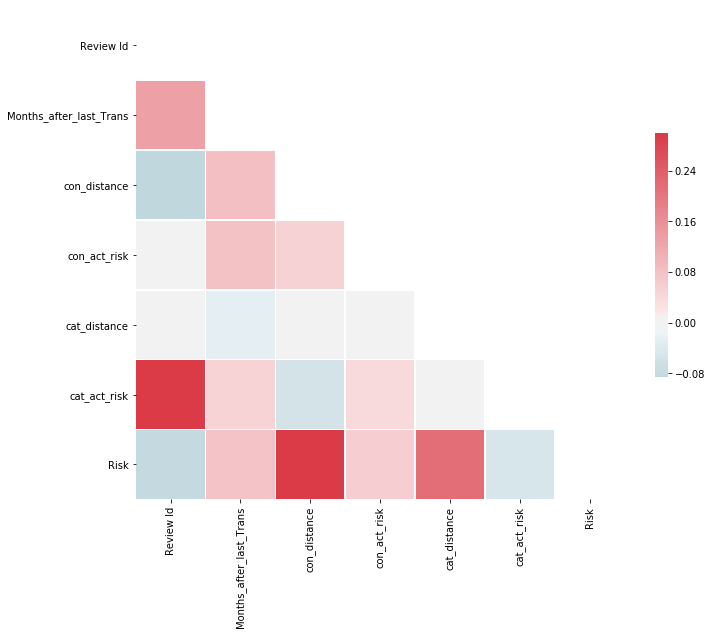

In [1340]:
# Compute the correlation matrix
corr = df_chng_newdes_final.corr()

# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

In [1341]:
from scipy import stats
F, p = stats.f_oneway(df_chng_newdes_final[df_chng_newdes_final['SRC_SYS_CD']=='A'].Risk,
                      df_chng_newdes_final[df_chng_newdes_final['SRC_SYS_CD']=='B'].Risk)
F , p

(0.042117771266334286, 0.8373997838023164)

In [ ]:
df=other_df

In [1343]:
result = pd.crosstab([df['Acct ID Anonymized'] , df['Review Id'] , df['Creat Ts'] , df['Cntry Id'] , \
              df['Pttrn Id'] , df['Scnro Short Nm'] , df['Actvy Type Desc Tx']], df['Bindg Nm'] , \
            values=df['Value Tx'] , \
            aggfunc='sum')

In [1344]:
%who DataFrame

backup_chng	 backup_chng_newDest	 backup_df	 cat_df	 con_df	 corr	 df	 df1	 df2	 
df_chng_newdes_final	 df_chng_other_alerts_final	 df_final	 other_df	 remained_chng_act_in_income	 result	 temp	 


In [1345]:
#del ali_df, changact_in_income , chng_acct_df, income_df , remained_chng_act_in_income , temp , test

In [1346]:
df=result.reset_index().rename_axis("", axis="columns")
df.head()

,Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Scnro Short Nm,Actvy Type Desc Tx,ALERT_TYPE,CURR_MTH_AM,CURR_MTH_CT,HIGH_RISK_SCORE,PRIOR_MAX_AM,PRIOR_MAX_CT,SRC_SYS_CD
0,1.41138E+17,4693173,2018-04-30,"104,000,001",595,Chng of Acct Bhvr,Action Withheld,Check Withdrawals,152000,12,NaN,0,0,A
1,1.63045E+11,4529834,2017-10-31,"104,000,001","8,000,253",Chng of Acct Bhvr,Action Withheld,Third Party Incoming Journals,90391.5,14,NaN,0,0,A
2,1.76192E+26,4693150,2018-04-30,"104,000,001",595,Chng of Acct Bhvr,Action Withheld,Electronic Transfer Withdrawals,1.78692e+06,26,NaN,609050,13,A
3,10001463480,4636357,2018-02-28,"104,000,001","8,000,253",Chng of Acct Bhvr,Action Withheld,Third Party Outgoing Journals,78284.7,6,NaN,0,0,A
4,10001557217,4125305,2016-07-29,"104,000,001","8,000,253",Chng of Acct Bhvr,Action Withheld,Electronic Transfer Deposits,1e+06,10,NaN,0,0,A


In [1347]:
del result

In [1348]:
df.shape

(17844, 14)

In [1349]:
df.isna().sum()


Acct ID Anonymized        0
Review Id                 0
Creat Ts                  0
Cntry Id                  0
Pttrn Id                  0
Scnro Short Nm            0
Actvy Type Desc Tx        0
ALERT_TYPE                0
CURR_MTH_AM               0
CURR_MTH_CT               0
HIGH_RISK_SCORE       17279
PRIOR_MAX_AM              0
PRIOR_MAX_CT              0
SRC_SYS_CD                0
dtype: int64

In [1350]:
df=df.drop(['HIGH_RISK_SCORE'] , axis=1)

In [1351]:
df.isna().sum()


Acct ID Anonymized    0
Review Id             0
Creat Ts              0
Cntry Id              0
Pttrn Id              0
Scnro Short Nm        0
Actvy Type Desc Tx    0
ALERT_TYPE            0
CURR_MTH_AM           0
CURR_MTH_CT           0
PRIOR_MAX_AM          0
PRIOR_MAX_CT          0
SRC_SYS_CD            0
dtype: int64

In [1352]:
df.dtypes


Acct ID Anonymized            object
Review Id                      int64
Creat Ts              datetime64[ns]
Cntry Id                      object
Pttrn Id                      object
Scnro Short Nm                object
Actvy Type Desc Tx            object
ALERT_TYPE                    object
CURR_MTH_AM                   object
CURR_MTH_CT                   object
PRIOR_MAX_AM                  object
PRIOR_MAX_CT                  object
SRC_SYS_CD                    object
dtype: object

In [1353]:
df['SRC_SYS_CD'].value_counts()

A    14876
B     2968
Name: SRC_SYS_CD, dtype: int64

In [1354]:
df['ALERT_TYPE'].value_counts()

Third Party Incoming Journals      4196
Electronic Transfer Deposits       3610
Third Party Outgoing Journals      3599
Electronic Transfer Withdrawals    3253
Check Withdrawals                  2650
Check Deposits                      389
Cash Equivalent Deposits            147
Name: ALERT_TYPE, dtype: int64

In [1355]:
df['Months_after_last_Trans']=df.groupby(['Acct ID Anonymized'])['Creat Ts']. \
                                          diff().fillna(0).apply(lambda x : math.ceil(x / np.timedelta64(1, 'M')))

In [1356]:
df['CURR_MTH_CT']=df['CURR_MTH_CT'].astype('int')
df['CURR_MTH_AM']=df['CURR_MTH_AM'].astype('float')
df['PRIOR_MAX_CT']=df['PRIOR_MAX_CT'].astype('int')
df['PRIOR_MAX_AM']=df['PRIOR_MAX_AM'].astype('float')

In [1357]:
backup_chng_otherAlerts=df.copy()
df=backup_chng_otherAlerts.copy()

In [1358]:
df['CURR_MTH_CT']

0         12
1         14
2         26
3          6
4         10
5         11
6         10
7         13
8         12
9         22
10        11
11        27
12        18
13        13
14        12
15        15
16        12
17        19
18        24
19        14
20        14
21        12
22        17
23        51
24        10
25        18
26        12
27        15
28        12
29        21
30         7
31         8
32        12
33        61
34        14
35         9
36        12
37        24
38        15
39        13
40        10
41        13
42         8
43        75
44         7
45        45
46         6
47        10
48        20
49        10
50        17
51        17
52         8
53        10
54        19
55         6
56        36
57        10
58        14
59        13
60        12
61        59
62        20
63        43
64        23
65        17
66        15
67         7
68        20
69        41
70        12
71        21
72        50
73       141
74        18
75        11
76        17

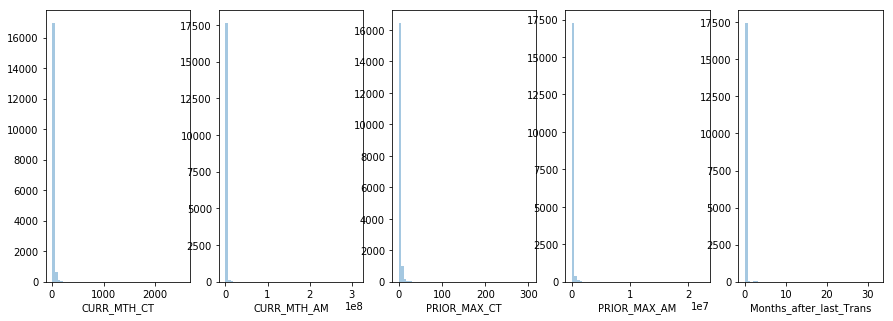

In [1359]:
f, axes = plt.subplots(1, 5 ,figsize=(15, 5))

sns.distplot(df['CURR_MTH_CT'] , kde= False ,ax=axes[0])
sns.distplot(df['CURR_MTH_AM'] , kde= False ,ax=axes[1])
sns.distplot(df['PRIOR_MAX_CT'] , kde= False ,ax=axes[2])
sns.distplot(df['PRIOR_MAX_AM'] , kde= False ,ax=axes[3])
sns.distplot(df['Months_after_last_Trans'] , kde= False ,ax=axes[4])

In [1360]:
#threshold= 3

zscore_CURR_MTH_CT=pd.Series(np.abs(stats.zscore(df['CURR_MTH_CT'])))
zscore_CURR_MTH_AM=pd.Series(np.abs(stats.zscore(df['CURR_MTH_AM'])))
zscore_PRIOR_MAX_CT=pd.Series(np.abs(stats.zscore(df['PRIOR_MAX_CT'])))
zscore_PRIOR_MAX_AM=pd.Series(np.abs(stats.zscore(df['PRIOR_MAX_AM'])))
#zscore_Months_after_last_Trans =pd.Series(np.abs(stats.zscore(df['Months_after_last_Trans'])))

In [1361]:
desired_records = (zscore_CURR_MTH_CT < threshold) & (zscore_CURR_MTH_AM < threshold) \
                 & (zscore_PRIOR_MAX_CT < threshold) & (zscore_PRIOR_MAX_AM < threshold)
sum(desired_records)

17372

In [1362]:
temp=df[~desired_records]

len(temp['Acct ID Anonymized'].unique()) / len(df['Acct ID Anonymized'].unique())

0.026904176904176905

In [1363]:
outliers_chng_new_wire_transfer = temp['Acct ID Anonymized'].unique()
len(outliers_chng_new_wire_transfer)

438

In [1364]:
df= df[desired_records].reset_index().drop(['index'] , axis=1)

In [1365]:
df.shape

(17372, 14)

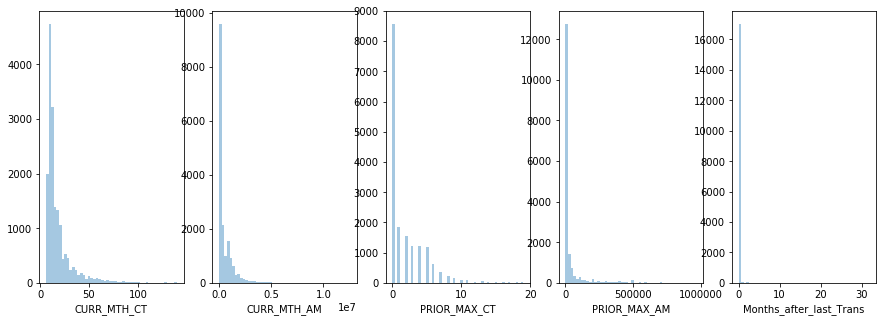

In [1366]:
f, axes = plt.subplots(1, 5 ,figsize=(15, 5))

sns.distplot(df['CURR_MTH_CT'] , kde= False ,ax=axes[0])
sns.distplot(df['CURR_MTH_AM'] , kde= False ,ax=axes[1])
sns.distplot(df['PRIOR_MAX_CT'] , kde= False ,ax=axes[2])
sns.distplot(df['PRIOR_MAX_AM'] , kde= False ,ax=axes[3])
sns.distplot(df['Months_after_last_Trans'] , kde= False ,ax=axes[4])

Text(0.5, 1.0, 'Months_after_last_Trans')

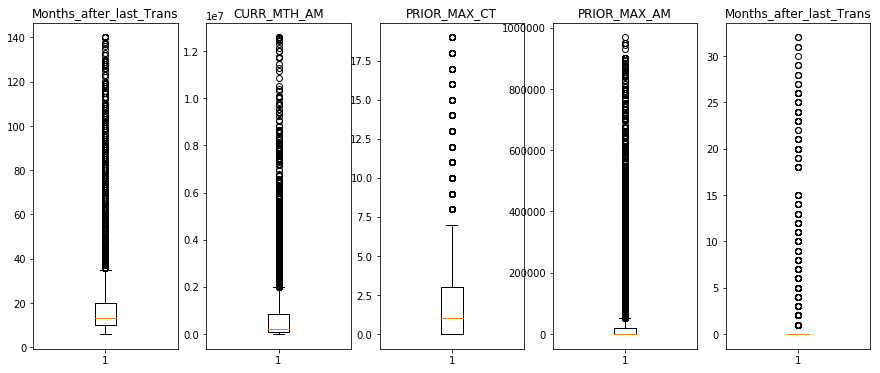

In [1367]:
# Create a figure instance
fig = plt.figure(1, figsize=(15, 6))

# Create an axes instance
ax1 = fig.add_subplot(151)
ax2 = fig.add_subplot(152)
ax3 = fig.add_subplot(153)
ax4 = fig.add_subplot(154)
ax5 = fig.add_subplot(155)

# Create the boxplot
ax1.boxplot(df['CURR_MTH_CT'])
ax1.set_title('Months_after_last_Trans')

ax2.boxplot(df['CURR_MTH_AM'])
ax2.set_title('CURR_MTH_AM')

ax3.boxplot(df['PRIOR_MAX_CT'])
ax3.set_title('PRIOR_MAX_CT')

ax4.boxplot(df['PRIOR_MAX_AM'])
ax4.set_title('PRIOR_MAX_AM')

ax5.boxplot(df['Months_after_last_Trans'])
ax5.set_title('Months_after_last_Trans')

In [1368]:
cat_columns = ["Cntry Id","Pttrn Id","ALERT_TYPE", "SRC_SYS_CD"]

In [1369]:
df = pd.get_dummies(df, prefix_sep="__",
                              columns=cat_columns)
df.head()

,Acct ID Anonymized,Review Id,Creat Ts,Scnro Short Nm,Actvy Type Desc Tx,CURR_MTH_AM,CURR_MTH_CT,PRIOR_MAX_AM,PRIOR_MAX_CT,Months_after_last_Trans,"Cntry Id__104,000,001",Pttrn Id__595,"Pttrn Id__8,000,253",ALERT_TYPE__Cash Equivalent Deposits,ALERT_TYPE__Check Deposits,ALERT_TYPE__Check Withdrawals,ALERT_TYPE__Electronic Transfer Deposits,ALERT_TYPE__Electronic Transfer Withdrawals,ALERT_TYPE__Third Party Incoming Journals,ALERT_TYPE__Third Party Outgoing Journals,SRC_SYS_CD__A,SRC_SYS_CD__B
0,1.41138E+17,4693173,2018-04-30,Chng of Acct Bhvr,Action Withheld,152000.00,12,0.0,0,0,1,1,0,0,0,1,0,0,0,0,1,0
1,1.63045E+11,4529834,2017-10-31,Chng of Acct Bhvr,Action Withheld,90391.49,14,0.0,0,0,1,0,1,0,0,0,0,0,1,0,1,0
2,1.76192E+26,4693150,2018-04-30,Chng of Acct Bhvr,Action Withheld,1786925.00,26,609050.0,13,0,1,1,0,0,0,0,0,1,0,0,1,0
3,10001463480,4636357,2018-02-28,Chng of Acct Bhvr,Action Withheld,78284.70,6,0.0,0,0,1,0,1,0,0,0,0,0,0,1,1,0
4,10001557217,4125305,2016-07-29,Chng of Acct Bhvr,Action Withheld,1000000.00,10,0.0,0,0,1,0,1,0,0,0,1,0,0,0,1,0


In [1370]:
cols=df.columns
cols

Index(['Acct ID Anonymized', 'Review Id', 'Creat Ts', 'Scnro Short Nm', 'Actvy Type Desc Tx', 'CURR_MTH_AM', 'CURR_MTH_CT', 'PRIOR_MAX_AM', 'PRIOR_MAX_CT', 'Months_after_last_Trans', 'Cntry Id__104,000,001', 'Pttrn Id__595', 'Pttrn Id__8,000,253', 'ALERT_TYPE__Cash Equivalent Deposits', 'ALERT_TYPE__Check Deposits', 'ALERT_TYPE__Check Withdrawals', 'ALERT_TYPE__Electronic Transfer Deposits', 'ALERT_TYPE__Electronic Transfer Withdrawals', 'ALERT_TYPE__Third Party Incoming Journals', 'ALERT_TYPE__Third Party Outgoing Journals', 'SRC_SYS_CD__A', 'SRC_SYS_CD__B'], dtype='object')

In [1371]:
for col in cols[5:10]:
    x, y = df[col].min(), df[col].max()
    df[col] =  (df[col] - x) / (y - x)

In [1372]:
df.head()

,Acct ID Anonymized,Review Id,Creat Ts,Scnro Short Nm,Actvy Type Desc Tx,CURR_MTH_AM,CURR_MTH_CT,PRIOR_MAX_AM,PRIOR_MAX_CT,Months_after_last_Trans,"Cntry Id__104,000,001",Pttrn Id__595,"Pttrn Id__8,000,253",ALERT_TYPE__Cash Equivalent Deposits,ALERT_TYPE__Check Deposits,ALERT_TYPE__Check Withdrawals,ALERT_TYPE__Electronic Transfer Deposits,ALERT_TYPE__Electronic Transfer Withdrawals,ALERT_TYPE__Third Party Incoming Journals,ALERT_TYPE__Third Party Outgoing Journals,SRC_SYS_CD__A,SRC_SYS_CD__B
0,1.41138E+17,4693173,2018-04-30,Chng of Acct Bhvr,Action Withheld,0.011618,0.044776,0.000000,0.000000,0.0,1,1,0,0,0,1,0,0,0,0,1,0
1,1.63045E+11,4529834,2017-10-31,Chng of Acct Bhvr,Action Withheld,0.006716,0.059701,0.000000,0.000000,0.0,1,0,1,0,0,0,0,0,1,0,1,0
2,1.76192E+26,4693150,2018-04-30,Chng of Acct Bhvr,Action Withheld,0.141721,0.149254,0.628984,0.684211,0.0,1,1,0,0,0,0,0,1,0,0,1,0
3,10001463480,4636357,2018-02-28,Chng of Acct Bhvr,Action Withheld,0.005752,0.000000,0.000000,0.000000,0.0,1,0,1,0,0,0,0,0,0,1,1,0
4,10001557217,4125305,2016-07-29,Chng of Acct Bhvr,Action Withheld,0.079100,0.029851,0.000000,0.000000,0.0,1,0,1,0,0,0,1,0,0,0,1,0


In [1373]:
df.describe(include ='all')

,Acct ID Anonymized,Review Id,Creat Ts,Scnro Short Nm,Actvy Type Desc Tx,CURR_MTH_AM,CURR_MTH_CT,PRIOR_MAX_AM,PRIOR_MAX_CT,Months_after_last_Trans,"Cntry Id__104,000,001",Pttrn Id__595,"Pttrn Id__8,000,253",ALERT_TYPE__Cash Equivalent Deposits,ALERT_TYPE__Check Deposits,ALERT_TYPE__Check Withdrawals,ALERT_TYPE__Electronic Transfer Deposits,ALERT_TYPE__Electronic Transfer Withdrawals,ALERT_TYPE__Third Party Incoming Journals,ALERT_TYPE__Third Party Outgoing Journals,SRC_SYS_CD__A,SRC_SYS_CD__B
count,17372,1.737200e+04,17372,17372,17372,17372.000000,17372.000000,17372.000000,17372.000000,17372.000000,17372.0,17372.000000,17372.000000,17372.000000,17372.000000,17372.000000,17372.000000,17372.000000,17372.000000,17372.000000,17372.000000,17372.000000
unique,15894,NaN,35,1,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,23991066555,NaN,2017-12-29 00:00:00,Chng of Acct Bhvr,Action Withheld,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,1161,NaN,1073,17372,16941,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
first,NaN,NaN,2016-01-29 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
last,NaN,NaN,2018-11-30 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,4.393384e+06,NaN,NaN,NaN,0.046380,0.093214,0.043271,0.103303,0.005814,1.0,0.147421,0.852579,0.008232,0.021759,0.151681,0.202855,0.176318,0.240157,0.198998,0.836979,0.163021
std,NaN,2.574867e+05,NaN,NaN,NaN,0.079809,0.115041,0.116166,0.147969,0.055963,0.0,0.354535,0.354535,0.090357,0.145900,0.358722,0.402137,0.381102,0.427191,0.399258,0.369395,0.369395
min,NaN,3.993607e+06,NaN,NaN,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,NaN,4.187159e+06,NaN,NaN,NaN,0.005298,0.029851,0.000000,0.000000,0.000000,1.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000


In [1374]:
df.shape

(17372, 22)

In [1375]:
con_var=np.array(df.iloc[:,5:10])
cat_var= np.array(df.iloc[:,10:22])

In [1376]:
con_var.shape , cat_var.shape

((17372, 5), (17372, 12))

In [1377]:
con_som = MiniSom(25, 25, 5, sigma=10, learning_rate=0.5,neighborhood_function='gaussian', random_seed=10)
con_som.pca_weights_init(con_var)
con_som.train_random(con_var, epochs, verbose=True)

 [ 20000 / 20000 ] 100% 0.00817 it/s

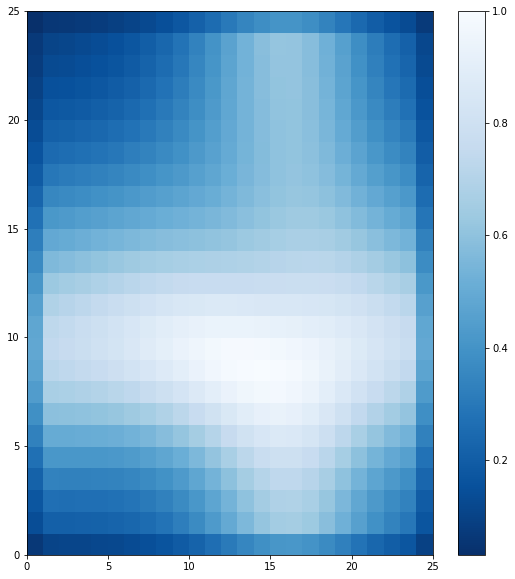

In [1378]:
plt.figure(figsize=(20, 10))
# Plotting the response for each pattern in the iris dataset

plt.subplot(1, 2, 1)
plt.pcolormesh(con_som.distance_map(), cmap='Blues_r')  # plotting the distance map as background
plt.colorbar()
#plt.subplot(1, 2, 2)
#plt.pcolormesh(sar_stat.T, cmap='Blues')
#plt.colorbar()

In [1379]:
cat_som = MiniSom(25, 25, 12, sigma=10, learning_rate=0.5,neighborhood_function='gaussian', random_seed=10)
cat_som.pca_weights_init(cat_var)
cat_som.train_random(cat_var, epochs, verbose=True)

 [ 20000 / 20000 ] 100% 0.00766 it/s

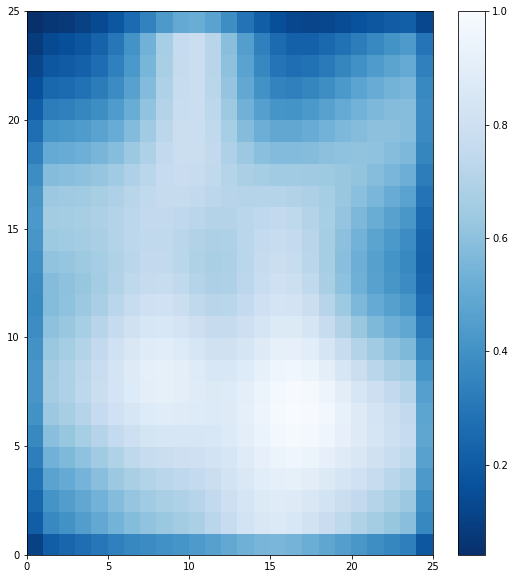

In [1380]:
plt.figure(figsize=(20, 10))
# Plotting the response for each pattern in the iris dataset

plt.subplot(1, 2, 1)
plt.pcolormesh(cat_som.distance_map(), cmap='Blues_r')  # plotting the distance map as background
plt.colorbar()
#plt.subplot(1, 2, 2)
#plt.pcolormesh(sar_stat.T, cmap='Blues')
#plt.colorbar()

In [1381]:
con_mid=con_som.distance_map()
cat_mid=cat_som.distance_map()

con_mid, cat_mid

(array([[0.06118937, 0.10458153, 0.10653356, 0.10954048, 0.11404072,
         0.12069753, 0.13043012, 0.14437756, 0.16376923, 0.18967858,
         0.22263967, 0.26212084, 0.30590969, 0.34964009, 0.38695448,
         0.41082131, 0.41590883, 0.40086843, 0.36899753, 0.32678433,
         0.28138048, 0.23853972, 0.20177862, 0.17253912, 0.0921338 ],
        [0.13661379, 0.21139711, 0.21150084, 0.21319085, 0.21722274,
         0.22470333, 0.23711516, 0.25624374, 0.28396957, 0.3218925 ,
         0.37075796, 0.42966901, 0.49516655, 0.5605392 , 0.61611377,
         0.65129205, 0.65814631, 0.63482069, 0.58645975, 0.5229663 ,
         0.45518473, 0.39180045, 0.33806764, 0.29604174, 0.16839768],
        [0.17355259, 0.26617063, 0.26503575, 0.26543102, 0.26819493,
         0.27450838, 0.28589276, 0.30412059, 0.33101356, 0.36808908,
         0.41600237, 0.47375626, 0.53778144, 0.6012888 , 0.65465146,
         0.68751357, 0.69233812, 0.66763432, 0.61872085, 0.55546168,
         0.48854691, 0.4264803 ,

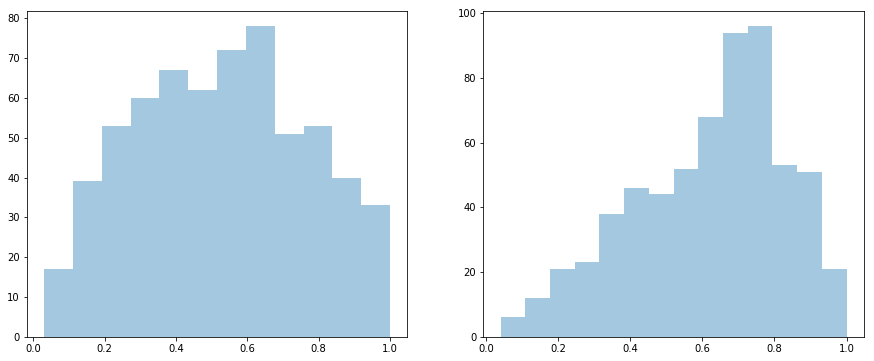

In [1382]:
f, axes = plt.subplots(1, 2 ,figsize=(15, 6))
sns.distplot(con_mid.reshape(1,625) , kde= False ,ax=axes[0])
sns.distplot(cat_mid.reshape(1,625) , kde= False ,ax=axes[1])


In [1383]:
df['Actvy Type Desc Tx'].value_counts()

Action Withheld    16941
Auto-Closed          254
SAR Filed             84
Case Opened           81
Suppressed            12
Name: Actvy Type Desc Tx, dtype: int64

In [1384]:
df.head()

,Acct ID Anonymized,Review Id,Creat Ts,Scnro Short Nm,Actvy Type Desc Tx,CURR_MTH_AM,CURR_MTH_CT,PRIOR_MAX_AM,PRIOR_MAX_CT,Months_after_last_Trans,"Cntry Id__104,000,001",Pttrn Id__595,"Pttrn Id__8,000,253",ALERT_TYPE__Cash Equivalent Deposits,ALERT_TYPE__Check Deposits,ALERT_TYPE__Check Withdrawals,ALERT_TYPE__Electronic Transfer Deposits,ALERT_TYPE__Electronic Transfer Withdrawals,ALERT_TYPE__Third Party Incoming Journals,ALERT_TYPE__Third Party Outgoing Journals,SRC_SYS_CD__A,SRC_SYS_CD__B
0,1.41138E+17,4693173,2018-04-30,Chng of Acct Bhvr,Action Withheld,0.011618,0.044776,0.000000,0.000000,0.0,1,1,0,0,0,1,0,0,0,0,1,0
1,1.63045E+11,4529834,2017-10-31,Chng of Acct Bhvr,Action Withheld,0.006716,0.059701,0.000000,0.000000,0.0,1,0,1,0,0,0,0,0,1,0,1,0
2,1.76192E+26,4693150,2018-04-30,Chng of Acct Bhvr,Action Withheld,0.141721,0.149254,0.628984,0.684211,0.0,1,1,0,0,0,0,0,1,0,0,1,0
3,10001463480,4636357,2018-02-28,Chng of Acct Bhvr,Action Withheld,0.005752,0.000000,0.000000,0.000000,0.0,1,0,1,0,0,0,0,0,0,1,1,0
4,10001557217,4125305,2016-07-29,Chng of Acct Bhvr,Action Withheld,0.079100,0.029851,0.000000,0.000000,0.0,1,0,1,0,0,0,1,0,0,0,1,0


In [1385]:
df['con_neuron']=df.loc[:,df.columns[5:10]].apply(lambda x: con_som.winner(np.array(np.array(x))) , axis=1)

df['con_neuron'] = df['con_neuron'].apply(lambda x: str(x))
df.head()

,Acct ID Anonymized,Review Id,Creat Ts,Scnro Short Nm,Actvy Type Desc Tx,CURR_MTH_AM,CURR_MTH_CT,PRIOR_MAX_AM,PRIOR_MAX_CT,Months_after_last_Trans,"Cntry Id__104,000,001",Pttrn Id__595,"Pttrn Id__8,000,253",ALERT_TYPE__Cash Equivalent Deposits,ALERT_TYPE__Check Deposits,ALERT_TYPE__Check Withdrawals,ALERT_TYPE__Electronic Transfer Deposits,ALERT_TYPE__Electronic Transfer Withdrawals,ALERT_TYPE__Third Party Incoming Journals,ALERT_TYPE__Third Party Outgoing Journals,SRC_SYS_CD__A,SRC_SYS_CD__B,con_neuron
0,1.41138E+17,4693173,2018-04-30,Chng of Acct Bhvr,Action Withheld,0.011618,0.044776,0.000000,0.000000,0.0,1,1,0,0,0,1,0,0,0,0,1,0,"(0, 10)"
1,1.63045E+11,4529834,2017-10-31,Chng of Acct Bhvr,Action Withheld,0.006716,0.059701,0.000000,0.000000,0.0,1,0,1,0,0,0,0,0,1,0,1,0,"(0, 4)"
2,1.76192E+26,4693150,2018-04-30,Chng of Acct Bhvr,Action Withheld,0.141721,0.149254,0.628984,0.684211,0.0,1,1,0,0,0,0,0,1,0,0,1,0,"(24, 17)"
3,10001463480,4636357,2018-02-28,Chng of Acct Bhvr,Action Withheld,0.005752,0.000000,0.000000,0.000000,0.0,1,0,1,0,0,0,0,0,0,1,1,0,"(0, 24)"
4,10001557217,4125305,2016-07-29,Chng of Acct Bhvr,Action Withheld,0.079100,0.029851,0.000000,0.000000,0.0,1,0,1,0,0,0,1,0,0,0,1,0,"(0, 24)"


In [1386]:
df['Actvy Type Desc Tx'].value_counts()

Action Withheld    16941
Auto-Closed          254
SAR Filed             84
Case Opened           81
Suppressed            12
Name: Actvy Type Desc Tx, dtype: int64

In [1387]:
con_df=df.groupby(['con_neuron'])['Actvy Type Desc Tx'].value_counts().unstack().fillna(0)
con_df.index = [str(neuron) for neuron in list(con_df.index)]
con_df=con_df[['Auto-Closed','Action Withheld', 'Suppressed','Case Opened','SAR Filed']]
con_df.sort_values( by= ['SAR Filed'] , ascending= False)

Actvy Type Desc Tx,Auto-Closed,Action Withheld,Suppressed,Case Opened,SAR Filed
"(24, 0)",15.0,712.0,1.0,8.0,8.0
"(0, 0)",2.0,1042.0,0.0,1.0,4.0
"(21, 0)",0.0,93.0,0.0,2.0,4.0
"(20, 0)",4.0,231.0,0.0,0.0,4.0
"(8, 0)",0.0,60.0,0.0,2.0,3.0
"(24, 8)",2.0,144.0,0.0,3.0,3.0
"(24, 3)",4.0,137.0,0.0,2.0,3.0
"(16, 0)",2.0,82.0,0.0,2.0,2.0
"(14, 0)",1.0,108.0,0.0,2.0,2.0
"(9, 0)",1.0,51.0,0.0,0.0,2.0


In [1388]:
#pile_1_risk = .05
#pile_2_risk = .45
#pile_3_risk = .95

def risk(x):
    return (pile_1_risk *sum(x[0:3]) + pile_2_risk *x[3] + pile_3_risk * x[4]) / sum(x)

In [1389]:
con_df['con_act_risk']=con_df.iloc[:,0:5].apply(lambda activities_of_neuron: risk(activities_of_neuron) , axis=1)

con_df['index']=con_df.index
con_df['con_distance'] = con_df['index'].apply(lambda x: con_mid[int(x[1:-1].split(',')[0]),\
                                                                 int(x[1:-1].split(',')[1])])
con_df=con_df.drop(['index'] , axis=1)
con_df.sort_values( by= ['con_distance'] , ascending= False)

Actvy Type Desc Tx,Auto-Closed,Action Withheld,Suppressed,Case Opened,SAR Filed,con_act_risk,con_distance
"(8, 14)",1.0,7.0,0.0,0.0,0.0,0.050000,1.000000
"(8, 13)",0.0,2.0,0.0,0.0,0.0,0.050000,0.996170
"(8, 15)",0.0,5.0,0.0,0.0,0.0,0.050000,0.994912
"(9, 13)",0.0,1.0,0.0,0.0,0.0,0.050000,0.987472
"(9, 12)",0.0,4.0,0.0,0.0,0.0,0.050000,0.984920
"(9, 14)",0.0,2.0,0.0,0.0,0.0,0.050000,0.983313
"(8, 12)",0.0,2.0,0.0,0.0,0.0,0.050000,0.983231
"(8, 16)",0.0,5.0,0.0,0.0,0.0,0.050000,0.981576
"(7, 15)",0.0,3.0,0.0,0.0,0.0,0.050000,0.977304
"(7, 14)",0.0,5.0,0.0,0.0,0.0,0.050000,0.975193


In [1390]:
df['con_distance']=con_df.loc[df['con_neuron'],'con_distance'].reset_index().drop(['index'],axis=1)

df['con_act_risk'] = con_df.loc[df['con_neuron'],'con_act_risk'].reset_index().drop(['index'],axis=1)
df.head()

,Acct ID Anonymized,Review Id,Creat Ts,Scnro Short Nm,Actvy Type Desc Tx,CURR_MTH_AM,CURR_MTH_CT,PRIOR_MAX_AM,PRIOR_MAX_CT,Months_after_last_Trans,"Cntry Id__104,000,001",Pttrn Id__595,"Pttrn Id__8,000,253",ALERT_TYPE__Cash Equivalent Deposits,ALERT_TYPE__Check Deposits,ALERT_TYPE__Check Withdrawals,ALERT_TYPE__Electronic Transfer Deposits,ALERT_TYPE__Electronic Transfer Withdrawals,ALERT_TYPE__Third Party Incoming Journals,ALERT_TYPE__Third Party Outgoing Journals,SRC_SYS_CD__A,SRC_SYS_CD__B,con_neuron,con_distance,con_act_risk
0,1.41138E+17,4693173,2018-04-30,Chng of Acct Bhvr,Action Withheld,0.011618,0.044776,0.000000,0.000000,0.0,1,1,0,0,0,1,0,0,0,0,1,0,"(0, 10)",0.222640,0.053670
1,1.63045E+11,4529834,2017-10-31,Chng of Acct Bhvr,Action Withheld,0.006716,0.059701,0.000000,0.000000,0.0,1,0,1,0,0,0,0,0,1,0,1,0,"(0, 4)",0.114041,0.058553
2,1.76192E+26,4693150,2018-04-30,Chng of Acct Bhvr,Action Withheld,0.141721,0.149254,0.628984,0.684211,0.0,1,1,0,0,0,0,0,1,0,0,1,0,"(24, 17)",0.379751,0.050000
3,10001463480,4636357,2018-02-28,Chng of Acct Bhvr,Action Withheld,0.005752,0.000000,0.000000,0.000000,0.0,1,0,1,0,0,0,0,0,0,1,1,0,"(0, 24)",0.092134,0.050440
4,10001557217,4125305,2016-07-29,Chng of Acct Bhvr,Action Withheld,0.079100,0.029851,0.000000,0.000000,0.0,1,0,1,0,0,0,1,0,0,0,1,0,"(0, 24)",0.092134,0.050440


In [1391]:
df.isna().sum().sum()

0

In [1392]:
df.shape

(17372, 25)

In [1393]:
df['cat_neuron']=df.loc[:,df.columns[10:22]].apply(lambda x: cat_som.winner(np.array(np.array(x))) , axis=1)

df['cat_neuron'] = df['cat_neuron'].apply(lambda x: str(x))
df.head()

,Acct ID Anonymized,Review Id,Creat Ts,Scnro Short Nm,Actvy Type Desc Tx,CURR_MTH_AM,CURR_MTH_CT,PRIOR_MAX_AM,PRIOR_MAX_CT,Months_after_last_Trans,"Cntry Id__104,000,001",Pttrn Id__595,"Pttrn Id__8,000,253",ALERT_TYPE__Cash Equivalent Deposits,ALERT_TYPE__Check Deposits,ALERT_TYPE__Check Withdrawals,ALERT_TYPE__Electronic Transfer Deposits,ALERT_TYPE__Electronic Transfer Withdrawals,ALERT_TYPE__Third Party Incoming Journals,ALERT_TYPE__Third Party Outgoing Journals,SRC_SYS_CD__A,SRC_SYS_CD__B,con_neuron,con_distance,con_act_risk,cat_neuron
0,1.41138E+17,4693173,2018-04-30,Chng of Acct Bhvr,Action Withheld,0.011618,0.044776,0.000000,0.000000,0.0,1,1,0,0,0,1,0,0,0,0,1,0,"(0, 10)",0.222640,0.053670,"(7, 24)"
1,1.63045E+11,4529834,2017-10-31,Chng of Acct Bhvr,Action Withheld,0.006716,0.059701,0.000000,0.000000,0.0,1,0,1,0,0,0,0,0,1,0,1,0,"(0, 4)",0.114041,0.058553,"(24, 17)"
2,1.76192E+26,4693150,2018-04-30,Chng of Acct Bhvr,Action Withheld,0.141721,0.149254,0.628984,0.684211,0.0,1,1,0,0,0,0,0,1,0,0,1,0,"(24, 17)",0.379751,0.050000,"(0, 10)"
3,10001463480,4636357,2018-02-28,Chng of Acct Bhvr,Action Withheld,0.005752,0.000000,0.000000,0.000000,0.0,1,0,1,0,0,0,0,0,0,1,1,0,"(0, 24)",0.092134,0.050440,"(24, 0)"
4,10001557217,4125305,2016-07-29,Chng of Acct Bhvr,Action Withheld,0.079100,0.029851,0.000000,0.000000,0.0,1,0,1,0,0,0,1,0,0,0,1,0,"(0, 24)",0.092134,0.050440,"(12, 0)"


In [1394]:
cat_df=df.groupby(['cat_neuron'])['Actvy Type Desc Tx'].value_counts().unstack().fillna(0)
cat_df.index = [str(neuron) for neuron in list(cat_df.index)]
cat_df=cat_df[['Auto-Closed','Action Withheld', 'Suppressed','Case Opened','SAR Filed']]
cat_df.head()

Actvy Type Desc Tx,Auto-Closed,Action Withheld,Suppressed,Case Opened,SAR Filed
"(0, 0)",0.0,770.0,0.0,3.0,3.0
"(0, 10)",0.0,598.0,0.0,6.0,2.0
"(0, 15)",0.0,213.0,0.0,3.0,1.0
"(0, 18)",0.0,669.0,0.0,2.0,8.0
"(0, 21)",11.0,148.0,0.0,5.0,9.0


In [1395]:
cat_df['cat_act_risk']=cat_df.iloc[:,0:5].apply(lambda activities_of_neuron: risk(activities_of_neuron) , axis=1)

cat_df['index']=cat_df.index
cat_df['cat_distance'] = cat_df['index'].apply(lambda x: cat_mid[int(x[1:-1].split(',')[0]),\
                                                                 int(x[1:-1].split(',')[1])])
cat_df=cat_df.drop(['index'] , axis=1)
cat_df.sort_values( by= ['cat_distance'] , ascending= False)


Actvy Type Desc Tx,Auto-Closed,Action Withheld,Suppressed,Case Opened,SAR Filed,cat_act_risk,cat_distance
"(16, 10)",10.0,195.0,0.0,4.0,12.0,0.106109,0.747441
"(11, 12)",0.0,1549.0,1.0,7.0,4.0,0.054100,0.720053
"(0, 15)",0.0,213.0,0.0,3.0,1.0,0.059677,0.556725
"(0, 18)",0.0,669.0,0.0,2.0,8.0,0.061782,0.484820
"(7, 24)",0.0,395.0,0.0,0.0,2.0,0.054534,0.454372
"(0, 10)",0.0,598.0,0.0,6.0,2.0,0.056931,0.434631
"(2, 24)",0.0,620.0,0.0,11.0,6.0,0.065385,0.395044
"(0, 21)",11.0,148.0,0.0,5.0,9.0,0.108382,0.388987
"(12, 0)",178.0,1715.0,0.0,6.0,10.0,0.055972,0.379077
"(1, 24)",0.0,202.0,0.0,2.0,1.0,0.058293,0.361852


In [1396]:
df['cat_distance']=cat_df.loc[df['cat_neuron'],'cat_distance'].reset_index().drop(['index'],axis=1)

df['cat_act_risk'] = cat_df.loc[df['cat_neuron'],'cat_act_risk'].reset_index().drop(['index'],axis=1)
df.head()

,Acct ID Anonymized,Review Id,Creat Ts,Scnro Short Nm,Actvy Type Desc Tx,CURR_MTH_AM,CURR_MTH_CT,PRIOR_MAX_AM,PRIOR_MAX_CT,Months_after_last_Trans,"Cntry Id__104,000,001",Pttrn Id__595,"Pttrn Id__8,000,253",ALERT_TYPE__Cash Equivalent Deposits,ALERT_TYPE__Check Deposits,ALERT_TYPE__Check Withdrawals,ALERT_TYPE__Electronic Transfer Deposits,ALERT_TYPE__Electronic Transfer Withdrawals,ALERT_TYPE__Third Party Incoming Journals,ALERT_TYPE__Third Party Outgoing Journals,SRC_SYS_CD__A,SRC_SYS_CD__B,con_neuron,con_distance,con_act_risk,cat_neuron,cat_distance,cat_act_risk
0,1.41138E+17,4693173,2018-04-30,Chng of Acct Bhvr,Action Withheld,0.011618,0.044776,0.000000,0.000000,0.0,1,1,0,0,0,1,0,0,0,0,1,0,"(0, 10)",0.222640,0.053670,"(7, 24)",0.454372,0.054534
1,1.63045E+11,4529834,2017-10-31,Chng of Acct Bhvr,Action Withheld,0.006716,0.059701,0.000000,0.000000,0.0,1,0,1,0,0,0,0,0,1,0,1,0,"(0, 4)",0.114041,0.058553,"(24, 17)",0.118690,0.050407
2,1.76192E+26,4693150,2018-04-30,Chng of Acct Bhvr,Action Withheld,0.141721,0.149254,0.628984,0.684211,0.0,1,1,0,0,0,0,0,1,0,0,1,0,"(24, 17)",0.379751,0.050000,"(0, 10)",0.434631,0.056931
3,10001463480,4636357,2018-02-28,Chng of Acct Bhvr,Action Withheld,0.005752,0.000000,0.000000,0.000000,0.0,1,0,1,0,0,0,0,0,0,1,1,0,"(0, 24)",0.092134,0.050440,"(24, 0)",0.041175,0.050868
4,10001557217,4125305,2016-07-29,Chng of Acct Bhvr,Action Withheld,0.079100,0.029851,0.000000,0.000000,0.0,1,0,1,0,0,0,1,0,0,0,1,0,"(0, 24)",0.092134,0.050440,"(12, 0)",0.379077,0.055972


In [1397]:
#con_coef= .6
#cat_coef= .2
#con_act_coef , cat_act_coef= .1 , .1

In [1398]:
df['Risk'] = con_coef * df['con_distance'] + cat_coef * df['cat_distance'] + \
             con_act_coef * df['con_act_risk']  + cat_act_coef * df['cat_act_risk']

df.head()

,Acct ID Anonymized,Review Id,Creat Ts,Scnro Short Nm,Actvy Type Desc Tx,CURR_MTH_AM,CURR_MTH_CT,PRIOR_MAX_AM,PRIOR_MAX_CT,Months_after_last_Trans,"Cntry Id__104,000,001",Pttrn Id__595,"Pttrn Id__8,000,253",ALERT_TYPE__Cash Equivalent Deposits,ALERT_TYPE__Check Deposits,ALERT_TYPE__Check Withdrawals,ALERT_TYPE__Electronic Transfer Deposits,ALERT_TYPE__Electronic Transfer Withdrawals,ALERT_TYPE__Third Party Incoming Journals,ALERT_TYPE__Third Party Outgoing Journals,SRC_SYS_CD__A,SRC_SYS_CD__B,con_neuron,con_distance,con_act_risk,cat_neuron,cat_distance,cat_act_risk,Risk
0,1.41138E+17,4693173,2018-04-30,Chng of Acct Bhvr,Action Withheld,0.011618,0.044776,0.000000,0.000000,0.0,1,1,0,0,0,1,0,0,0,0,1,0,"(0, 10)",0.222640,0.053670,"(7, 24)",0.454372,0.054534,0.235279
1,1.63045E+11,4529834,2017-10-31,Chng of Acct Bhvr,Action Withheld,0.006716,0.059701,0.000000,0.000000,0.0,1,0,1,0,0,0,0,0,1,0,1,0,"(0, 4)",0.114041,0.058553,"(24, 17)",0.118690,0.050407,0.103058
2,1.76192E+26,4693150,2018-04-30,Chng of Acct Bhvr,Action Withheld,0.141721,0.149254,0.628984,0.684211,0.0,1,1,0,0,0,0,0,1,0,0,1,0,"(24, 17)",0.379751,0.050000,"(0, 10)",0.434631,0.056931,0.325470
3,10001463480,4636357,2018-02-28,Chng of Acct Bhvr,Action Withheld,0.005752,0.000000,0.000000,0.000000,0.0,1,0,1,0,0,0,0,0,0,1,1,0,"(0, 24)",0.092134,0.050440,"(24, 0)",0.041175,0.050868,0.073646
4,10001557217,4125305,2016-07-29,Chng of Acct Bhvr,Action Withheld,0.079100,0.029851,0.000000,0.000000,0.0,1,0,1,0,0,0,1,0,0,0,1,0,"(0, 24)",0.092134,0.050440,"(12, 0)",0.379077,0.055972,0.141737


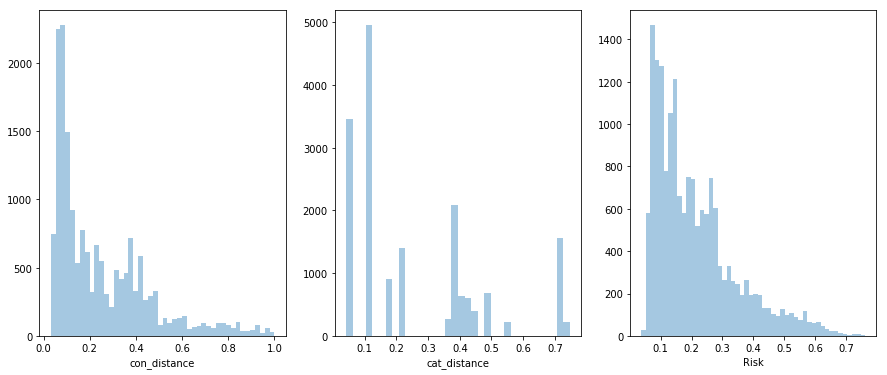

In [1399]:
f, axes = plt.subplots(1, 3 ,figsize=(15, 6))
sns.distplot(df['con_distance'] , kde= False ,ax=axes[0])
sns.distplot(df['cat_distance'] , kde= False ,ax=axes[1])
sns.distplot(df['Risk'] , kde= False ,ax=axes[2])

In [1402]:
df.columns

Index(['Acct ID Anonymized', 'Review Id', 'Creat Ts', 'Scnro Short Nm', 'Actvy Type Desc Tx', 'CURR_MTH_AM', 'CURR_MTH_CT', 'PRIOR_MAX_AM', 'PRIOR_MAX_CT', 'Months_after_last_Trans', 'Cntry Id__104,000,001', 'Pttrn Id__595', 'Pttrn Id__8,000,253', 'ALERT_TYPE__Cash Equivalent Deposits', 'ALERT_TYPE__Check Deposits', 'ALERT_TYPE__Check Withdrawals', 'ALERT_TYPE__Electronic Transfer Deposits', 'ALERT_TYPE__Electronic Transfer Withdrawals', 'ALERT_TYPE__Third Party Incoming Journals', 'ALERT_TYPE__Third Party Outgoing Journals', 'SRC_SYS_CD__A', 'SRC_SYS_CD__B', 'con_neuron', 'con_distance', 'con_act_risk', 'cat_neuron', 'cat_distance', 'cat_act_risk', 'Risk'], dtype='object')

In [1403]:
df.head()

,Acct ID Anonymized,Review Id,Creat Ts,Scnro Short Nm,Actvy Type Desc Tx,CURR_MTH_AM,CURR_MTH_CT,PRIOR_MAX_AM,PRIOR_MAX_CT,Months_after_last_Trans,"Cntry Id__104,000,001",Pttrn Id__595,"Pttrn Id__8,000,253",ALERT_TYPE__Cash Equivalent Deposits,ALERT_TYPE__Check Deposits,ALERT_TYPE__Check Withdrawals,ALERT_TYPE__Electronic Transfer Deposits,ALERT_TYPE__Electronic Transfer Withdrawals,ALERT_TYPE__Third Party Incoming Journals,ALERT_TYPE__Third Party Outgoing Journals,SRC_SYS_CD__A,SRC_SYS_CD__B,con_neuron,con_distance,con_act_risk,cat_neuron,cat_distance,cat_act_risk,Risk
0,1.41138E+17,4693173,2018-04-30,Chng of Acct Bhvr,Action Withheld,0.011618,0.044776,0.000000,0.000000,0.0,1,1,0,0,0,1,0,0,0,0,1,0,"(0, 10)",0.222640,0.053670,"(7, 24)",0.454372,0.054534,0.235279
1,1.63045E+11,4529834,2017-10-31,Chng of Acct Bhvr,Action Withheld,0.006716,0.059701,0.000000,0.000000,0.0,1,0,1,0,0,0,0,0,1,0,1,0,"(0, 4)",0.114041,0.058553,"(24, 17)",0.118690,0.050407,0.103058
2,1.76192E+26,4693150,2018-04-30,Chng of Acct Bhvr,Action Withheld,0.141721,0.149254,0.628984,0.684211,0.0,1,1,0,0,0,0,0,1,0,0,1,0,"(24, 17)",0.379751,0.050000,"(0, 10)",0.434631,0.056931,0.325470
3,10001463480,4636357,2018-02-28,Chng of Acct Bhvr,Action Withheld,0.005752,0.000000,0.000000,0.000000,0.0,1,0,1,0,0,0,0,0,0,1,1,0,"(0, 24)",0.092134,0.050440,"(24, 0)",0.041175,0.050868,0.073646
4,10001557217,4125305,2016-07-29,Chng of Acct Bhvr,Action Withheld,0.079100,0.029851,0.000000,0.000000,0.0,1,0,1,0,0,0,1,0,0,0,1,0,"(0, 24)",0.092134,0.050440,"(12, 0)",0.379077,0.055972,0.141737


In [1404]:
df_chng_other_Alerts_final= pd.merge(backup_chng_otherAlerts , df[['Review Id','con_neuron', 'con_distance', 'con_act_risk', \
                               'cat_neuron', 'cat_distance', 'cat_act_risk' ,'Risk']] , on = 'Review Id' , how= 'inner')

del backup_chng_otherAlerts

In [1405]:
df_chng_other_Alerts_final.sort_values(by= ['Risk'], ascending = False)

,Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Scnro Short Nm,Actvy Type Desc Tx,ALERT_TYPE,CURR_MTH_AM,CURR_MTH_CT,PRIOR_MAX_AM,PRIOR_MAX_CT,SRC_SYS_CD,Months_after_last_Trans,con_neuron,con_distance,con_act_risk,cat_neuron,cat_distance,cat_act_risk,Risk
13815,59377309139,4612642,2018-01-31,"104,000,001","8,000,253",Chng of Acct Bhvr,Action Withheld,Check Deposits,100000.00,10,0.00,0,A,2,"(8, 15)",0.994912,0.050000,"(16, 10)",0.747441,0.106109,0.762046
12294,45873173124,4020340,2016-02-29,"104,000,001","8,000,253",Chng of Acct Bhvr,Action Withheld,Electronic Transfer Withdrawals,2016936.37,40,100000.00,3,A,0,"(8, 14)",1.000000,0.050000,"(11, 12)",0.720053,0.054100,0.754421
13341,55211528722,4106501,2016-06-30,"104,000,001","8,000,253",Chng of Acct Bhvr,Action Withheld,Electronic Transfer Withdrawals,50000.00,10,0.00,0,A,3,"(8, 15)",0.994912,0.050000,"(11, 12)",0.720053,0.054100,0.751368
12916,50883246249,4146875,2016-08-31,"104,000,001","8,000,253",Chng of Acct Bhvr,Action Withheld,Check Deposits,508696.59,16,5688.71,1,A,0,"(8, 11)",0.962198,0.050000,"(16, 10)",0.747441,0.106109,0.742418
3944,15441540462,4293108,2017-03-31,"104,000,001","8,000,253",Chng of Acct Bhvr,Action Withheld,Check Deposits,535440.91,16,6500.00,1,A,0,"(8, 11)",0.962198,0.050000,"(16, 10)",0.747441,0.106109,0.742418
5964,19710439122,4067436,2016-04-29,"104,000,001","8,000,253",Chng of Acct Bhvr,Action Withheld,Electronic Transfer Withdrawals,220000.00,10,0.00,0,A,2,"(7, 15)",0.977304,0.050000,"(11, 12)",0.720053,0.054100,0.740803
16728,89957358148,4347254,2017-05-31,"104,000,001","8,000,253",Chng of Acct Bhvr,Action Withheld,Electronic Transfer Withdrawals,100000.00,10,0.00,0,A,4,"(9, 15)",0.974467,0.050000,"(11, 12)",0.720053,0.054100,0.739101
11862,41942710782,4204033,2016-11-30,"104,000,001","8,000,253",Chng of Acct Bhvr,Action Withheld,Electronic Transfer Withdrawals,93500.00,10,0.00,0,A,6,"(9, 15)",0.974467,0.050000,"(11, 12)",0.720053,0.054100,0.739101
2813,13507305171,4388848,2017-07-31,"104,000,001","8,000,253",Chng of Acct Bhvr,Action Withheld,Electronic Transfer Withdrawals,100000.00,10,0.00,0,A,6,"(9, 15)",0.974467,0.050000,"(11, 12)",0.720053,0.054100,0.739101
2464,12846902337,4613562,2018-01-31,"104,000,001","8,000,253",Chng of Acct Bhvr,Action Withheld,Electronic Transfer Withdrawals,112000.00,12,0.00,0,A,10,"(9, 15)",0.974467,0.050000,"(11, 12)",0.720053,0.054100,0.739101


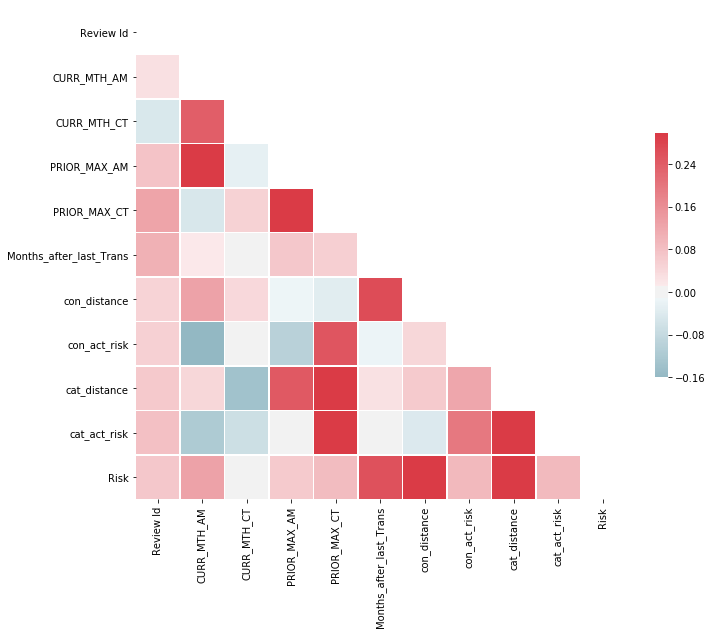

In [1406]:
# Compute the correlation matrix
corr = df_chng_other_Alerts_final.corr()

# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

In [1407]:
from scipy import stats
F, p = stats.f_oneway(df_chng_other_Alerts_final[df_chng_other_Alerts_final['SRC_SYS_CD']=='A'].Risk,
                      df_chng_other_Alerts_final[df_chng_other_Alerts_final['SRC_SYS_CD']=='B'].Risk)
F , p

(53.93950968641858, 2.1591290140344256e-13)

## Deposits of Mixed Monetary

In [1509]:
df= pd.read_csv('UofP_HutleyAnalytics_DepositsofMixedMonetary022019_Binary.csv')

print(df.shape)
df.head(20)

(69090, 9)


,Review Id,Creat Ts,Cntry Id,Acct ID Anonymized,Pttrn Id,Bindg Nm,Value Tx,Scnro Short Nm,Actvy Type Desc Tx
0,"3,975,432",1/4/16 0:00,"104,000,004",53743216007,"8,000,055",ACCT_TYPE,CUSTOMER,Deposits of Mixed Mon Inst,Auto-Closed
1,"3,975,432",1/4/16 0:00,"104,000,004",53743216007,"8,000,055",Count_Acct,1,Deposits of Mixed Mon Inst,Auto-Closed
2,"3,975,432",1/4/16 0:00,"104,000,004",53743216007,"8,000,055",Count_Xactn_Typ,1,Deposits of Mixed Mon Inst,Auto-Closed
3,"3,975,432",1/4/16 0:00,"104,000,004",53743216007,"8,000,055",Total_Count,1,Deposits of Mixed Mon Inst,Auto-Closed
4,"3,975,432",1/4/16 0:00,"104,000,004",53743216007,"8,000,055",TRANS_AM,25000,Deposits of Mixed Mon Inst,Auto-Closed
5,"3,975,433",1/4/16 0:00,"104,000,004",11032923129,"8,000,055",ACCT_TYPE,CUSTOMER,Deposits of Mixed Mon Inst,Auto-Closed
6,"3,975,433",1/4/16 0:00,"104,000,004",11032923129,"8,000,055",Count_Acct,1,Deposits of Mixed Mon Inst,Auto-Closed
7,"3,975,433",1/4/16 0:00,"104,000,004",11032923129,"8,000,055",Count_Xactn_Typ,1,Deposits of Mixed Mon Inst,Auto-Closed
8,"3,975,433",1/4/16 0:00,"104,000,004",11032923129,"8,000,055",Total_Count,1,Deposits of Mixed Mon Inst,Auto-Closed
9,"3,975,433",1/4/16 0:00,"104,000,004",11032923129,"8,000,055",TRANS_AM,10000,Deposits of Mixed Mon Inst,Auto-Closed


In [1510]:
df.duplicated().sum()

215

In [1511]:
df=df.drop_duplicates()
df.shape

(68875, 9)

In [1512]:
df=df[df['Acct ID Anonymized'] != '#VALUE!']
df['Review Id']=df['Review Id'].apply(locale.atoi)
df['Creat Ts']=df['Creat Ts'].apply(lambda x: datetime.strptime(x, "%m/%d/%y %H:%M"))
df.head()

,Review Id,Creat Ts,Cntry Id,Acct ID Anonymized,Pttrn Id,Bindg Nm,Value Tx,Scnro Short Nm,Actvy Type Desc Tx
0,3975432,2016-01-04,"104,000,004",53743216007,"8,000,055",ACCT_TYPE,CUSTOMER,Deposits of Mixed Mon Inst,Auto-Closed
1,3975432,2016-01-04,"104,000,004",53743216007,"8,000,055",Count_Acct,1,Deposits of Mixed Mon Inst,Auto-Closed
2,3975432,2016-01-04,"104,000,004",53743216007,"8,000,055",Count_Xactn_Typ,1,Deposits of Mixed Mon Inst,Auto-Closed
3,3975432,2016-01-04,"104,000,004",53743216007,"8,000,055",Total_Count,1,Deposits of Mixed Mon Inst,Auto-Closed
4,3975432,2016-01-04,"104,000,004",53743216007,"8,000,055",TRANS_AM,25000,Deposits of Mixed Mon Inst,Auto-Closed


In [1513]:
df.isna().sum()

Review Id             0
Creat Ts              0
Cntry Id              0
Acct ID Anonymized    0
Pttrn Id              0
Bindg Nm              0
Value Tx              0
Scnro Short Nm        0
Actvy Type Desc Tx    0
dtype: int64

In [1514]:
df['Scnro Short Nm'].value_counts()

Deposits of Mixed Mon Inst    68875
Name: Scnro Short Nm, dtype: int64

In [1515]:
df[df.groupby(['Review Id'])['Acct ID Anonymized'].transform('nunique') >1]

,Review Id,Creat Ts,Cntry Id,Acct ID Anonymized,Pttrn Id,Bindg Nm,Value Tx,Scnro Short Nm,Actvy Type Desc Tx
65535,4549736,2017-11-28,"104,000,004",13077262399,"8,000,055",ACCT_TYPE,CUSTOMER,Deposits of Mixed Mon Inst,Auto-Closed
65536,4549736,2017-11-28,"104,000,004",13077262399,"8,000,055",Count_Acct,1,Deposits of Mixed Mon Inst,Auto-Closed
65537,4549736,2017-11-28,"104,000,004",13077262399,"8,000,055",Count_Xactn_Typ,1,Deposits of Mixed Mon Inst,Auto-Closed
65538,4549736,2017-11-28,"104,000,004",13077262399,"8,000,055",Total_Count,1,Deposits of Mixed Mon Inst,Auto-Closed
65539,4549736,2017-11-28,"104,000,004",13077262399,"8,000,055",TRANS_AM,10000,Deposits of Mixed Mon Inst,Auto-Closed


In [1516]:
df.loc[65535:65539,'Acct ID Anonymized'].apply(lambda x: type(x))

65535    <class 'str'>
65536    <class 'int'>
65537    <class 'int'>
65538    <class 'int'>
65539    <class 'int'>
Name: Acct ID Anonymized, dtype: object

In [1517]:
df.loc[65535,'Acct ID Anonymized'] = df.loc[65536,'Acct ID Anonymized']

In [1518]:
df.sort_values(by=['Acct ID Anonymized','Review Id'], inplace=True)
df=df.reset_index()
df=df.drop(['index'] , axis=1)
df=df.reindex(columns=['Acct ID Anonymized','Review Id', 'Creat Ts', 'Cntry Id','Pttrn Id',
       'Bindg Nm', 'Value Tx', 'Scnro Short Nm', 'Actvy Type Desc Tx'])
df.head()

,Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Bindg Nm,Value Tx,Scnro Short Nm,Actvy Type Desc Tx
0,10224727204,4570615,2017-12-20,"104,000,004","8,000,055",ACCT_TYPE,CUSTOMER,Deposits of Mixed Mon Inst,Auto-Closed
1,10224727204,4570615,2017-12-20,"104,000,004","8,000,055",Count_Acct,1,Deposits of Mixed Mon Inst,Auto-Closed
2,10224727204,4570615,2017-12-20,"104,000,004","8,000,055",Count_Xactn_Typ,1,Deposits of Mixed Mon Inst,Auto-Closed
3,10224727204,4570615,2017-12-20,"104,000,004","8,000,055",Total_Count,1,Deposits of Mixed Mon Inst,Auto-Closed
4,10224727204,4570615,2017-12-20,"104,000,004","8,000,055",TRANS_AM,10000,Deposits of Mixed Mon Inst,Auto-Closed


In [1519]:
df['Pttrn Id'].value_counts()

8,000,055    68875
Name: Pttrn Id, dtype: int64

In [1520]:
df['Cntry Id'].value_counts()

104,000,004    68875
Name: Cntry Id, dtype: int64

In [1521]:
df['Actvy Type Desc Tx'].value_counts()

Auto-Closed        58900
Action Withheld     9660
Case Opened          205
SAR Filed            110
Name: Actvy Type Desc Tx, dtype: int64

In [1522]:
df[df.groupby(['Review Id'])['Acct ID Anonymized'].transform('nunique') > 1]


,Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Bindg Nm,Value Tx,Scnro Short Nm,Actvy Type Desc Tx


In [1523]:
df['Bindg Nm'].unique()

array(['ACCT_TYPE', 'Count_Acct', 'Count_Xactn_Typ', 'Total_Count',
       'TRANS_AM'], dtype=object)

In [1524]:
not_meaningful ={'Count_Xactn_Typ', 'FCAL_NTITY_RISK_NB', 'OPP_SIDE_FL' ,'XACTN_RISK_NB' }

In [1525]:
df=df[df['Bindg Nm'].apply(lambda bindg_name: bindg_name not in not_meaningful)].reset_index()
df=df.drop(['index'] , axis=1)
df.head()

,Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Bindg Nm,Value Tx,Scnro Short Nm,Actvy Type Desc Tx
0,10224727204,4570615,2017-12-20,"104,000,004","8,000,055",ACCT_TYPE,CUSTOMER,Deposits of Mixed Mon Inst,Auto-Closed
1,10224727204,4570615,2017-12-20,"104,000,004","8,000,055",Count_Acct,1,Deposits of Mixed Mon Inst,Auto-Closed
2,10224727204,4570615,2017-12-20,"104,000,004","8,000,055",Total_Count,1,Deposits of Mixed Mon Inst,Auto-Closed
3,10224727204,4570615,2017-12-20,"104,000,004","8,000,055",TRANS_AM,10000,Deposits of Mixed Mon Inst,Auto-Closed
4,10237889786,4565208,2017-12-13,"104,000,004","8,000,055",ACCT_TYPE,CUSTOMER,Deposits of Mixed Mon Inst,Auto-Closed


In [1526]:
discrete = {'TRAN_CT','Count_Acct','Total_Count','DEPST_CT','ACCT_CT' ,'CURR_MTH_CT', 'PRIOR_MAX_CT', \
            'TOT_Credit_Count', 'TOT_Debit_Count','TRANS_CT','AGG_XACTN_RISK_NB'}

continous= {'TRAN_AM','TRANS_AM','DEPST_AM','CURR_MTH_AM', 'PRIOR_MAX_AM','TOT_Credit_Amt','TOT_Debit_Amt' }

string = {'CNTRY_CD','ACCT_TYPE','ALERT_TYPE','BUS_DMN_TX', 'DOMAIN', 'HIGH_RISK_SCORE','PATTERN' ,'SRC_SYS_CD','EXCTN_DATE'}

#dates= {'EXCTN_DATE'}

In [1527]:
discrete_rows = df['Bindg Nm'].apply(lambda bindg_name: bindg_name in discrete)
continous_rows = df['Bindg Nm'].apply(lambda bindg_name: bindg_name in continous)
string_rows = df['Bindg Nm'].apply(lambda bindg_name: bindg_name in string)
#date_rows= income_df['Bindg Nm'].apply(lambda bindg_name: bindg_name in dates)

df.loc[discrete_rows,'Value Tx'] = df.loc[discrete_rows,'Value Tx'].astype(int)
df.loc[continous_rows,'Value Tx'] = df.loc[continous_rows,'Value Tx'].astype(float)
df.loc[string_rows,'Value Tx'] = df.loc[string_rows,'Value Tx'].astype(str)
#income_df.loc[date_rows,'Value Tx']=df.loc[date_rows,'Value Tx'].apply(lambda x: pd.to_datetime(x))

In [1528]:
temp=df.copy()
temp=temp.groupby(['Acct ID Anonymized','Review Id', 'Creat Ts', 'Cntry Id',  'Pttrn Id',
       'Bindg Nm','Scnro Short Nm' ,'Value Tx']).agg({'Actvy Type Desc Tx': set}).reset_index()

In [1529]:
temp['Actvy Type Desc Tx'].value_counts()

{Auto-Closed}                                47120
{Action Withheld}                             7680
{SAR Filed, Case Opened}                        72
{Case Opened}                                   48
{Action Withheld, Case Opened}                  32
{Action Withheld, SAR Filed, Case Opened}       12
{Action Withheld, SAR Filed}                     4
Name: Actvy Type Desc Tx, dtype: int64

In [1530]:
temp[temp.groupby(['Review Id'])['Actvy Type Desc Tx'].transform('nunique') > 1]

,Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Bindg Nm,Scnro Short Nm,Value Tx,Actvy Type Desc Tx


In [1531]:
df=df.groupby(['Acct ID Anonymized','Review Id', 'Creat Ts', 'Cntry Id',  'Pttrn Id',
       'Bindg Nm','Scnro Short Nm']).agg({'Value Tx': set}).reset_index()
df.head()

,Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Bindg Nm,Scnro Short Nm,Value Tx
0,10224727204,4570615,2017-12-20,"104,000,004","8,000,055",ACCT_TYPE,Deposits of Mixed Mon Inst,{CUSTOMER}
1,10224727204,4570615,2017-12-20,"104,000,004","8,000,055",Count_Acct,Deposits of Mixed Mon Inst,{1}
2,10224727204,4570615,2017-12-20,"104,000,004","8,000,055",TRANS_AM,Deposits of Mixed Mon Inst,{10000.0}
3,10224727204,4570615,2017-12-20,"104,000,004","8,000,055",Total_Count,Deposits of Mixed Mon Inst,{1}
4,10237889786,4565208,2017-12-13,"104,000,004","8,000,055",ACCT_TYPE,Deposits of Mixed Mon Inst,{CUSTOMER}


In [1532]:
df = pd.merge(df,
                 temp[['Review Id', 'Actvy Type Desc Tx']].drop_duplicates(subset=['Review Id']),
                 on='Review Id')
del temp
df.head()

,Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Bindg Nm,Scnro Short Nm,Value Tx,Actvy Type Desc Tx
0,10224727204,4570615,2017-12-20,"104,000,004","8,000,055",ACCT_TYPE,Deposits of Mixed Mon Inst,{CUSTOMER},{Auto-Closed}
1,10224727204,4570615,2017-12-20,"104,000,004","8,000,055",Count_Acct,Deposits of Mixed Mon Inst,{1},{Auto-Closed}
2,10224727204,4570615,2017-12-20,"104,000,004","8,000,055",TRANS_AM,Deposits of Mixed Mon Inst,{10000.0},{Auto-Closed}
3,10224727204,4570615,2017-12-20,"104,000,004","8,000,055",Total_Count,Deposits of Mixed Mon Inst,{1},{Auto-Closed}
4,10237889786,4565208,2017-12-13,"104,000,004","8,000,055",ACCT_TYPE,Deposits of Mixed Mon Inst,{CUSTOMER},{Auto-Closed}


In [1533]:
df.reset_index()
df=df.reindex(columns=['Acct ID Anonymized','Review Id', 'Creat Ts', 'Cntry Id','Pttrn Id',
       'Bindg Nm', 'Value Tx', 'Scnro Short Nm', 'Actvy Type Desc Tx'])
df.head()

,Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Bindg Nm,Value Tx,Scnro Short Nm,Actvy Type Desc Tx
0,10224727204,4570615,2017-12-20,"104,000,004","8,000,055",ACCT_TYPE,{CUSTOMER},Deposits of Mixed Mon Inst,{Auto-Closed}
1,10224727204,4570615,2017-12-20,"104,000,004","8,000,055",Count_Acct,{1},Deposits of Mixed Mon Inst,{Auto-Closed}
2,10224727204,4570615,2017-12-20,"104,000,004","8,000,055",TRANS_AM,{10000.0},Deposits of Mixed Mon Inst,{Auto-Closed}
3,10224727204,4570615,2017-12-20,"104,000,004","8,000,055",Total_Count,{1},Deposits of Mixed Mon Inst,{Auto-Closed}
4,10237889786,4565208,2017-12-13,"104,000,004","8,000,055",ACCT_TYPE,{CUSTOMER},Deposits of Mixed Mon Inst,{Auto-Closed}


In [1534]:
df['Actvy Type Desc Tx']=df['Actvy Type Desc Tx'].apply(lambda x: list(x)[0] if (len(x) == 1) else x)

In [1535]:
df['Value Tx']=df['Value Tx'].apply(lambda x: list(x)[0] if (len(x) == 1) else x)

In [1536]:
value_bindname_rows= df['Bindg Nm'].apply(lambda x: (x in discrete) | (x in continous))

In [1537]:
df.loc[value_bindname_rows , 'Value Tx'] = df.loc[value_bindname_rows , 'Value Tx']. \
                                                                      apply(lambda x: max(x) if type(x)== set else x)

In [1538]:
df[df['Value Tx'].apply(lambda x: type(x) == set)]['Bindg Nm'].value_counts()

Series([], Name: Bindg Nm, dtype: int64)

In [1539]:
df['Actvy Type Desc Tx'].value_counts()

Auto-Closed                                  47120
Action Withheld                               7680
{SAR Filed, Case Opened}                        72
Case Opened                                     48
{Action Withheld, Case Opened}                  32
{Action Withheld, SAR Filed, Case Opened}       12
{Action Withheld, SAR Filed}                     4
Name: Actvy Type Desc Tx, dtype: int64

In [1540]:
Actvy_pile_1={'Auto-Closed', 'Action Withheld','Suppressed','Close and Suppress 3 months','Close and Suppress 6 months'}
Actvy_pile_2={'Case Opened'}
Actvy_pile_3={'CTR Filed','Referred for Review','SAR Filed'}

In [1541]:
set_Actvys = df['Actvy Type Desc Tx'].apply(lambda x: type(x) == set)

In [1542]:
def final_activity(set_of_activity):
    pile_3_activities= [activity for activity in set_of_activity if activity in Actvy_pile_3]
    if len(pile_3_activities) > 0:
        return pile_3_activities[0];
    elif ('Case Opened' in set_of_activity):
        return 'Case Opened';
    elif ('Close and Suppress 3 months' in set_of_activity) | ('Close and Suppress 6 months' in set_of_activity) | ('Suppressed' in set_of_activity) :
                return 'Suppressed';
    elif 'Action Withheld' in set_of_activity:
            return 'Action Withheld';
    elif 'Auto-Closed' in set_of_activity:
            return 'Auto-Closed';  

In [1543]:
df.loc[set_Actvys , 'Actvy Type Desc Tx'] = df.loc[set_Actvys , 'Actvy Type Desc Tx']. \
   apply(final_activity)

In [1544]:
df.loc[df['Actvy Type Desc Tx']== 'Close and Suppress 3 months', 'Actvy Type Desc Tx']= 'Suppressed'
df.loc[df['Actvy Type Desc Tx']== 'Close and Suppress 6 months', 'Actvy Type Desc Tx']= 'Suppressed'

In [1545]:
df['Actvy Type Desc Tx'].value_counts()

Auto-Closed        47120
Action Withheld     7680
SAR Filed             88
Case Opened           80
Name: Actvy Type Desc Tx, dtype: int64

In [1546]:
df['Acct ID Anonymized'].apply(lambda x: type(x) == set).sum()

0

In [1547]:
result = pd.crosstab([df['Acct ID Anonymized'] , df['Review Id'] , df['Creat Ts'] , df['Cntry Id'] , \
              df['Pttrn Id'] , df['Scnro Short Nm'] , df['Actvy Type Desc Tx']], \
            df['Bindg Nm'] , \
            values=df['Value Tx'] , \
            aggfunc='sum')

In [1548]:
result.head()

,,,,,,Bindg Nm,ACCT_TYPE,Count_Acct,TRANS_AM,Total_Count
Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Scnro Short Nm,Actvy Type Desc Tx,,,,
10224727204,4570615,2017-12-20,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,CUSTOMER,1,10000,1
10237889786,4565208,2017-12-13,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,CUSTOMER,1,10000,1
10287750317,4580304,2017-12-29,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,CUSTOMER,1,10000,1
10322793093,4576280,2017-12-27,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,CUSTOMER,2,128203,2
10428977064,4564294,2017-12-11,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,CUSTOMER,1,10000,1


In [1549]:
%who DataFrame

backup_chng	 backup_chng_newDest	 backup_chng_otherAlerts	 backup_depositmm_df	 backup_df	 cat_df	 con_df	 corr	 df	 
df1	 df2	 df_chng_newdes_final	 df_chng_other_Alerts_final	 df_chng_other_alerts_final	 df_final	 other_df	 remained_chng_act_in_income	 result	 



In [1550]:
df=result.reset_index().rename_axis("", axis="columns")
df

,Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Scnro Short Nm,Actvy Type Desc Tx,ACCT_TYPE,Count_Acct,TRANS_AM,Total_Count
0,10224727204,4570615,2017-12-20,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,CUSTOMER,1,10000,1
1,10237889786,4565208,2017-12-13,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,CUSTOMER,1,10000,1
2,10287750317,4580304,2017-12-29,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,CUSTOMER,1,10000,1
3,10322793093,4576280,2017-12-27,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,CUSTOMER,2,128203,2
4,10428977064,4564294,2017-12-11,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,CUSTOMER,1,10000,1
5,10474075496,4576763,2017-12-28,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,CUSTOMER,1,10000,1
6,10474609507,4576764,2017-12-28,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,CUSTOMER,1,20000,1
7,10510642416,4560875,2017-12-07,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,CUSTOMER,1,400000,1
8,10535238448,4575758,2017-12-26,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,CUSTOMER,1,10000,1
9,10584922860,4560135,2017-12-05,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,CUSTOMER,1,1.4822e+06,1


In [1551]:
del result

In [1552]:
df.shape

(13742, 11)

In [1553]:
df.isna().sum().sum()

0

In [1554]:
df['Months_after_last_Trans']=df.groupby(['Acct ID Anonymized'])['Creat Ts']. \
                                          diff().fillna(0).apply(lambda x : math.ceil(x / np.timedelta64(1, 'M')))

In [1555]:
df['ACCT_TYPE'].value_counts()

CUSTOMER    13650
EMPLOYEE       92
Name: ACCT_TYPE, dtype: int64

In [1556]:
df['Count_Acct']=df['Count_Acct'].astype('int')
df['TRANS_AM']=df['TRANS_AM'].astype('float')
df['Total_Count']=df['Total_Count'].astype('int')

In [1557]:
backup_depositmm_df=df.copy()
df=backup_depositmm_df.copy()

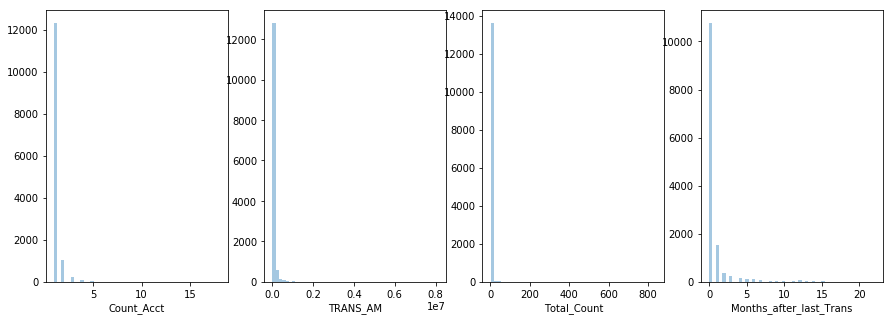

In [1558]:
f, axes = plt.subplots(1, 4 ,figsize=(15, 5))

sns.distplot(df['Count_Acct'] , kde= False ,ax=axes[0])
sns.distplot(df['TRANS_AM'] , kde= False ,ax=axes[1])
sns.distplot(df['Total_Count'] , kde= False ,ax=axes[2])
sns.distplot(df['Months_after_last_Trans'] , kde= False ,ax=axes[3])

In [1559]:
#threshold= 3

zscore_Count_Acct=pd.Series(np.abs(stats.zscore(df['Count_Acct'])))
zscore_TRANS_AM=pd.Series(np.abs(stats.zscore(df['TRANS_AM'])))
zscore_Total_Count=pd.Series(np.abs(stats.zscore(df['Total_Count'])))
#zscore_Months_after_last_Trans =pd.Series(np.abs(stats.zscore(df['Months_after_last_Trans'])))

In [1560]:
desired_records = (zscore_Count_Acct < threshold) & (zscore_TRANS_AM < threshold) \
                 & (zscore_Total_Count < threshold)
sum(desired_records)

13436

In [1561]:
temp=df[~desired_records]

len(temp['Acct ID Anonymized'].unique()) / len(df['Acct ID Anonymized'].unique())

0.021989835809225956

In [1562]:
outliers_chng_new_wire_transfer = temp['Acct ID Anonymized'].unique()
len(outliers_chng_new_wire_transfer)

225

In [1563]:
df= df[desired_records].reset_index().drop(['index'] , axis=1)

In [1564]:
df.shape

(13436, 12)

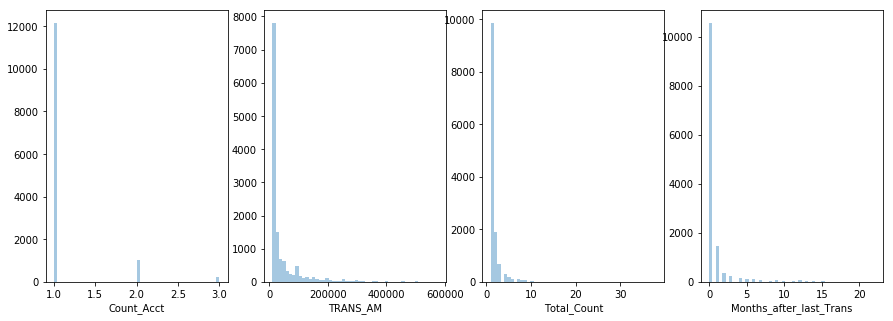

In [1565]:
f, axes = plt.subplots(1, 4 ,figsize=(15, 5))

sns.distplot(df['Count_Acct'] , kde= False ,ax=axes[0])
sns.distplot(df['TRANS_AM'] , kde= False ,ax=axes[1])
sns.distplot(df['Total_Count'] , kde= False ,ax=axes[2])
sns.distplot(df['Months_after_last_Trans'] , kde= False ,ax=axes[3])

Text(0.5, 1.0, 'Months_after_last_Trans')

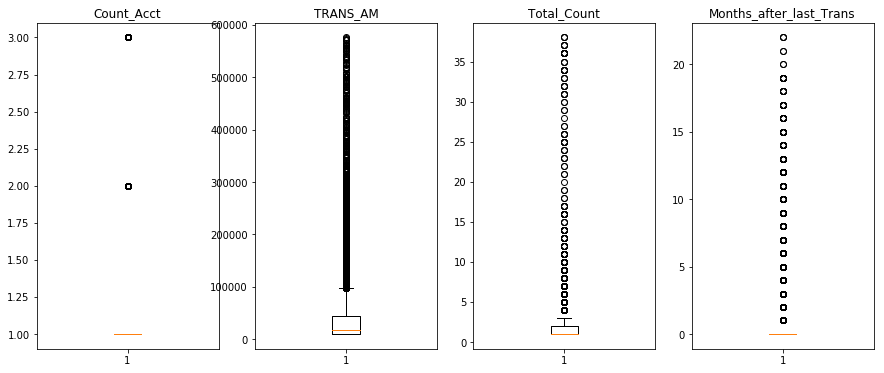

In [1566]:
# Create a figure instance
fig = plt.figure(1, figsize=(15, 6))

# Create an axes instance
ax1 = fig.add_subplot(141)
ax2 = fig.add_subplot(142)
ax3 = fig.add_subplot(143)
ax4 = fig.add_subplot(144)


# Create the boxplot
ax1.boxplot(df['Count_Acct'])
ax1.set_title('Count_Acct')

ax2.boxplot(df['TRANS_AM'])
ax2.set_title('TRANS_AM')

ax3.boxplot(df['Total_Count'])
ax3.set_title('Total_Count')

ax4.boxplot(df['Months_after_last_Trans'])
ax4.set_title('Months_after_last_Trans')

In [1567]:
cat_columns = ["ACCT_TYPE"]

In [1568]:
df = pd.get_dummies(df, prefix_sep="__",
                              columns=cat_columns)
df.head()

,Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Scnro Short Nm,Actvy Type Desc Tx,Count_Acct,TRANS_AM,Total_Count,Months_after_last_Trans,ACCT_TYPE__CUSTOMER,ACCT_TYPE__EMPLOYEE
0,10224727204,4570615,2017-12-20,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,1,10000.00,1,0,1,0
1,10237889786,4565208,2017-12-13,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,1,10000.00,1,0,1,0
2,10287750317,4580304,2017-12-29,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,1,10000.00,1,0,1,0
3,10322793093,4576280,2017-12-27,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,2,128202.88,2,0,1,0
4,10428977064,4564294,2017-12-11,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,1,10000.00,1,0,1,0


In [1508]:
df.shape

(13742, 13)

In [1569]:
x, y = df['Count_Acct'].min(), df['Count_Acct'].max()
df['Count_Acct'] = (df['Count_Acct'] - x) / (y - x) 


x, y = df['TRANS_AM'].min(), df['TRANS_AM'].max()
df['TRANS_AM'] = (df['TRANS_AM'] - x) / (y - x) 

x, y = df['Total_Count'].min(), df['Total_Count'].max()
df['Total_Count'] = (df['Total_Count'] - x) / (y - x)

In [1570]:
df.head()

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/IPython/core/displayhook.py:271: UserWarning: Output cache limit (currently 1000 entries) hit.
Flushing oldest 200 entries.
  'Flushing oldest {cull_count} entries.'.format(sz=sz, cull_count=cull_count))


,Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Scnro Short Nm,Actvy Type Desc Tx,Count_Acct,TRANS_AM,Total_Count,Months_after_last_Trans,ACCT_TYPE__CUSTOMER,ACCT_TYPE__EMPLOYEE
0,10224727204,4570615,2017-12-20,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,0.0,0.000000,0.000000,0,1,0
1,10237889786,4565208,2017-12-13,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,0.0,0.000000,0.000000,0,1,0
2,10287750317,4580304,2017-12-29,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,0.0,0.000000,0.000000,0,1,0
3,10322793093,4576280,2017-12-27,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,0.5,0.208921,0.027027,0,1,0
4,10428977064,4564294,2017-12-11,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,0.0,0.000000,0.000000,0,1,0


In [1571]:
df.shape

(13436, 13)

In [1587]:
con_var=np.array(df.iloc[:,7:11])
cat_var= np.array(df.iloc[:,11:13])

In [1588]:
con_var , cat_var

(array([[0.        , 0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        , 0.        ],
        ...,
        [0.        , 0.        , 0.        , 0.        ],
        [0.        , 0.00766907, 0.02702703, 0.        ],
        [0.        , 0.02914571, 0.        , 0.        ]]), array([[1, 0],
        [1, 0],
        [1, 0],
        ...,
        [1, 0],
        [1, 0],
        [1, 0]], dtype=uint8))

In [1589]:
con_var.shape , cat_var.shape

((13436, 4), (13436, 2))

In [1592]:
con_som = MiniSom(25, 25, 4, sigma=10, learning_rate=0.5,neighborhood_function='gaussian', random_seed=10)
con_som.train_random(con_var, epochs, verbose=True)

 [ 30000 / 30000 ] 100% 0.00811 it/s

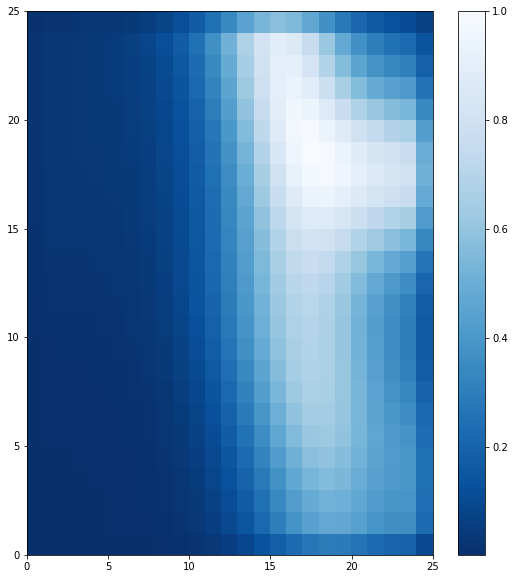

In [1593]:
plt.figure(figsize=(20, 10))
# Plotting the response for each pattern in the iris dataset

plt.subplot(1, 2, 1)
plt.pcolormesh(con_som.distance_map(), cmap='Blues_r')  # plotting the distance map as background
plt.colorbar()
#plt.subplot(1, 2, 2)
#plt.pcolormesh(sar_stat.T, cmap='Blues')
#plt.colorbar()

In [1580]:
cat_som = MiniSom(25, 25, 2, sigma=10, learning_rate=0.5,neighborhood_function='gaussian', random_seed=10)
cat_som.pca_weights_init(cat_var)
cat_som.train_random(cat_var, epochs, verbose=True)

 [ 20000 / 20000 ] 100% 0.00770 it/s

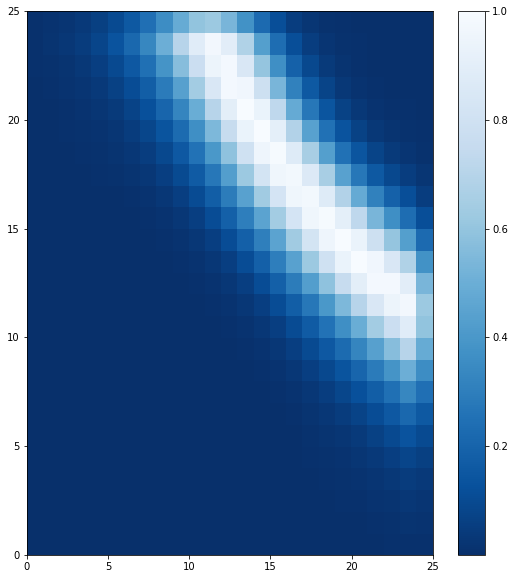

In [1581]:
plt.figure(figsize=(20, 10))
# Plotting the response for each pattern in the iris dataset

plt.subplot(1, 2, 1)
plt.pcolormesh(cat_som.distance_map(), cmap='Blues_r')  # plotting the distance map as background
plt.colorbar()
#plt.subplot(1, 2, 2)
#plt.pcolormesh(sar_stat.T, cmap='Blues')
#plt.colorbar()

In [1594]:
con_mid=con_som.distance_map()
cat_mid=cat_som.distance_map()

con_mid, cat_mid

(array([[0.0022052 , 0.00294549, 0.00295334, 0.00293072, 0.00294323,
         0.00315207, 0.00376622, 0.00510126, 0.00775005, 0.01272848,
         0.02155055, 0.03611721, 0.05854226, 0.09077394, 0.1335083 ,
         0.18415568, 0.23512834, 0.27513226, 0.29431825, 0.2897676 ,
         0.26660405, 0.23434738, 0.20565172, 0.19878986, 0.09811357],
        [0.00342563, 0.00547434, 0.00561698, 0.00571276, 0.00583859,
         0.00619629, 0.00709521, 0.00908391, 0.01324319, 0.02134496,
         0.03587517, 0.05993119, 0.09692821, 0.14985656, 0.2194498 ,
         0.30108414, 0.38245318, 0.44593867, 0.47664184, 0.47056699,
         0.43604407, 0.39143538, 0.36798389, 0.36461124, 0.23293448],
        [0.0035371 , 0.00567934, 0.00579055, 0.00588477, 0.00605086,
         0.00652292, 0.00767286, 0.01014589, 0.01517538, 0.02477693,
         0.04178136, 0.06968854, 0.11221618, 0.17223359, 0.24960917,
         0.33814962, 0.42388437, 0.4883008 , 0.51682262, 0.50666376,
         0.46750421, 0.42025143,

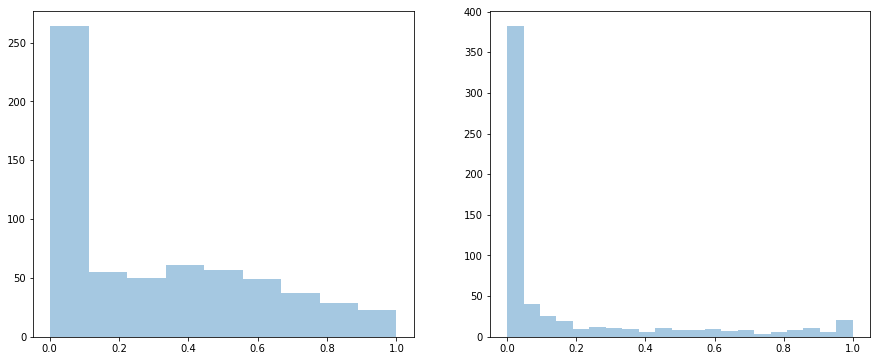

In [1595]:
f, axes = plt.subplots(1, 2 ,figsize=(15, 6))
sns.distplot(con_mid.reshape(1,625) , kde= False ,ax=axes[0])
sns.distplot(cat_mid.reshape(1,625) , kde= False ,ax=axes[1])


In [1596]:
df['Actvy Type Desc Tx'].value_counts()

Auto-Closed        11570
Action Withheld     1825
SAR Filed             22
Case Opened           19
Name: Actvy Type Desc Tx, dtype: int64

In [1597]:
df.head()

,Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Scnro Short Nm,Actvy Type Desc Tx,Count_Acct,TRANS_AM,Total_Count,Months_after_last_Trans,ACCT_TYPE__CUSTOMER,ACCT_TYPE__EMPLOYEE
0,10224727204,4570615,2017-12-20,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,0.0,0.000000,0.000000,0,1,0
1,10237889786,4565208,2017-12-13,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,0.0,0.000000,0.000000,0,1,0
2,10287750317,4580304,2017-12-29,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,0.0,0.000000,0.000000,0,1,0
3,10322793093,4576280,2017-12-27,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,0.5,0.208921,0.027027,0,1,0
4,10428977064,4564294,2017-12-11,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,0.0,0.000000,0.000000,0,1,0


In [1598]:
df['con_neuron']=df.loc[:,df.columns[7:11]].apply(lambda x: con_som.winner(np.array(np.array(x))) , axis=1)

df['con_neuron'] = df['con_neuron'].apply(lambda x: str(x))
df.head()

,Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Scnro Short Nm,Actvy Type Desc Tx,Count_Acct,TRANS_AM,Total_Count,Months_after_last_Trans,ACCT_TYPE__CUSTOMER,ACCT_TYPE__EMPLOYEE,con_neuron
0,10224727204,4570615,2017-12-20,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,0.0,0.000000,0.000000,0,1,0,"(1, 24)"
1,10237889786,4565208,2017-12-13,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,0.0,0.000000,0.000000,0,1,0,"(1, 24)"
2,10287750317,4580304,2017-12-29,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,0.0,0.000000,0.000000,0,1,0,"(1, 24)"
3,10322793093,4576280,2017-12-27,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,0.5,0.208921,0.027027,0,1,0,"(14, 24)"
4,10428977064,4564294,2017-12-11,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,0.0,0.000000,0.000000,0,1,0,"(1, 24)"


In [1599]:
df['Actvy Type Desc Tx'].value_counts()

Auto-Closed        11570
Action Withheld     1825
SAR Filed             22
Case Opened           19
Name: Actvy Type Desc Tx, dtype: int64

In [1602]:
con_df=df.groupby(['con_neuron'])['Actvy Type Desc Tx'].value_counts().unstack().fillna(0)
con_df.index = [str(neuron) for neuron in list(con_df.index)]
con_df=con_df[['Auto-Closed','Action Withheld','Case Opened','SAR Filed']]
con_df.sort_values( by= ['SAR Filed'] , ascending= False)

Actvy Type Desc Tx,Auto-Closed,Action Withheld,Case Opened,SAR Filed
"(0, 0)",683.0,351.0,2.0,2.0
"(19, 18)",168.0,19.0,0.0,2.0
"(17, 8)",8.0,21.0,0.0,2.0
"(17, 9)",9.0,23.0,0.0,2.0
"(18, 10)",6.0,16.0,0.0,2.0
"(19, 11)",1.0,13.0,5.0,1.0
"(16, 8)",9.0,16.0,0.0,1.0
"(18, 11)",2.0,9.0,1.0,1.0
"(18, 7)",1.0,3.0,0.0,1.0
"(14, 4)",3.0,3.0,0.0,1.0


In [1603]:
#pile_1_risk = .05
#pile_2_risk = .45
#pile_3_risk = .95

def risk(x):
    return (pile_1_risk *sum(x[0:2]) + pile_2_risk *x[2] + pile_3_risk * x[3]) / sum(x)

In [1604]:
con_df['con_act_risk']=con_df.iloc[:,0:4].apply(lambda activities_of_neuron: risk(activities_of_neuron) , axis=1)

con_df['index']=con_df.index
con_df['con_distance'] = con_df['index'].apply(lambda x: con_mid[int(x[1:-1].split(',')[0]),\
                                                                 int(x[1:-1].split(',')[1])])
con_df=con_df.drop(['index'] , axis=1)
con_df.sort_values( by= ['con_distance'] , ascending= False)

Actvy Type Desc Tx,Auto-Closed,Action Withheld,Case Opened,SAR Filed,con_act_risk,con_distance
"(18, 17)",207.0,11.0,0.0,0.0,0.050000,1.000000
"(18, 18)",32.0,2.0,0.0,0.0,0.050000,0.987508
"(19, 17)",30.0,3.0,0.0,0.0,0.050000,0.986219
"(18, 16)",0.0,7.0,0.0,0.0,0.050000,0.953131
"(19, 18)",168.0,19.0,0.0,2.0,0.059524,0.944277
"(16, 18)",1.0,0.0,0.0,0.0,0.050000,0.939061
"(17, 16)",1.0,17.0,0.0,0.0,0.050000,0.919786
"(16, 16)",2.0,1.0,0.0,0.0,0.050000,0.872332
"(15, 18)",0.0,1.0,0.0,0.0,0.050000,0.869949
"(20, 18)",190.0,17.0,2.0,1.0,0.058095,0.867739


In [1605]:
df['con_distance']=con_df.loc[df['con_neuron'],'con_distance'].reset_index().drop(['index'],axis=1)

df['con_act_risk'] = con_df.loc[df['con_neuron'],'con_act_risk'].reset_index().drop(['index'],axis=1)
df.head()

,Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Scnro Short Nm,Actvy Type Desc Tx,Count_Acct,TRANS_AM,Total_Count,Months_after_last_Trans,ACCT_TYPE__CUSTOMER,ACCT_TYPE__EMPLOYEE,con_neuron,con_distance,con_act_risk
0,10224727204,4570615,2017-12-20,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,0.0,0.000000,0.000000,0,1,0,"(1, 24)",0.232934,0.050218
1,10237889786,4565208,2017-12-13,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,0.0,0.000000,0.000000,0,1,0,"(1, 24)",0.232934,0.050218
2,10287750317,4580304,2017-12-29,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,0.0,0.000000,0.000000,0,1,0,"(1, 24)",0.232934,0.050218
3,10322793093,4576280,2017-12-27,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,0.5,0.208921,0.027027,0,1,0,"(14, 24)",0.335507,0.050000
4,10428977064,4564294,2017-12-11,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,0.0,0.000000,0.000000,0,1,0,"(1, 24)",0.232934,0.050218


In [1606]:
df.isna().sum().sum()

0

In [1607]:
df.shape

(13436, 16)

In [1612]:
df['cat_neuron']=df.loc[:,df.columns[11:13]].apply(lambda x: cat_som.winner(np.array(np.array(x))) , axis=1)

df['cat_neuron'] = df['cat_neuron'].apply(lambda x: str(x))
df.head()

,Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Scnro Short Nm,Actvy Type Desc Tx,Count_Acct,TRANS_AM,Total_Count,Months_after_last_Trans,ACCT_TYPE__CUSTOMER,ACCT_TYPE__EMPLOYEE,con_neuron,con_distance,con_act_risk,cat_neuron
0,10224727204,4570615,2017-12-20,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,0.0,0.000000,0.000000,0,1,0,"(1, 24)",0.232934,0.050218,"(0, 0)"
1,10237889786,4565208,2017-12-13,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,0.0,0.000000,0.000000,0,1,0,"(1, 24)",0.232934,0.050218,"(0, 0)"
2,10287750317,4580304,2017-12-29,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,0.0,0.000000,0.000000,0,1,0,"(1, 24)",0.232934,0.050218,"(0, 0)"
3,10322793093,4576280,2017-12-27,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,0.5,0.208921,0.027027,0,1,0,"(14, 24)",0.335507,0.050000,"(0, 0)"
4,10428977064,4564294,2017-12-11,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,0.0,0.000000,0.000000,0,1,0,"(1, 24)",0.232934,0.050218,"(0, 0)"


In [1613]:
cat_df=df.groupby(['cat_neuron'])['Actvy Type Desc Tx'].value_counts().unstack().fillna(0)
cat_df.index = [str(neuron) for neuron in list(cat_df.index)]
cat_df=cat_df[['Auto-Closed','Action Withheld','Case Opened','SAR Filed']]
cat_df.head()

Actvy Type Desc Tx,Auto-Closed,Action Withheld,Case Opened,SAR Filed
"(0, 0)",11482.0,1821.0,19.0,22.0
"(24, 24)",88.0,4.0,0.0,0.0


In [1615]:
cat_df['cat_act_risk']=cat_df.iloc[:,0:4].apply(lambda activities_of_neuron: risk(activities_of_neuron) , axis=1)

cat_df['index']=cat_df.index
cat_df['cat_distance'] = cat_df['index'].apply(lambda x: cat_mid[int(x[1:-1].split(',')[0]),\
                                                                 int(x[1:-1].split(',')[1])])
cat_df=cat_df.drop(['index'] , axis=1)
cat_df.sort_values( by= ['cat_distance'] , ascending= False)


Actvy Type Desc Tx,Auto-Closed,Action Withheld,Case Opened,SAR Filed,cat_act_risk,cat_distance
"(24, 24)",88.0,4.0,0.0,0.0,0.050000,6.880925e-05
"(0, 0)",11482.0,1821.0,19.0,22.0,0.052053,1.593943e-10


In [1616]:
df['cat_distance']=cat_df.loc[df['cat_neuron'],'cat_distance'].reset_index().drop(['index'],axis=1)

df['cat_act_risk'] = cat_df.loc[df['cat_neuron'],'cat_act_risk'].reset_index().drop(['index'],axis=1)
df.head()

,Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Scnro Short Nm,Actvy Type Desc Tx,Count_Acct,TRANS_AM,Total_Count,Months_after_last_Trans,ACCT_TYPE__CUSTOMER,ACCT_TYPE__EMPLOYEE,con_neuron,con_distance,con_act_risk,cat_neuron,cat_distance,cat_act_risk
0,10224727204,4570615,2017-12-20,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,0.0,0.000000,0.000000,0,1,0,"(1, 24)",0.232934,0.050218,"(0, 0)",1.593943e-10,0.052053
1,10237889786,4565208,2017-12-13,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,0.0,0.000000,0.000000,0,1,0,"(1, 24)",0.232934,0.050218,"(0, 0)",1.593943e-10,0.052053
2,10287750317,4580304,2017-12-29,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,0.0,0.000000,0.000000,0,1,0,"(1, 24)",0.232934,0.050218,"(0, 0)",1.593943e-10,0.052053
3,10322793093,4576280,2017-12-27,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,0.5,0.208921,0.027027,0,1,0,"(14, 24)",0.335507,0.050000,"(0, 0)",1.593943e-10,0.052053
4,10428977064,4564294,2017-12-11,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,0.0,0.000000,0.000000,0,1,0,"(1, 24)",0.232934,0.050218,"(0, 0)",1.593943e-10,0.052053


In [1397]:
#con_coef= .6
#cat_coef= .2
#con_act_coef , cat_act_coef= .1 , .1

In [1617]:
df['Risk'] = con_coef * df['con_distance'] + cat_coef * df['cat_distance'] + \
             con_act_coef * df['con_act_risk']  + cat_act_coef * df['cat_act_risk']

df.head()

,Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Scnro Short Nm,Actvy Type Desc Tx,Count_Acct,TRANS_AM,Total_Count,Months_after_last_Trans,ACCT_TYPE__CUSTOMER,ACCT_TYPE__EMPLOYEE,con_neuron,con_distance,con_act_risk,cat_neuron,cat_distance,cat_act_risk,Risk
0,10224727204,4570615,2017-12-20,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,0.0,0.000000,0.000000,0,1,0,"(1, 24)",0.232934,0.050218,"(0, 0)",1.593943e-10,0.052053,0.149988
1,10237889786,4565208,2017-12-13,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,0.0,0.000000,0.000000,0,1,0,"(1, 24)",0.232934,0.050218,"(0, 0)",1.593943e-10,0.052053,0.149988
2,10287750317,4580304,2017-12-29,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,0.0,0.000000,0.000000,0,1,0,"(1, 24)",0.232934,0.050218,"(0, 0)",1.593943e-10,0.052053,0.149988
3,10322793093,4576280,2017-12-27,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,0.5,0.208921,0.027027,0,1,0,"(14, 24)",0.335507,0.050000,"(0, 0)",1.593943e-10,0.052053,0.211510
4,10428977064,4564294,2017-12-11,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,0.0,0.000000,0.000000,0,1,0,"(1, 24)",0.232934,0.050218,"(0, 0)",1.593943e-10,0.052053,0.149988


(array([-1.e-05,  0.e+00,  1.e-05,  2.e-05,  3.e-05,  4.e-05,  5.e-05,
         6.e-05,  7.e-05,  8.e-05]), <a list of 10 Text xticklabel objects>)

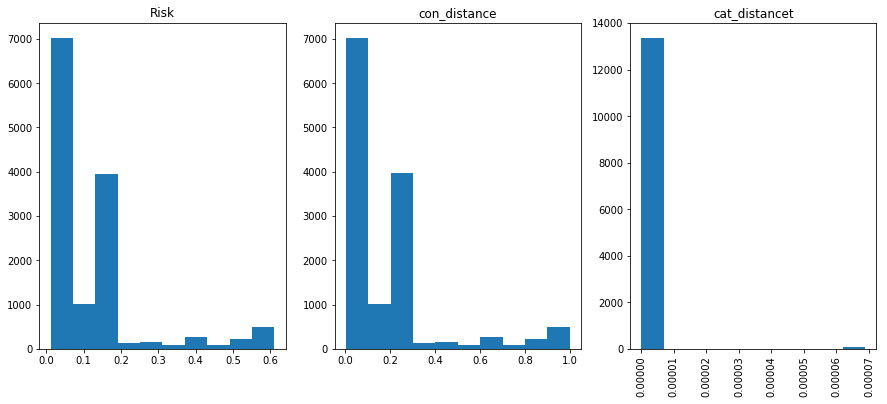

In [1620]:


# Create a figure instance
fig = plt.figure(1, figsize=(15, 6))

# Create an axes instance
ax1 = fig.add_subplot(131)
ax2 = fig.add_subplot(132)
ax3 = fig.add_subplot(133)

# Create the boxplot


ax1.hist(df['Risk'])
ax1.set_title('Risk')

ax2.hist(df['con_distance'])
ax2.set_title('con_distance')

ax3.hist(df['cat_distance'])
ax3.set_title('cat_distancet')

plt.xticks(rotation='vertical')

In [1400]:
%who DataFrame

backup_chng	 backup_chng_newDest	 backup_chng_otherAlerts	 backup_df	 cat_df	 con_df	 corr	 df	 df1	 
df2	 df_chng_newdes_final	 df_chng_other_alerts_final	 df_final	 other_df	 remained_chng_act_in_income	 temp	 


In [1621]:
backup_depositmm_df.head()

,Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Scnro Short Nm,Actvy Type Desc Tx,ACCT_TYPE,Count_Acct,TRANS_AM,Total_Count,Months_after_last_Trans
0,10224727204,4570615,2017-12-20,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,CUSTOMER,1,10000.00,1,0
1,10237889786,4565208,2017-12-13,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,CUSTOMER,1,10000.00,1,0
2,10287750317,4580304,2017-12-29,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,CUSTOMER,1,10000.00,1,0
3,10322793093,4576280,2017-12-27,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,CUSTOMER,2,128202.88,2,0
4,10428977064,4564294,2017-12-11,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,CUSTOMER,1,10000.00,1,0


In [1622]:
df.columns

Index(['Acct ID Anonymized', 'Review Id', 'Creat Ts', 'Cntry Id', 'Pttrn Id', 'Scnro Short Nm', 'Actvy Type Desc Tx', 'Count_Acct', 'TRANS_AM', 'Total_Count', 'Months_after_last_Trans', 'ACCT_TYPE__CUSTOMER', 'ACCT_TYPE__EMPLOYEE', 'con_neuron', 'con_distance', 'con_act_risk', 'cat_neuron', 'cat_distance', 'cat_act_risk', 'Risk'], dtype='object')

In [1623]:
df_depstmm_final= pd.merge(backup_depositmm_df , df[['Review Id','con_neuron', 'con_distance', 'con_act_risk', \
                               'cat_neuron', 'cat_distance', 'cat_act_risk' ,'Risk']] , on = 'Review Id' , how= 'inner')

del backup_depositmm_df

In [1624]:
df_depstmm_final.sort_values(by= ['Risk'], ascending = False)

,Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Scnro Short Nm,Actvy Type Desc Tx,ACCT_TYPE,Count_Acct,TRANS_AM,Total_Count,Months_after_last_Trans,con_neuron,con_distance,con_act_risk,cat_neuron,cat_distance,cat_act_risk,Risk
7304,26303545118,3982901,2016-01-12,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,CUSTOMER,1,10820.81,4,0,"(18, 17)",1.000000,0.050000,"(0, 0)",1.593943e-10,0.052053,0.610205
1928,12405097029,4180925,2016-10-26,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,CUSTOMER,1,10100.00,2,0,"(18, 17)",1.000000,0.050000,"(0, 0)",1.593943e-10,0.052053,0.610205
8767,37314610761,3977431,2016-01-07,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,CUSTOMER,1,10145.23,3,0,"(18, 17)",1.000000,0.050000,"(0, 0)",1.593943e-10,0.052053,0.610205
10651,56960746546,3977037,2016-01-06,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Action Withheld,CUSTOMER,1,10200.00,2,0,"(18, 17)",1.000000,0.050000,"(0, 0)",1.593943e-10,0.052053,0.610205
1695,11920871043,4097080,2016-06-20,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,CUSTOMER,1,10562.48,2,0,"(18, 17)",1.000000,0.050000,"(0, 0)",1.593943e-10,0.052053,0.610205
10646,56928034312,4248658,2017-01-30,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,CUSTOMER,1,11400.66,4,0,"(18, 17)",1.000000,0.050000,"(0, 0)",1.593943e-10,0.052053,0.610205
10640,56796592814,4192618,2016-11-08,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,CUSTOMER,1,12000.00,3,0,"(18, 17)",1.000000,0.050000,"(0, 0)",1.593943e-10,0.052053,0.610205
4763,19619999041,4243339,2017-01-20,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,CUSTOMER,1,10050.00,2,0,"(18, 17)",1.000000,0.050000,"(0, 0)",1.593943e-10,0.052053,0.610205
13045,92519093097,4175002,2016-10-13,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,CUSTOMER,1,13384.54,5,0,"(18, 17)",1.000000,0.050000,"(0, 0)",1.593943e-10,0.052053,0.610205
3796,17006568701,4158817,2016-09-20,"104,000,004","8,000,055",Deposits of Mixed Mon Inst,Auto-Closed,CUSTOMER,1,10292.15,2,0,"(18, 17)",1.000000,0.050000,"(0, 0)",1.593943e-10,0.052053,0.610205


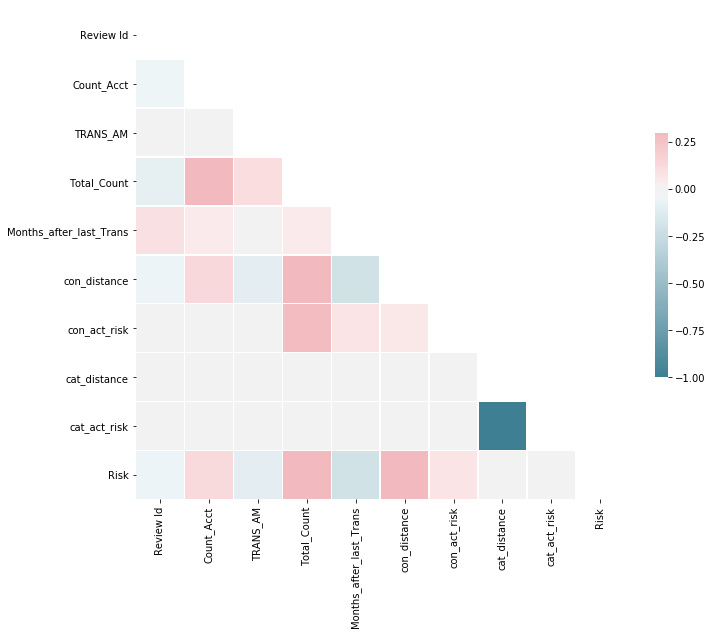

In [1625]:
# Compute the correlation matrix
corr = df_depstmm_final.corr()

# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

In [1627]:
df_depstmm_final['ACCT_TYPE'].value_counts()

CUSTOMER    13344
EMPLOYEE       92
Name: ACCT_TYPE, dtype: int64

In [1628]:
from scipy import stats
F, p = stats.f_oneway(df_depstmm_final[df_depstmm_final['ACCT_TYPE']=='CUSTOMER'].Risk,
                      df_depstmm_final[df_depstmm_final['ACCT_TYPE']=='EMPLOYEE'].Risk)
F , p

(2.409111929959086, 0.12065433879771076)

## Rapid Movement of Funds

In [2103]:
df = pd.read_csv('UofP_HutleyAnalytics_RapidMovementofFunds022019_Binary.csv')

print(df.shape)
df.head()

(67520, 9)


,Review Id,Creat Ts,Cntry Id,Pttrn Id,Anonymized Acct ID,Bindg Nm,Value Tx,Scnro Short Nm,Actvy Type Desc Tx
0,"3,997,295",1/29/16 0:00,"104,000,001","8,000,181",25174869506,ACCT_TYPE,CUSTOMER,Rapid Mvmt of Funds,Action Withheld
1,"3,997,296",1/29/16 0:00,"104,000,001","8,000,181",19989201321,ACCT_TYPE,CUSTOMER,Rapid Mvmt of Funds,Action Withheld
2,"3,997,512",1/29/16 0:00,"104,000,001","8,000,181",92721835188,ACCT_TYPE,CUSTOMER,Rapid Mvmt of Funds,Action Withheld
3,"3,997,517",1/29/16 0:00,"104,000,001","8,000,181",16879234915,ACCT_TYPE,CUSTOMER,Rapid Mvmt of Funds,Action Withheld
4,"3,997,518",1/29/16 0:00,"104,000,001","8,000,181",20798995892,ACCT_TYPE,CUSTOMER,Rapid Mvmt of Funds,Action Withheld


In [2104]:
df.duplicated().sum()

5805

In [2105]:
df=df.drop_duplicates()
df.shape

(61715, 9)

In [2106]:
df=df[df['Anonymized Acct ID'] != '#VALUE!']
df['Creat Ts']=df['Creat Ts'].apply(lambda x: datetime.strptime(x, "%m/%d/%y %H:%M"))
df.rename(columns={'Anonymized Acct ID':'Acct ID Anonymized'}, inplace=True)

In [2107]:
df['Review Id']=df['Review Id'].apply(locale.atoi)

In [2108]:
df.isna().sum().sum()

0

In [2109]:
df.shape

(58593, 9)

In [2110]:
df['Scnro Short Nm'].value_counts()

Rapid Mvmt of Funds    58593
Name: Scnro Short Nm, dtype: int64

In [2111]:
df[df.groupby(['Review Id'])['Acct ID Anonymized'].transform('nunique') >1]

,Review Id,Creat Ts,Cntry Id,Pttrn Id,Acct ID Anonymized,Bindg Nm,Value Tx,Scnro Short Nm,Actvy Type Desc Tx


In [2112]:
df.sort_values(by=['Acct ID Anonymized','Review Id'], inplace=True)
df=df.reset_index()
df=df.drop(['index'] , axis=1)
df=df.reindex(columns=['Acct ID Anonymized','Review Id', 'Creat Ts', 'Cntry Id','Pttrn Id',
       'Bindg Nm', 'Value Tx', 'Scnro Short Nm', 'Actvy Type Desc Tx'])
df.head()

,Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Bindg Nm,Value Tx,Scnro Short Nm,Actvy Type Desc Tx
0,1.12874E+11,4065404,2016-04-29,"104,000,001","8,000,181",ACCT_TYPE,CUSTOMER,Rapid Mvmt of Funds,Action Withheld
1,1.12874E+11,4065404,2016-04-29,"104,000,001","8,000,181",AGG_XACTN_RISK_NB,0,Rapid Mvmt of Funds,Action Withheld
2,1.12874E+11,4065404,2016-04-29,"104,000,001","8,000,181",BUS_DMN_TX,Bank and Brokerage,Rapid Mvmt of Funds,Action Withheld
3,1.12874E+11,4065404,2016-04-29,"104,000,001","8,000,181",EXCTN_DATE,18-Apr-16,Rapid Mvmt of Funds,Action Withheld
4,1.12874E+11,4065404,2016-04-29,"104,000,001","8,000,181",TOT_Credit_Amt,1118603.81,Rapid Mvmt of Funds,Action Withheld


In [2113]:
df['Cntry Id'].value_counts()

104,000,001    58593
Name: Cntry Id, dtype: int64

In [2114]:
df['Pttrn Id'].value_counts()

8,000,181    58593
Name: Pttrn Id, dtype: int64

In [2115]:
df['Actvy Type Desc Tx'].value_counts()

Action Withheld                58192
Case Opened                      251
Close and Suppress 3 months       70
SAR Filed                         50
Suppressed                        30
Name: Actvy Type Desc Tx, dtype: int64

In [2116]:
df[df.groupby(['Review Id'])['Acct ID Anonymized'].transform('nunique') > 1]


,Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Bindg Nm,Value Tx,Scnro Short Nm,Actvy Type Desc Tx


In [2117]:
df['Bindg Nm'].unique()

array(['ACCT_TYPE', 'AGG_XACTN_RISK_NB', 'BUS_DMN_TX', 'EXCTN_DATE',
       'TOT_Credit_Amt', 'TOT_Credit_Count', 'TOT_Debit_Amt',
       'TOT_Debit_Count', 'TRANS_AM', 'TRANS_CT'], dtype=object)

In [2118]:
not_meaningful ={'Count_Xactn_Typ', 'FCAL_NTITY_RISK_NB', 'OPP_SIDE_FL' ,'XACTN_RISK_NB' }

In [2119]:
df=df[df['Bindg Nm'].apply(lambda bindg_name: bindg_name not in not_meaningful)].reset_index()
df=df.drop(['index'] , axis=1)
df.head()

,Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Bindg Nm,Value Tx,Scnro Short Nm,Actvy Type Desc Tx
0,1.12874E+11,4065404,2016-04-29,"104,000,001","8,000,181",ACCT_TYPE,CUSTOMER,Rapid Mvmt of Funds,Action Withheld
1,1.12874E+11,4065404,2016-04-29,"104,000,001","8,000,181",AGG_XACTN_RISK_NB,0,Rapid Mvmt of Funds,Action Withheld
2,1.12874E+11,4065404,2016-04-29,"104,000,001","8,000,181",BUS_DMN_TX,Bank and Brokerage,Rapid Mvmt of Funds,Action Withheld
3,1.12874E+11,4065404,2016-04-29,"104,000,001","8,000,181",EXCTN_DATE,18-Apr-16,Rapid Mvmt of Funds,Action Withheld
4,1.12874E+11,4065404,2016-04-29,"104,000,001","8,000,181",TOT_Credit_Amt,1118603.81,Rapid Mvmt of Funds,Action Withheld


In [2120]:
df.head()

,Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Bindg Nm,Value Tx,Scnro Short Nm,Actvy Type Desc Tx
0,1.12874E+11,4065404,2016-04-29,"104,000,001","8,000,181",ACCT_TYPE,CUSTOMER,Rapid Mvmt of Funds,Action Withheld
1,1.12874E+11,4065404,2016-04-29,"104,000,001","8,000,181",AGG_XACTN_RISK_NB,0,Rapid Mvmt of Funds,Action Withheld
2,1.12874E+11,4065404,2016-04-29,"104,000,001","8,000,181",BUS_DMN_TX,Bank and Brokerage,Rapid Mvmt of Funds,Action Withheld
3,1.12874E+11,4065404,2016-04-29,"104,000,001","8,000,181",EXCTN_DATE,18-Apr-16,Rapid Mvmt of Funds,Action Withheld
4,1.12874E+11,4065404,2016-04-29,"104,000,001","8,000,181",TOT_Credit_Amt,1118603.81,Rapid Mvmt of Funds,Action Withheld


In [2122]:
df.loc[df['Bindg Nm'] == 'EXCTN_DATE' , 'Value Tx']= df.loc[df['Bindg Nm'] == 'EXCTN_DATE' , 'Value Tx']. \
                                         apply(lambda date: datetime.strptime(date, "%d-%b-%y"))
  
df.head()

SyntaxError: invalid syntax (<ipython-input-2122-e415182f1e77>, line 2)

In [2123]:
discrete = {'TRAN_CT','Count_Acct','Total_Count','DEPST_CT','ACCT_CT' ,'CURR_MTH_CT', 'PRIOR_MAX_CT', \
            'TOT_Credit_Count', 'TOT_Debit_Count','TRANS_CT','AGG_XACTN_RISK_NB'}

continous= {'TRAN_AM','TRANS_AM','DEPST_AM','CURR_MTH_AM', 'PRIOR_MAX_AM','TOT_Credit_Amt','TOT_Debit_Amt' }

string = {'CNTRY_CD','ACCT_TYPE','ALERT_TYPE','BUS_DMN_TX', 'DOMAIN', 'HIGH_RISK_SCORE','PATTERN' ,'SRC_SYS_CD'}

#dates= {'EXCTN_DATE'}

In [2124]:
discrete_rows = df['Bindg Nm'].apply(lambda bindg_name: bindg_name in discrete)
continous_rows = df['Bindg Nm'].apply(lambda bindg_name: bindg_name in continous)
string_rows = df['Bindg Nm'].apply(lambda bindg_name: bindg_name in string)
#date_rows= income_df['Bindg Nm'].apply(lambda bindg_name: bindg_name in dates)

df.loc[discrete_rows,'Value Tx'] = df.loc[discrete_rows,'Value Tx'].astype(int)
df.loc[continous_rows,'Value Tx'] = df.loc[continous_rows,'Value Tx'].astype(float)
df.loc[string_rows,'Value Tx'] = df.loc[string_rows,'Value Tx'].astype(str)
#income_df.loc[date_rows,'Value Tx']=df.loc[date_rows,'Value Tx'].apply(lambda x: pd.to_datetime(x))

In [2125]:
temp=df.copy()
temp=temp.groupby(['Acct ID Anonymized','Review Id', 'Creat Ts', 'Cntry Id',  'Pttrn Id',
       'Bindg Nm','Scnro Short Nm' ,'Value Tx']).agg({'Actvy Type Desc Tx': set}).reset_index()

In [2126]:
temp['Actvy Type Desc Tx'].value_counts()

{Action Withheld}                                 58032
{Case Opened}                                       121
{Action Withheld, Case Opened}                       80
{Action Withheld, Close and Suppress 3 months}       70
{SAR Filed, Case Opened}                             40
{Suppressed}                                         30
{Action Withheld, SAR Filed, Case Opened}            10
Name: Actvy Type Desc Tx, dtype: int64

In [2127]:
temp[temp.groupby(['Review Id'])['Actvy Type Desc Tx'].transform('nunique') > 1]

,Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Bindg Nm,Scnro Short Nm,Value Tx,Actvy Type Desc Tx


In [2128]:
df=df.groupby(['Acct ID Anonymized','Review Id', 'Creat Ts', 'Cntry Id',  'Pttrn Id',
       'Bindg Nm','Scnro Short Nm']).agg({'Value Tx': set}).reset_index()
df.head()

,Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Bindg Nm,Scnro Short Nm,Value Tx
0,1.12874E+11,4065404,2016-04-29,"104,000,001","8,000,181",ACCT_TYPE,Rapid Mvmt of Funds,{CUSTOMER}
1,1.12874E+11,4065404,2016-04-29,"104,000,001","8,000,181",AGG_XACTN_RISK_NB,Rapid Mvmt of Funds,{0}
2,1.12874E+11,4065404,2016-04-29,"104,000,001","8,000,181",BUS_DMN_TX,Rapid Mvmt of Funds,{Bank and Brokerage}
3,1.12874E+11,4065404,2016-04-29,"104,000,001","8,000,181",EXCTN_DATE,Rapid Mvmt of Funds,{18-Apr-16}
4,1.12874E+11,4065404,2016-04-29,"104,000,001","8,000,181",TOT_Credit_Amt,Rapid Mvmt of Funds,{1118603.81}


In [2129]:
df = pd.merge(df,
                 temp[['Review Id', 'Actvy Type Desc Tx']].drop_duplicates(subset=['Review Id']),
                 on='Review Id')
del temp
df.head()

,Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Bindg Nm,Scnro Short Nm,Value Tx,Actvy Type Desc Tx
0,1.12874E+11,4065404,2016-04-29,"104,000,001","8,000,181",ACCT_TYPE,Rapid Mvmt of Funds,{CUSTOMER},{Action Withheld}
1,1.12874E+11,4065404,2016-04-29,"104,000,001","8,000,181",AGG_XACTN_RISK_NB,Rapid Mvmt of Funds,{0},{Action Withheld}
2,1.12874E+11,4065404,2016-04-29,"104,000,001","8,000,181",BUS_DMN_TX,Rapid Mvmt of Funds,{Bank and Brokerage},{Action Withheld}
3,1.12874E+11,4065404,2016-04-29,"104,000,001","8,000,181",EXCTN_DATE,Rapid Mvmt of Funds,{18-Apr-16},{Action Withheld}
4,1.12874E+11,4065404,2016-04-29,"104,000,001","8,000,181",TOT_Credit_Amt,Rapid Mvmt of Funds,{1118603.81},{Action Withheld}


In [2130]:
df.reset_index()
df=df.reindex(columns=['Acct ID Anonymized','Review Id', 'Creat Ts', 'Cntry Id','Pttrn Id',
       'Bindg Nm', 'Value Tx', 'Scnro Short Nm', 'Actvy Type Desc Tx'])
df.head()

,Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Bindg Nm,Value Tx,Scnro Short Nm,Actvy Type Desc Tx
0,1.12874E+11,4065404,2016-04-29,"104,000,001","8,000,181",ACCT_TYPE,{CUSTOMER},Rapid Mvmt of Funds,{Action Withheld}
1,1.12874E+11,4065404,2016-04-29,"104,000,001","8,000,181",AGG_XACTN_RISK_NB,{0},Rapid Mvmt of Funds,{Action Withheld}
2,1.12874E+11,4065404,2016-04-29,"104,000,001","8,000,181",BUS_DMN_TX,{Bank and Brokerage},Rapid Mvmt of Funds,{Action Withheld}
3,1.12874E+11,4065404,2016-04-29,"104,000,001","8,000,181",EXCTN_DATE,{18-Apr-16},Rapid Mvmt of Funds,{Action Withheld}
4,1.12874E+11,4065404,2016-04-29,"104,000,001","8,000,181",TOT_Credit_Amt,{1118603.81},Rapid Mvmt of Funds,{Action Withheld}


In [2131]:
df['Actvy Type Desc Tx']=df['Actvy Type Desc Tx'].apply(lambda x: list(x)[0] if (len(x) == 1) else x)

In [2132]:
df['Value Tx']=df['Value Tx'].apply(lambda x: list(x)[0] if (len(x) == 1) else x)

In [2133]:
value_bindname_rows= df['Bindg Nm'].apply(lambda x: (x in discrete) | (x in continous))

In [2134]:
df.loc[value_bindname_rows , 'Value Tx'] = df.loc[value_bindname_rows , 'Value Tx']. \
                                                                      apply(lambda x: max(x) if type(x)== set else x)

In [2135]:
df[df['Value Tx'].apply(lambda x: type(x) == set)]['Bindg Nm'].value_counts()

EXCTN_DATE    323
Name: Bindg Nm, dtype: int64

In [2136]:
df.loc[df['Bindg Nm'] == 'EXCTN_DATE' , 'Value Tx'] = df.loc[df['Bindg Nm'] == 'EXCTN_DATE' , 'Value Tx']. \
                                                                      apply(lambda x: max(x) if type(x)== set else x)

In [2137]:
df[df['Value Tx'].apply(lambda x: type(x) == set)]['Bindg Nm'].value_counts()

Series([], Name: Bindg Nm, dtype: int64)

In [2138]:
df['Actvy Type Desc Tx'].value_counts()

Action Withheld                                   57710
Case Opened                                         120
{Action Withheld, Case Opened}                       80
{Action Withheld, Close and Suppress 3 months}       70
{SAR Filed, Case Opened}                             40
Suppressed                                           30
{Action Withheld, SAR Filed, Case Opened}            10
Name: Actvy Type Desc Tx, dtype: int64

In [2139]:
Actvy_pile_1={'Auto-Closed', 'Action Withheld','Suppressed','Close and Suppress 3 months','Close and Suppress 6 months'}
Actvy_pile_2={'Case Opened'}
Actvy_pile_3={'CTR Filed','Referred for Review','SAR Filed'}

In [2140]:
set_Actvys = df['Actvy Type Desc Tx'].apply(lambda x: type(x) == set)

In [2141]:
def final_activity(set_of_activity):
    pile_3_activities= [activity for activity in set_of_activity if activity in Actvy_pile_3]
    if len(pile_3_activities) > 0:
        return pile_3_activities[0];
    elif ('Case Opened' in set_of_activity):
        return 'Case Opened';
    elif ('Close and Suppress 3 months' in set_of_activity) | ('Close and Suppress 6 months' in set_of_activity) | ('Suppressed' in set_of_activity) :
                return 'Suppressed';
    elif 'Action Withheld' in set_of_activity:
            return 'Action Withheld';
    elif 'Auto-Closed' in set_of_activity:
            return 'Auto-Closed';  

In [2142]:
df.loc[set_Actvys , 'Actvy Type Desc Tx'] = df.loc[set_Actvys , 'Actvy Type Desc Tx']. \
   apply(final_activity)

In [2143]:
df.loc[df['Actvy Type Desc Tx']== 'Close and Suppress 3 months', 'Actvy Type Desc Tx']= 'Suppressed'
df.loc[df['Actvy Type Desc Tx']== 'Close and Suppress 6 months', 'Actvy Type Desc Tx']= 'Suppressed'

In [2144]:
df['Actvy Type Desc Tx'].value_counts()

Action Withheld    57710
Case Opened          200
Suppressed           100
SAR Filed             50
Name: Actvy Type Desc Tx, dtype: int64

In [2145]:
df['Acct ID Anonymized'].apply(lambda x: type(x) == set).sum()

0

In [2146]:
result = pd.crosstab([df['Acct ID Anonymized'] , df['Review Id'] , df['Creat Ts'] , df['Cntry Id'] , \
              df['Pttrn Id'] , df['Scnro Short Nm'] , df['Actvy Type Desc Tx']], \
            df['Bindg Nm'] , \
            values=df['Value Tx'] , \
            aggfunc='sum')

In [2147]:
result.head()

Bindg Nm                                                                                             ACCT_TYPE AGG_XACTN_RISK_NB          BUS_DMN_TX EXCTN_DATE TOT_Credit_Amt TOT_Credit_Count TOT_Debit_Amt TOT_Debit_Count     TRANS_AM TRANS_CT
Acct ID Anonymized Review Id Creat Ts   Cntry Id    Pttrn Id  Scnro Short Nm      Actvy Type Desc Tx                                                                                                                                               
1.12874E+11        4065404   2016-04-29 104,000,001 8,000,181 Rapid Mvmt of Funds Action Withheld     CUSTOMER                 0  Bank and Brokerage  18-Apr-16     1.1186e+06                4     1.155e+06               1   1.1186e+06        5
                   4084220   2016-05-31 104,000,001 8,000,181 Rapid Mvmt of Funds Action Withheld     CUSTOMER                 0  Bank and Brokerage  18-Apr-16    1.10968e+06                4    1.1574e+06               2  1.10968e+06        6
10066687033        4162221   2016-09-30 104,000,001 8,000,181 Rapid Mvmt of Funds Action Withheld     CUSTOMER                 0           Brokerage  29-Sep-16         660000                3        660000               4       660000        7
                   4187919   2016-10-31 104,000,001 8,000,181 Rapid Mvmt of Funds Action Withheld     CUSTOMER                 0           Brokerage  21-Sep-16         620000                2        620000               3       620000        5
10073288437        4103890   2016-06-30 104,000,001 8,000,181 Rapid Mvmt of Funds Action Withheld     CUSTOMER                 0  Bank and Brokerage  29-Jun-16      1.617e+06                5   1.45704e+06               6    1.617e+06       11

In [2148]:
%who DataFrame

backup_chng	 backup_chng_newDest	 backup_chng_otherAlerts	 backup_depositmm_df	 backup_df	 cat_df	 con_df	 corr	 df	 
df1	 df2	 df_chng_newdes_final	 df_chng_other_Alerts_final	 df_chng_other_alerts_final	 df_depstmm_final	 df_final	 other_df	 remained_chng_act_in_income	 
result	 


In [2149]:
df=result.reset_index().rename_axis("", axis="columns")
df.head()

,Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Scnro Short Nm,Actvy Type Desc Tx,ACCT_TYPE,AGG_XACTN_RISK_NB,BUS_DMN_TX,EXCTN_DATE,TOT_Credit_Amt,TOT_Credit_Count,TOT_Debit_Amt,TOT_Debit_Count,TRANS_AM,TRANS_CT
0,1.12874E+11,4065404,2016-04-29,"104,000,001","8,000,181",Rapid Mvmt of Funds,Action Withheld,CUSTOMER,0,Bank and Brokerage,18-Apr-16,1.1186e+06,4,1.155e+06,1,1.1186e+06,5
1,1.12874E+11,4084220,2016-05-31,"104,000,001","8,000,181",Rapid Mvmt of Funds,Action Withheld,CUSTOMER,0,Bank and Brokerage,18-Apr-16,1.10968e+06,4,1.1574e+06,2,1.10968e+06,6
2,10066687033,4162221,2016-09-30,"104,000,001","8,000,181",Rapid Mvmt of Funds,Action Withheld,CUSTOMER,0,Brokerage,29-Sep-16,660000,3,660000,4,660000,7
3,10066687033,4187919,2016-10-31,"104,000,001","8,000,181",Rapid Mvmt of Funds,Action Withheld,CUSTOMER,0,Brokerage,21-Sep-16,620000,2,620000,3,620000,5
4,10073288437,4103890,2016-06-30,"104,000,001","8,000,181",Rapid Mvmt of Funds,Action Withheld,CUSTOMER,0,Bank and Brokerage,29-Jun-16,1.617e+06,5,1.45704e+06,6,1.617e+06,11


In [2150]:
del result

In [2151]:
df.shape

(5806, 17)

In [2152]:
df.isna().sum().sum()

0

In [2153]:
df['ACCT_TYPE'].value_counts()

CUSTOMER    5789
EMPLOYEE      17
Name: ACCT_TYPE, dtype: int64

In [2154]:
df['BUS_DMN_TX'].value_counts()

Brokerage             4969
Bank and Brokerage     482
Bank                   355
Name: BUS_DMN_TX, dtype: int64

In [2155]:
%who DataFrame


backup_chng	 backup_chng_newDest	 backup_chng_otherAlerts	 backup_depositmm_df	 backup_df	 cat_df	 con_df	 corr	 df	 
df1	 df2	 df_chng_newdes_final	 df_chng_other_Alerts_final	 df_chng_other_alerts_final	 df_depstmm_final	 df_final	 other_df	 remained_chng_act_in_income	 



In [2156]:
sum(df['TRANS_CT'] != df['TOT_Credit_Count'] + df['TOT_Debit_Count'])

0

In [2157]:
sum(df['TRANS_AM'] != df['TOT_Credit_Amt'])

0

In [2158]:
#df=df.drop(['TRANS_AM','TRANS_CT'],axis=1)

In [2159]:
df['AGG_XACTN_RISK_NB'].value_counts()

0.0     4780
10.0     549
7.0      469
5.0        8
Name: AGG_XACTN_RISK_NB, dtype: int64

In [2160]:
df['BUS_DMN_TX'].value_counts()

Brokerage             4969
Bank and Brokerage     482
Bank                   355
Name: BUS_DMN_TX, dtype: int64

In [2161]:
df['Cntry Id'].value_counts() 

104,000,001    5806
Name: Cntry Id, dtype: int64

In [2162]:
df['Pttrn Id'].value_counts()

8,000,181    5806
Name: Pttrn Id, dtype: int64

In [2163]:
df.dtypes


Acct ID Anonymized            object
Review Id                      int64
Creat Ts              datetime64[ns]
Cntry Id                      object
Pttrn Id                      object
Scnro Short Nm                object
Actvy Type Desc Tx            object
ACCT_TYPE                     object
AGG_XACTN_RISK_NB             object
BUS_DMN_TX                    object
EXCTN_DATE                    object
TOT_Credit_Amt                object
TOT_Credit_Count              object
TOT_Debit_Amt                 object
TOT_Debit_Count               object
TRANS_AM                      object
TRANS_CT                      object
dtype: object

In [2164]:
df['AGG_XACTN_RISK_NB']=df['AGG_XACTN_RISK_NB'].astype('int')

df['TOT_Credit_Count']=df['TOT_Credit_Count'].astype('int')
df['TOT_Credit_Amt']=df['TOT_Credit_Amt'].astype('float')

df['TOT_Debit_Count']=df['TOT_Debit_Count'].astype('int')
df['TOT_Debit_Amt']=df['TOT_Debit_Amt'].astype('float')

df['TRANS_CT']=df['TRANS_CT'].astype('int')
df['TRANS_AM']=df['TRANS_AM'].astype('float')

df['EXCTN_DATE']=df['EXCTN_DATE'].astype('datetime64')

In [2165]:
df.dtypes


Acct ID Anonymized            object
Review Id                      int64
Creat Ts              datetime64[ns]
Cntry Id                      object
Pttrn Id                      object
Scnro Short Nm                object
Actvy Type Desc Tx            object
ACCT_TYPE                     object
AGG_XACTN_RISK_NB              int64
BUS_DMN_TX                    object
EXCTN_DATE            datetime64[ns]
TOT_Credit_Amt               float64
TOT_Credit_Count               int64
TOT_Debit_Amt                float64
TOT_Debit_Count                int64
TRANS_AM                     float64
TRANS_CT                       int64
dtype: object

In [2166]:
df[df.groupby(['Acct ID Anonymized'])['EXCTN_DATE'].transform('nunique')==1]

,Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Scnro Short Nm,Actvy Type Desc Tx,ACCT_TYPE,AGG_XACTN_RISK_NB,BUS_DMN_TX,EXCTN_DATE,TOT_Credit_Amt,TOT_Credit_Count,TOT_Debit_Amt,TOT_Debit_Count,TRANS_AM,TRANS_CT


In [2167]:
df.sort_values(by=['Acct ID Anonymized','EXCTN_DATE','Review Id'], inplace=True)
df=df.reset_index()
df=df.drop(['index'] , axis=1)

In [2168]:
df['Days_after_last_Trans']=df.groupby(['Acct ID Anonymized'])['EXCTN_DATE'].diff().fillna(0).apply(lambda x : x.days)

In [2203]:
#backup_rapidmm_df=df.copy()
df= backup_rapidmm_df.copy()

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


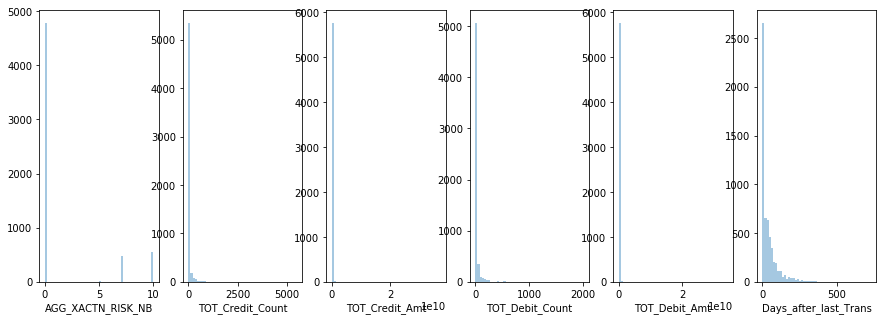

In [2204]:
f, axes = plt.subplots(1, 6 ,figsize=(15, 5))

sns.distplot(df['AGG_XACTN_RISK_NB'] , kde= False ,ax=axes[0])
sns.distplot(df['TOT_Credit_Count'] , kde= False ,ax=axes[1])
sns.distplot(df['TOT_Credit_Amt'] , kde= False ,ax=axes[2])
sns.distplot(df['TOT_Debit_Count'] , kde= False ,ax=axes[3])
sns.distplot(df['TOT_Debit_Amt'] , kde= False ,ax=axes[4])
sns.distplot(df['Days_after_last_Trans'] , kde= False ,ax=axes[5])

In [2205]:
#threshold= 3

zscore_AGG_XACTN_RISK_NB=pd.Series(np.abs(stats.zscore(df['AGG_XACTN_RISK_NB'])))
zscore_TOT_Credit_Count=pd.Series(np.abs(stats.zscore(df['TOT_Credit_Count'])))
zscore_TOT_Credit_Amt=pd.Series(np.abs(stats.zscore(df['TOT_Credit_Amt'])))
zscore_TOT_Debit_Count=pd.Series(np.abs(stats.zscore(df['TOT_Debit_Count'])))
zscore_TOT_Debit_Amt=pd.Series(np.abs(stats.zscore(df['TOT_Debit_Amt'])))
#zscore_Months_after_last_Trans =pd.Series(np.abs(stats.zscore(df['Months_after_last_Trans'])))

In [2207]:
desired_records = (zscore_AGG_XACTN_RISK_NB < threshold) & (zscore_TOT_Credit_Count < threshold) \
                 & (zscore_TOT_Credit_Amt < threshold) & (zscore_TOT_Debit_Count < threshold) \
                 & (zscore_TOT_Debit_Amt < threshold)                                      
sum(desired_records)

5613

In [2208]:
temp=df[~desired_records]

len(temp['Acct ID Anonymized'].unique()) / len(df['Acct ID Anonymized'].unique())

0.0165710643722116

In [2209]:
outliers_chng_new_wire_transfer = temp['Acct ID Anonymized'].unique()
len(outliers_chng_new_wire_transfer)

26

In [2210]:
df= df[desired_records].reset_index().drop(['index'] , axis=1)

In [2211]:
df.shape

(5613, 18)

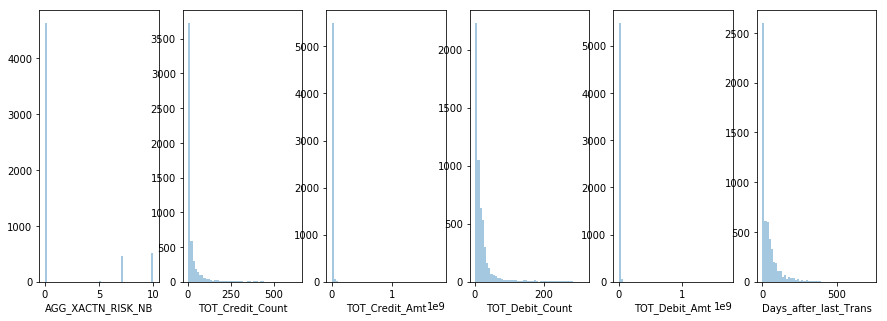

In [2212]:
f, axes = plt.subplots(1, 6 ,figsize=(15, 5))

sns.distplot(df['AGG_XACTN_RISK_NB'] , kde= False ,ax=axes[0])
sns.distplot(df['TOT_Credit_Count'] , kde= False ,ax=axes[1])
sns.distplot(df['TOT_Credit_Amt'] , kde= False ,ax=axes[2])
sns.distplot(df['TOT_Debit_Count'] , kde= False ,ax=axes[3])
sns.distplot(df['TOT_Debit_Amt'] , kde= False ,ax=axes[4])
sns.distplot(df['Days_after_last_Trans'] , kde= False ,ax=axes[5])

Text(0.5, 1.0, 'Days_after_last_Trans')

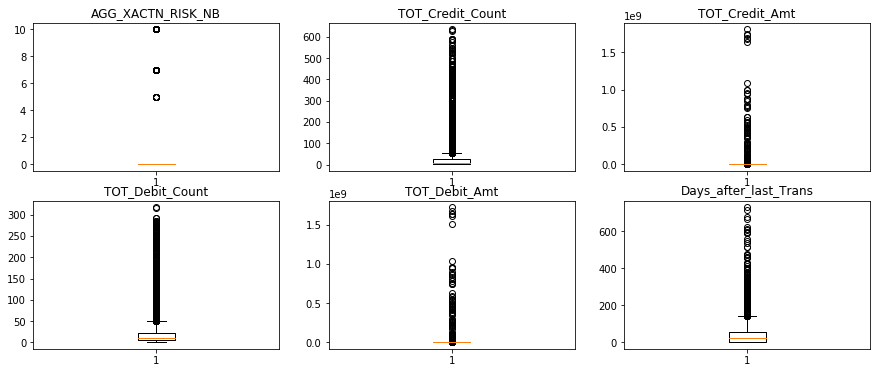

In [2215]:
# Create a figure instance
fig = plt.figure(1, figsize=(15, 6))

# Create an axes instance
ax1 = fig.add_subplot(231)
ax2 = fig.add_subplot(232)
ax3 = fig.add_subplot(233)
ax4 = fig.add_subplot(234)
ax5 = fig.add_subplot(235)
ax6 = fig.add_subplot(236)

# Create the boxplot
ax1.boxplot(df['AGG_XACTN_RISK_NB'])
ax1.set_title('AGG_XACTN_RISK_NB')

ax2.boxplot(df['TOT_Credit_Count'])
ax2.set_title('TOT_Credit_Count')

ax3.boxplot(df['TOT_Credit_Amt'])
ax3.set_title('TOT_Credit_Amt')

ax4.boxplot(df['TOT_Debit_Count'])
ax4.set_title('TOT_Debit_Count')

ax5.boxplot(df['TOT_Debit_Amt'])
ax5.set_title('TOT_Debit_Amt')

ax6.boxplot(df['Days_after_last_Trans'])
ax6.set_title('Days_after_last_Trans')

In [2216]:
df.head()

,Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Scnro Short Nm,Actvy Type Desc Tx,ACCT_TYPE,AGG_XACTN_RISK_NB,BUS_DMN_TX,EXCTN_DATE,TOT_Credit_Amt,TOT_Credit_Count,TOT_Debit_Amt,TOT_Debit_Count,TRANS_AM,TRANS_CT,Days_after_last_Trans
0,1.12874E+11,4065404,2016-04-29,"104,000,001","8,000,181",Rapid Mvmt of Funds,Action Withheld,CUSTOMER,0,Bank and Brokerage,2016-04-18,1118603.81,4,1155000.00,1,1118603.81,5,0
1,1.12874E+11,4084220,2016-05-31,"104,000,001","8,000,181",Rapid Mvmt of Funds,Action Withheld,CUSTOMER,0,Bank and Brokerage,2016-04-18,1109684.49,4,1157400.00,2,1109684.49,6,0
2,10066687033,4187919,2016-10-31,"104,000,001","8,000,181",Rapid Mvmt of Funds,Action Withheld,CUSTOMER,0,Brokerage,2016-09-21,620000.00,2,620000.00,3,620000.00,5,0
3,10066687033,4162221,2016-09-30,"104,000,001","8,000,181",Rapid Mvmt of Funds,Action Withheld,CUSTOMER,0,Brokerage,2016-09-29,660000.00,3,660000.00,4,660000.00,7,8
4,10073288437,4126045,2016-07-29,"104,000,001","8,000,181",Rapid Mvmt of Funds,Action Withheld,CUSTOMER,0,Bank,2016-06-23,804928.74,2,757040.72,4,804928.74,6,0


In [2217]:
df.columns

Index(['Acct ID Anonymized', 'Review Id', 'Creat Ts', 'Cntry Id', 'Pttrn Id', 'Scnro Short Nm', 'Actvy Type Desc Tx', 'ACCT_TYPE', 'AGG_XACTN_RISK_NB', 'BUS_DMN_TX', 'EXCTN_DATE', 'TOT_Credit_Amt', 'TOT_Credit_Count', 'TOT_Debit_Amt', 'TOT_Debit_Count', 'TRANS_AM', 'TRANS_CT', 'Days_after_last_Trans'], dtype='object', name='')

In [2218]:
df=df[['Acct ID Anonymized', 'Review Id', 'Actvy Type Desc Tx', \
       'ACCT_TYPE', 'BUS_DMN_TX','AGG_XACTN_RISK_NB', 'TOT_Credit_Count', \
      'TOT_Credit_Amt', 'TOT_Debit_Count' , 'TOT_Debit_Amt' , 'Days_after_last_Trans' ]]

In [2219]:
cat_columns = ["ACCT_TYPE",'BUS_DMN_TX']

In [2220]:
df = pd.get_dummies(df, prefix_sep="__", columns=cat_columns)

In [2221]:
df.head()

,Acct ID Anonymized,Review Id,Actvy Type Desc Tx,AGG_XACTN_RISK_NB,TOT_Credit_Count,TOT_Credit_Amt,TOT_Debit_Count,TOT_Debit_Amt,Days_after_last_Trans,ACCT_TYPE__CUSTOMER,ACCT_TYPE__EMPLOYEE,BUS_DMN_TX__Bank,BUS_DMN_TX__Bank and Brokerage,BUS_DMN_TX__Brokerage
0,1.12874E+11,4065404,Action Withheld,0,4,1118603.81,1,1155000.00,0,1,0,0,1,0
1,1.12874E+11,4084220,Action Withheld,0,4,1109684.49,2,1157400.00,0,1,0,0,1,0
2,10066687033,4187919,Action Withheld,0,2,620000.00,3,620000.00,0,1,0,0,0,1
3,10066687033,4162221,Action Withheld,0,3,660000.00,4,660000.00,8,1,0,0,0,1
4,10073288437,4126045,Action Withheld,0,2,804928.74,4,757040.72,0,1,0,1,0,0


In [2222]:
df.dtypes

Acct ID Anonymized                 object
Review Id                           int64
Actvy Type Desc Tx                 object
AGG_XACTN_RISK_NB                   int64
TOT_Credit_Count                    int64
TOT_Credit_Amt                    float64
TOT_Debit_Count                     int64
TOT_Debit_Amt                     float64
Days_after_last_Trans               int64
ACCT_TYPE__CUSTOMER                 uint8
ACCT_TYPE__EMPLOYEE                 uint8
BUS_DMN_TX__Bank                    uint8
BUS_DMN_TX__Bank and Brokerage      uint8
BUS_DMN_TX__Brokerage               uint8
dtype: object

In [2223]:
cols = df.columns
cols[3:9]

Index(['AGG_XACTN_RISK_NB', 'TOT_Credit_Count', 'TOT_Credit_Amt', 'TOT_Debit_Count', 'TOT_Debit_Amt', 'Days_after_last_Trans'], dtype='object')

In [2224]:
for col in cols[3:9]:
    x, y = df[col].min(), df[col].max()
    df[col] = (df[col] - x) / (y - x) 

In [2225]:
df.head()

,Acct ID Anonymized,Review Id,Actvy Type Desc Tx,AGG_XACTN_RISK_NB,TOT_Credit_Count,TOT_Credit_Amt,TOT_Debit_Count,TOT_Debit_Amt,Days_after_last_Trans,ACCT_TYPE__CUSTOMER,ACCT_TYPE__EMPLOYEE,BUS_DMN_TX__Bank,BUS_DMN_TX__Bank and Brokerage,BUS_DMN_TX__Brokerage
0,1.12874E+11,4065404,Action Withheld,0.0,0.003165,0.000594,0.000000,0.000644,0.000000,1,0,0,1,0
1,1.12874E+11,4084220,Action Withheld,0.0,0.003165,0.000589,0.003165,0.000645,0.000000,1,0,0,1,0
2,10066687033,4187919,Action Withheld,0.0,0.000000,0.000318,0.006329,0.000333,0.000000,1,0,0,0,1
3,10066687033,4162221,Action Withheld,0.0,0.001582,0.000340,0.009494,0.000357,0.010989,1,0,0,0,1
4,10073288437,4126045,Action Withheld,0.0,0.000000,0.000421,0.009494,0.000413,0.000000,1,0,1,0,0


In [2226]:
df.shape

(5613, 14)

In [2227]:
con_var=np.array(df.iloc[:,3:9])
cat_var= np.array(df.iloc[:,9:14])

In [2228]:
con_var

array([[0.        , 0.00316456, 0.00059422, 0.        , 0.0006436 ,
        0.        ],
       [0.        , 0.00316456, 0.00058928, 0.00316456, 0.00064499,
        0.        ],
       [0.        , 0.        , 0.00031818, 0.00632911, 0.00033331,
        0.        ],
       ...,
       [0.        , 0.00158228, 0.00276688, 0.00316456, 0.00335697,
        0.        ],
       [0.        , 0.00158228, 0.00030655, 0.00632911, 0.0003209 ,
        0.1510989 ],
       [0.        , 0.00158228, 0.00031043, 0.01265823, 0.0003218 ,
        0.        ]])

In [2229]:
con_var.shape , cat_var.shape

((5613, 6), (5613, 5))

In [2230]:
con_som = MiniSom(20, 20, 6, sigma=10, learning_rate=0.5,neighborhood_function='gaussian', random_seed=10)
con_som.train_random(con_var, epochs, verbose=True)

 [ 20000 / 20000 ] 100% 0.00547 it/s

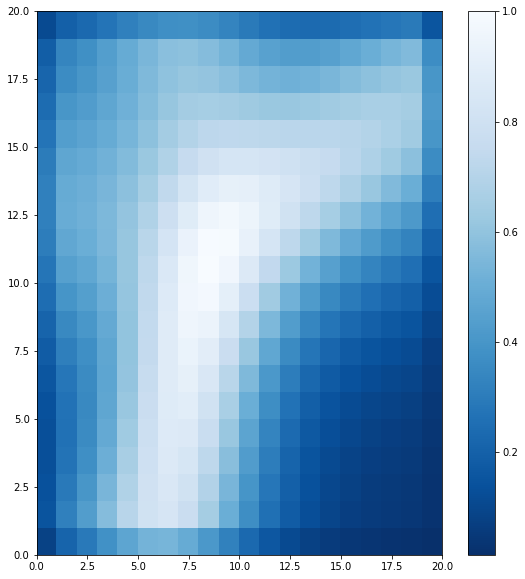

In [2231]:
plt.figure(figsize=(20, 10))
# Plotting the response for each pattern in the iris dataset

plt.subplot(1, 2, 1)
plt.pcolormesh(con_som.distance_map(), cmap='Blues_r')  # plotting the distance map as background
plt.colorbar()
#plt.subplot(1, 2, 2)
#plt.pcolormesh(sar_stat.T, cmap='Blues')
#plt.colorbar()

In [2232]:
cat_som = MiniSom(20, 20, 5, sigma=10, learning_rate=0.5,neighborhood_function='gaussian', random_seed=10)
cat_som.pca_weights_init(cat_var)
cat_som.train_random(cat_var, epochs, verbose=True)

 [ 20000 / 20000 ] 100% 0.00517 it/s

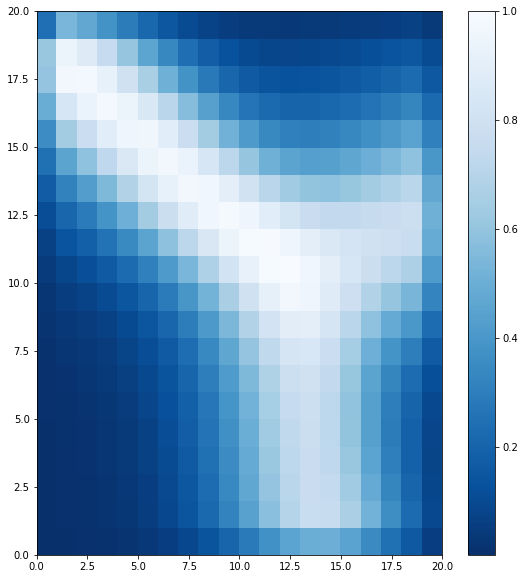

In [2233]:
plt.figure(figsize=(20, 10))
# Plotting the response for each pattern in the iris dataset

plt.subplot(1, 2, 1)
plt.pcolormesh(cat_som.distance_map(), cmap='Blues_r')  # plotting the distance map as background
plt.colorbar()
#plt.subplot(1, 2, 2)
#plt.pcolormesh(sar_stat.T, cmap='Blues')
#plt.colorbar()

In [2234]:
con_mid=con_som.distance_map()
cat_mid=cat_som.distance_map()

con_mid, cat_mid

(array([[0.08111362, 0.21306312, 0.29112114, 0.38132627, 0.46793749,
         0.52668417, 0.5363518 , 0.49308366, 0.41282586, 0.31980756,
         0.23366893, 0.16439318, 0.11384341, 0.07941452, 0.05705361,
         0.04292862, 0.03406946, 0.02844031, 0.0247615 , 0.01445145],
        [0.15128795, 0.31601485, 0.43281278, 0.57103498, 0.70824204,
         0.80700736, 0.83148828, 0.77146131, 0.64968248, 0.50483264,
         0.36948589, 0.26050676, 0.18121376, 0.12750701, 0.09293296,
         0.07139829, 0.05815809, 0.04993647, 0.04468173, 0.02689201],
        [0.13792122, 0.28889358, 0.3999259 , 0.53803229, 0.68465623,
         0.80263326, 0.84970688, 0.80602439, 0.68934011, 0.54058556,
         0.3975633 , 0.281021  , 0.1958697 , 0.13816011, 0.10102592,
         0.07788124, 0.0635983 , 0.05465983, 0.04888427, 0.02959177],
        [0.13134171, 0.27072915, 0.37411032, 0.50859052, 0.6599784 ,
         0.79325821, 0.86189184, 0.83653648, 0.72804524, 0.57784463,
         0.42847228, 0.3048191 

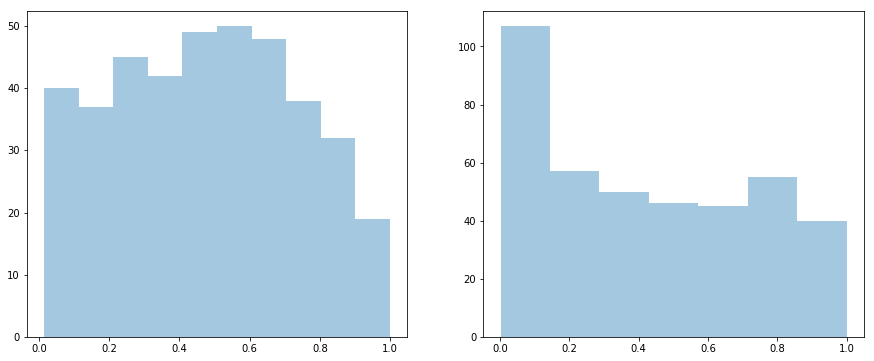

In [2236]:
f, axes = plt.subplots(1, 2 ,figsize=(15, 6))
sns.distplot(con_mid.reshape(1,400) , kde= False ,ax=axes[0])
sns.distplot(cat_mid.reshape(1,400) , kde= False ,ax=axes[1])


In [2237]:
df['Actvy Type Desc Tx'].value_counts()

Action Withheld    5578
Case Opened          20
Suppressed           10
SAR Filed             5
Name: Actvy Type Desc Tx, dtype: int64

In [2238]:
df.head()

,Acct ID Anonymized,Review Id,Actvy Type Desc Tx,AGG_XACTN_RISK_NB,TOT_Credit_Count,TOT_Credit_Amt,TOT_Debit_Count,TOT_Debit_Amt,Days_after_last_Trans,ACCT_TYPE__CUSTOMER,ACCT_TYPE__EMPLOYEE,BUS_DMN_TX__Bank,BUS_DMN_TX__Bank and Brokerage,BUS_DMN_TX__Brokerage
0,1.12874E+11,4065404,Action Withheld,0.0,0.003165,0.000594,0.000000,0.000644,0.000000,1,0,0,1,0
1,1.12874E+11,4084220,Action Withheld,0.0,0.003165,0.000589,0.003165,0.000645,0.000000,1,0,0,1,0
2,10066687033,4187919,Action Withheld,0.0,0.000000,0.000318,0.006329,0.000333,0.000000,1,0,0,0,1
3,10066687033,4162221,Action Withheld,0.0,0.001582,0.000340,0.009494,0.000357,0.010989,1,0,0,0,1
4,10073288437,4126045,Action Withheld,0.0,0.000000,0.000421,0.009494,0.000413,0.000000,1,0,1,0,0


In [2239]:
df['con_neuron']=df.loc[:,df.columns[3:9]].apply(lambda x: con_som.winner(np.array(np.array(x))) , axis=1)

df['con_neuron'] = df['con_neuron'].apply(lambda x: str(x))
df.head()

,Acct ID Anonymized,Review Id,Actvy Type Desc Tx,AGG_XACTN_RISK_NB,TOT_Credit_Count,TOT_Credit_Amt,TOT_Debit_Count,TOT_Debit_Amt,Days_after_last_Trans,ACCT_TYPE__CUSTOMER,ACCT_TYPE__EMPLOYEE,BUS_DMN_TX__Bank,BUS_DMN_TX__Bank and Brokerage,BUS_DMN_TX__Brokerage,con_neuron
0,1.12874E+11,4065404,Action Withheld,0.0,0.003165,0.000594,0.000000,0.000644,0.000000,1,0,0,1,0,"(19, 0)"
1,1.12874E+11,4084220,Action Withheld,0.0,0.003165,0.000589,0.003165,0.000645,0.000000,1,0,0,1,0,"(13, 0)"
2,10066687033,4187919,Action Withheld,0.0,0.000000,0.000318,0.006329,0.000333,0.000000,1,0,0,0,1,"(2, 0)"
3,10066687033,4162221,Action Withheld,0.0,0.001582,0.000340,0.009494,0.000357,0.010989,1,0,0,0,1,"(18, 9)"
4,10073288437,4126045,Action Withheld,0.0,0.000000,0.000421,0.009494,0.000413,0.000000,1,0,1,0,0,"(2, 0)"


In [2240]:
df['Actvy Type Desc Tx'].value_counts()

Action Withheld    5578
Case Opened          20
Suppressed           10
SAR Filed             5
Name: Actvy Type Desc Tx, dtype: int64

In [2277]:
con_df=df.groupby(['con_neuron'])['Actvy Type Desc Tx'].value_counts().unstack().fillna(0)
con_df.index = [str(neuron) for neuron in list(con_df.index)]
con_df=con_df[['Action Withheld', 'Suppressed', 'Case Opened','SAR Filed']]
con_df.sort_values( by= ['SAR Filed'] , ascending= False)

Actvy Type Desc Tx,Action Withheld,Suppressed,Case Opened,SAR Filed
"(0, 19)",379.0,0.0,3.0,3.0
"(13, 6)",21.0,0.0,0.0,1.0
"(4, 0)",189.0,0.0,1.0,1.0
"(0, 10)",27.0,0.0,0.0,0.0
"(3, 16)",1.0,0.0,0.0,0.0
"(2, 18)",1.0,0.0,0.0,0.0
"(2, 19)",7.0,0.0,0.0,0.0
"(2, 6)",6.0,0.0,0.0,0.0
"(2, 7)",1.0,0.0,0.0,0.0
"(2, 9)",2.0,0.0,0.0,0.0


In [2278]:
con_df['index']=con_df.index

con_df['mean_agg_xactn_risk'] =con_df['index'].apply(lambda neuron: \
                                      df.groupby(['con_neuron'])['AGG_XACTN_RISK_NB'].agg('mean')[neuron])

con_df['con_distance'] = con_df['index'].apply(lambda x: con_mid[int(x[1:-1].split(',')[0]),\
                                                                 int(x[1:-1].split(',')[1])])

con_df=con_df.drop(['index'] , axis=1)
con_df

Actvy Type Desc Tx,Action Withheld,Suppressed,Case Opened,SAR Filed,mean_agg_xactn_risk,con_distance
"(0, 10)",27.0,0.0,0.0,0.0,0.922222,0.233669
"(0, 11)",34.0,0.0,0.0,0.0,0.947059,0.164393
"(0, 12)",29.0,0.0,0.0,0.0,0.803448,0.113843
"(0, 13)",22.0,0.0,0.0,0.0,0.750000,0.079415
"(0, 14)",15.0,0.0,0.0,0.0,0.860000,0.057054
"(0, 15)",31.0,0.0,0.0,0.0,0.796774,0.042929
"(0, 16)",26.0,0.0,0.0,0.0,0.723077,0.034069
"(0, 17)",10.0,0.0,0.0,0.0,0.850000,0.028440
"(0, 18)",4.0,0.0,0.0,0.0,0.775000,0.024761
"(0, 19)",379.0,0.0,3.0,3.0,0.890649,0.014451


In [2270]:
#pile_1_risk = .05
#pile_2_risk = .45
#pile_3_risk = .95

def risk(x):
    return .1 * ((pile_1_risk *sum(x[0:2]) + pile_2_risk *x[2] + pile_3_risk * x[3]) / sum(x)) + .9 * x[4]

In [2279]:
con_df['con_act_risk']=con_df.iloc[:,0:5].apply(lambda activities_of_neuron: risk(activities_of_neuron) , axis=1)

con_df.sort_values( by= ['con_distance'] , ascending= False)

Actvy Type Desc Tx,Action Withheld,Suppressed,Case Opened,SAR Filed,mean_agg_xactn_risk,con_distance,con_act_risk
"(7, 8)",1.0,0.0,0.0,0.0,1.000000,0.894232,0.902500
"(2, 6)",6.0,0.0,0.0,0.0,0.700000,0.849707,0.634478
"(1, 6)",5.0,0.0,0.0,0.0,0.700000,0.831488,0.634386
"(11, 11)",1.0,0.0,0.0,0.0,0.700000,0.829978,0.632941
"(2, 7)",1.0,0.0,0.0,0.0,0.700000,0.806024,0.632941
"(12, 6)",47.0,0.0,1.0,0.0,0.000000,0.785022,0.005833
"(13, 13)",1.0,0.0,0.0,0.0,1.000000,0.781444,0.902500
"(7, 9)",1.0,0.0,0.0,0.0,0.700000,0.772183,0.632941
"(1, 7)",2.0,0.0,0.0,0.0,0.700000,0.771461,0.633704
"(14, 7)",17.0,0.0,0.0,0.0,0.000000,0.752714,0.005000


In [2280]:
df['con_distance']=con_df.loc[df['con_neuron'],'con_distance'].reset_index().drop(['index'],axis=1)

df['con_act_risk'] = con_df.loc[df['con_neuron'],'con_act_risk'].reset_index().drop(['index'],axis=1)
df.head()

,Acct ID Anonymized,Review Id,Actvy Type Desc Tx,AGG_XACTN_RISK_NB,TOT_Credit_Count,TOT_Credit_Amt,TOT_Debit_Count,TOT_Debit_Amt,Days_after_last_Trans,ACCT_TYPE__CUSTOMER,ACCT_TYPE__EMPLOYEE,BUS_DMN_TX__Bank,BUS_DMN_TX__Bank and Brokerage,BUS_DMN_TX__Brokerage,con_neuron,con_distance,con_act_risk,cat_neuron,cat_distance,cat_act_risk,Risk
0,1.12874E+11,4065404,Action Withheld,0.0,0.003165,0.000594,0.000000,0.000644,0.000000,1,0,0,1,0,"(19, 0)",0.113361,0.005098,"(19, 11)",0.036902,0.057173,0.086212
1,1.12874E+11,4084220,Action Withheld,0.0,0.003165,0.000589,0.003165,0.000645,0.000000,1,0,0,1,0,"(13, 0)",0.316126,0.005000,"(19, 11)",0.036902,0.057173,0.207774
2,10066687033,4187919,Action Withheld,0.0,0.000000,0.000318,0.006329,0.000333,0.000000,1,0,0,0,1,"(2, 0)",0.137921,0.005442,"(0, 0)",0.001532,0.051728,0.093674
3,10066687033,4162221,Action Withheld,0.0,0.001582,0.000340,0.009494,0.000357,0.010989,1,0,0,0,1,"(18, 9)",0.532101,0.005000,"(0, 0)",0.001532,0.051728,0.329740
4,10073288437,4126045,Action Withheld,0.0,0.000000,0.000421,0.009494,0.000413,0.000000,1,0,1,0,0,"(2, 0)",0.137921,0.005442,"(3, 19)",0.079393,0.052432,0.109316


In [2281]:
df.isna().sum().sum()

0

In [2247]:
df.shape

(5613, 17)

In [2285]:
df['cat_neuron']=df.loc[:,df.columns[9:14]].apply(lambda x: cat_som.winner(np.array(np.array(x))) , axis=1)

df['cat_neuron'] = df['cat_neuron'].apply(lambda x: str(x))
df.head()

,Acct ID Anonymized,Review Id,Actvy Type Desc Tx,AGG_XACTN_RISK_NB,TOT_Credit_Count,TOT_Credit_Amt,TOT_Debit_Count,TOT_Debit_Amt,Days_after_last_Trans,ACCT_TYPE__CUSTOMER,ACCT_TYPE__EMPLOYEE,BUS_DMN_TX__Bank,BUS_DMN_TX__Bank and Brokerage,BUS_DMN_TX__Brokerage,con_neuron,con_distance,con_act_risk,cat_neuron,cat_distance,cat_act_risk,Risk
0,1.12874E+11,4065404,Action Withheld,0.0,0.003165,0.000594,0.000000,0.000644,0.000000,1,0,0,1,0,"(19, 0)",0.113361,0.005098,"(19, 11)",0.036902,0.057173,0.086212
1,1.12874E+11,4084220,Action Withheld,0.0,0.003165,0.000589,0.003165,0.000645,0.000000,1,0,0,1,0,"(13, 0)",0.316126,0.005000,"(19, 11)",0.036902,0.057173,0.207774
2,10066687033,4187919,Action Withheld,0.0,0.000000,0.000318,0.006329,0.000333,0.000000,1,0,0,0,1,"(2, 0)",0.137921,0.005442,"(0, 0)",0.001532,0.051728,0.093674
3,10066687033,4162221,Action Withheld,0.0,0.001582,0.000340,0.009494,0.000357,0.010989,1,0,0,0,1,"(18, 9)",0.532101,0.005000,"(0, 0)",0.001532,0.051728,0.329740
4,10073288437,4126045,Action Withheld,0.0,0.000000,0.000421,0.009494,0.000413,0.000000,1,0,1,0,0,"(2, 0)",0.137921,0.005442,"(3, 19)",0.079393,0.052432,0.109316


In [2286]:
df['Actvy Type Desc Tx'].value_counts()

Action Withheld    5578
Case Opened          20
Suppressed           10
SAR Filed             5
Name: Actvy Type Desc Tx, dtype: int64

In [2287]:
cat_df=df.groupby(['cat_neuron'])['Actvy Type Desc Tx'].value_counts().unstack().fillna(0)
cat_df.index = [str(neuron) for neuron in list(cat_df.index)]
cat_df=cat_df[['Action Withheld', 'Suppressed', 'Case Opened','SAR Filed']]
cat_df.sort_values( by= ['SAR Filed'] , ascending= False)

Actvy Type Desc Tx,Action Withheld,Suppressed,Case Opened,SAR Filed
"(0, 0)",4782.0,3.0,14.0,3.0
"(19, 11)",463.0,5.0,4.0,2.0
"(19, 10)",8.0,0.0,0.0,0.0
"(3, 19)",325.0,2.0,2.0,0.0


In [2288]:
cat_df['index']=cat_df.index

cat_df['mean_agg_xactn_risk'] =cat_df['index'].apply(lambda neuron: \
                                      df.groupby(['cat_neuron'])['AGG_XACTN_RISK_NB'].agg('mean')[neuron])

cat_df['cat_distance'] = cat_df['index'].apply(lambda x: cat_mid[int(x[1:-1].split(',')[0]),\
                                                                 int(x[1:-1].split(',')[1])])

cat_df=cat_df.drop(['index'] , axis=1)
cat_df

Actvy Type Desc Tx,Action Withheld,Suppressed,Case Opened,SAR Filed,mean_agg_xactn_risk,cat_distance
"(0, 0)",4782.0,3.0,14.0,3.0,0.161141,0.001532
"(19, 10)",8.0,0.0,0.0,0.0,0.125000,0.042872
"(19, 11)",463.0,5.0,4.0,2.0,0.138819,0.036902
"(3, 19)",325.0,2.0,2.0,0.0,0.012158,0.079393


In [2270]:
#pile_1_risk = .05
#pile_2_risk = .45
#pile_3_risk = .95

def risk(x):
    return .1 * ((pile_1_risk *sum(x[0:2]) + pile_2_risk *x[2] + pile_3_risk * x[3]) / sum(x)) + .9 * x[4]

In [2289]:
cat_df['cat_act_risk']=cat_df.iloc[:,0:5].apply(lambda activities_of_neuron: risk(activities_of_neuron) , axis=1)

cat_df.sort_values( by= ['cat_distance'] , ascending= False)

Actvy Type Desc Tx,Action Withheld,Suppressed,Case Opened,SAR Filed,mean_agg_xactn_risk,cat_distance,cat_act_risk
"(3, 19)",325.0,2.0,2.0,0.0,0.012158,0.079393,0.016185
"(19, 10)",8.0,0.0,0.0,0.0,0.125000,0.042872,0.117423
"(19, 11)",463.0,5.0,4.0,2.0,0.138819,0.036902,0.130652
"(0, 0)",4782.0,3.0,14.0,3.0,0.161141,0.001532,0.150200


In [2290]:
df['cat_distance']=cat_df.loc[df['cat_neuron'],'cat_distance'].reset_index().drop(['index'],axis=1)

df['cat_act_risk'] = cat_df.loc[df['cat_neuron'],'cat_act_risk'].reset_index().drop(['index'],axis=1)
df.head()

,Acct ID Anonymized,Review Id,Actvy Type Desc Tx,AGG_XACTN_RISK_NB,TOT_Credit_Count,TOT_Credit_Amt,TOT_Debit_Count,TOT_Debit_Amt,Days_after_last_Trans,ACCT_TYPE__CUSTOMER,ACCT_TYPE__EMPLOYEE,BUS_DMN_TX__Bank,BUS_DMN_TX__Bank and Brokerage,BUS_DMN_TX__Brokerage,con_neuron,con_distance,con_act_risk,cat_neuron,cat_distance,cat_act_risk,Risk
0,1.12874E+11,4065404,Action Withheld,0.0,0.003165,0.000594,0.000000,0.000644,0.000000,1,0,0,1,0,"(19, 0)",0.113361,0.005098,"(19, 11)",0.036902,0.130652,0.086212
1,1.12874E+11,4084220,Action Withheld,0.0,0.003165,0.000589,0.003165,0.000645,0.000000,1,0,0,1,0,"(13, 0)",0.316126,0.005000,"(19, 11)",0.036902,0.130652,0.207774
2,10066687033,4187919,Action Withheld,0.0,0.000000,0.000318,0.006329,0.000333,0.000000,1,0,0,0,1,"(2, 0)",0.137921,0.005442,"(0, 0)",0.001532,0.150200,0.093674
3,10066687033,4162221,Action Withheld,0.0,0.001582,0.000340,0.009494,0.000357,0.010989,1,0,0,0,1,"(18, 9)",0.532101,0.005000,"(0, 0)",0.001532,0.150200,0.329740
4,10073288437,4126045,Action Withheld,0.0,0.000000,0.000421,0.009494,0.000413,0.000000,1,0,1,0,0,"(2, 0)",0.137921,0.005442,"(3, 19)",0.079393,0.016185,0.109316


In [2291]:
df.isna().sum().sum()

0

In [2292]:
#con_coef= .6
#cat_coef= .2
#con_act_coef , cat_act_coef= .1 , .1

In [2293]:
df['Risk'] = con_coef * df['con_distance'] + cat_coef * df['cat_distance'] + \
             con_act_coef * df['con_act_risk']  + cat_act_coef * df['cat_act_risk']

df.head()

,Acct ID Anonymized,Review Id,Actvy Type Desc Tx,AGG_XACTN_RISK_NB,TOT_Credit_Count,TOT_Credit_Amt,TOT_Debit_Count,TOT_Debit_Amt,Days_after_last_Trans,ACCT_TYPE__CUSTOMER,ACCT_TYPE__EMPLOYEE,BUS_DMN_TX__Bank,BUS_DMN_TX__Bank and Brokerage,BUS_DMN_TX__Brokerage,con_neuron,con_distance,con_act_risk,cat_neuron,cat_distance,cat_act_risk,Risk
0,1.12874E+11,4065404,Action Withheld,0.0,0.003165,0.000594,0.000000,0.000644,0.000000,1,0,0,1,0,"(19, 0)",0.113361,0.005098,"(19, 11)",0.036902,0.130652,0.088972
1,1.12874E+11,4084220,Action Withheld,0.0,0.003165,0.000589,0.003165,0.000645,0.000000,1,0,0,1,0,"(13, 0)",0.316126,0.005000,"(19, 11)",0.036902,0.130652,0.210622
2,10066687033,4187919,Action Withheld,0.0,0.000000,0.000318,0.006329,0.000333,0.000000,1,0,0,0,1,"(2, 0)",0.137921,0.005442,"(0, 0)",0.001532,0.150200,0.098623
3,10066687033,4162221,Action Withheld,0.0,0.001582,0.000340,0.009494,0.000357,0.010989,1,0,0,0,1,"(18, 9)",0.532101,0.005000,"(0, 0)",0.001532,0.150200,0.335087
4,10073288437,4126045,Action Withheld,0.0,0.000000,0.000421,0.009494,0.000413,0.000000,1,0,1,0,0,"(2, 0)",0.137921,0.005442,"(3, 19)",0.079393,0.016185,0.100794


(array([-0.02,  0.  ,  0.02,  0.04,  0.06,  0.08,  0.1 ]),
 <a list of 7 Text xticklabel objects>)

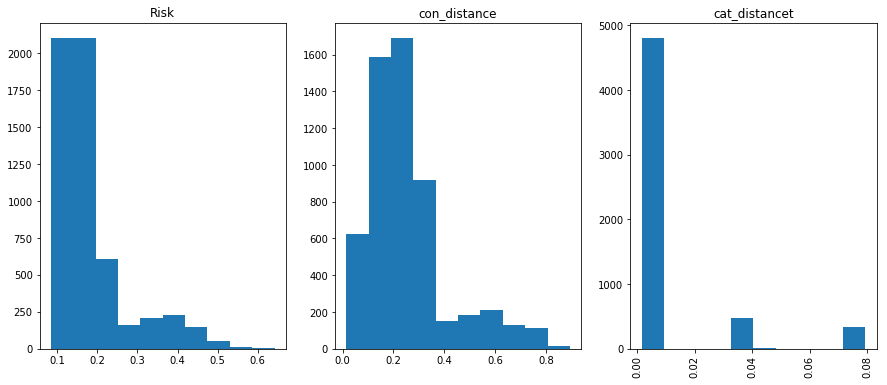

In [2294]:


# Create a figure instance
fig = plt.figure(1, figsize=(15, 6))

# Create an axes instance
ax1 = fig.add_subplot(131)
ax2 = fig.add_subplot(132)
ax3 = fig.add_subplot(133)

# Create the boxplot


ax1.hist(df['Risk'])
ax1.set_title('Risk')

ax2.hist(df['con_distance'])
ax2.set_title('con_distance')

ax3.hist(df['cat_distance'])
ax3.set_title('cat_distancet')

plt.xticks(rotation='vertical')

In [2254]:
%who DataFrame

backup_chng	 backup_chng_newDest	 backup_chng_otherAlerts	 backup_depositmm_df	 backup_df	 backup_rapidmm_df	 cat_df	 con_df	 corr	 
df	 df1	 df2	 df_chng_newdes_final	 df_chng_other_Alerts_final	 df_chng_other_alerts_final	 df_depstmm_final	 df_final	 other_df	 
remained_chng_act_in_income	 temp	 


In [2255]:
backup_rapidmm_df.head()

,Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Scnro Short Nm,Actvy Type Desc Tx,ACCT_TYPE,AGG_XACTN_RISK_NB,BUS_DMN_TX,EXCTN_DATE,TOT_Credit_Amt,TOT_Credit_Count,TOT_Debit_Amt,TOT_Debit_Count,TRANS_AM,TRANS_CT,Days_after_last_Trans
0,1.12874E+11,4065404,2016-04-29,"104,000,001","8,000,181",Rapid Mvmt of Funds,Action Withheld,CUSTOMER,0,Bank and Brokerage,2016-04-18,1118603.81,4,1155000.00,1,1118603.81,5,0
1,1.12874E+11,4084220,2016-05-31,"104,000,001","8,000,181",Rapid Mvmt of Funds,Action Withheld,CUSTOMER,0,Bank and Brokerage,2016-04-18,1109684.49,4,1157400.00,2,1109684.49,6,0
2,10066687033,4187919,2016-10-31,"104,000,001","8,000,181",Rapid Mvmt of Funds,Action Withheld,CUSTOMER,0,Brokerage,2016-09-21,620000.00,2,620000.00,3,620000.00,5,0
3,10066687033,4162221,2016-09-30,"104,000,001","8,000,181",Rapid Mvmt of Funds,Action Withheld,CUSTOMER,0,Brokerage,2016-09-29,660000.00,3,660000.00,4,660000.00,7,8
4,10073288437,4126045,2016-07-29,"104,000,001","8,000,181",Rapid Mvmt of Funds,Action Withheld,CUSTOMER,0,Bank,2016-06-23,804928.74,2,757040.72,4,804928.74,6,0


In [2256]:
df.columns

Index(['Acct ID Anonymized', 'Review Id', 'Actvy Type Desc Tx', 'AGG_XACTN_RISK_NB', 'TOT_Credit_Count', 'TOT_Credit_Amt', 'TOT_Debit_Count', 'TOT_Debit_Amt', 'Days_after_last_Trans', 'ACCT_TYPE__CUSTOMER', 'ACCT_TYPE__EMPLOYEE', 'BUS_DMN_TX__Bank', 'BUS_DMN_TX__Bank and Brokerage', 'BUS_DMN_TX__Brokerage', 'con_neuron', 'con_distance', 'con_act_risk', 'cat_neuron', 'cat_distance', 'cat_act_risk', 'Risk'], dtype='object')

In [2295]:
df_rapidmm_final= pd.merge(backup_rapidmm_df , df[['Review Id','con_neuron', 'con_distance', 'con_act_risk', \
                               'cat_neuron', 'cat_distance', 'cat_act_risk' ,'Risk']] , on = 'Review Id' , how= 'inner')

del backup_rapidmm_df

In [2296]:
df_rapidmm_final.sort_values(by= ['Risk'], ascending = False)

,Acct ID Anonymized,Review Id,Creat Ts,Cntry Id,Pttrn Id,Scnro Short Nm,Actvy Type Desc Tx,ACCT_TYPE,AGG_XACTN_RISK_NB,BUS_DMN_TX,EXCTN_DATE,TOT_Credit_Amt,TOT_Credit_Count,TOT_Debit_Amt,TOT_Debit_Count,TRANS_AM,TRANS_CT,Days_after_last_Trans,con_neuron,con_distance,con_act_risk,cat_neuron,cat_distance,cat_act_risk,Risk
3177,30242639743,4584091,2017-12-29,"104,000,001","8,000,181",Rapid Mvmt of Funds,Action Withheld,CUSTOMER,10,Brokerage,2017-12-29,1.107210e+06,420,1.203946e+06,169,1.107210e+06,589,59,"(7, 8)",0.894232,0.902500,"(0, 0)",0.001532,0.150200,0.642115
2197,23794104219,4434455,2017-09-29,"104,000,001","8,000,181",Rapid Mvmt of Funds,Action Withheld,CUSTOMER,7,Brokerage,2017-09-18,2.709556e+06,89,2.792862e+06,235,2.709556e+06,324,24,"(2, 6)",0.849707,0.634478,"(0, 0)",0.001532,0.150200,0.588598
2194,23794104219,4370298,2017-06-30,"104,000,001","8,000,181",Rapid Mvmt of Funds,Action Withheld,CUSTOMER,7,Brokerage,2017-06-29,3.256806e+06,96,3.023938e+06,231,3.256806e+06,327,43,"(2, 6)",0.849707,0.634478,"(0, 0)",0.001532,0.150200,0.588598
2188,23794104219,4187962,2016-10-31,"104,000,001","8,000,181",Rapid Mvmt of Funds,Action Withheld,CUSTOMER,7,Brokerage,2016-10-04,2.684558e+06,103,2.722591e+06,223,2.684558e+06,326,78,"(2, 6)",0.849707,0.634478,"(0, 0)",0.001532,0.150200,0.588598
2191,23794104219,4298180,2017-03-31,"104,000,001","8,000,181",Rapid Mvmt of Funds,Action Withheld,CUSTOMER,7,Brokerage,2017-02-22,2.737698e+06,86,2.902396e+06,234,2.737698e+06,320,35,"(2, 6)",0.849707,0.634478,"(0, 0)",0.001532,0.150200,0.588598
2198,23794104219,4532941,2017-10-31,"104,000,001","8,000,181",Rapid Mvmt of Funds,Action Withheld,CUSTOMER,7,Brokerage,2017-10-11,2.704220e+06,93,2.578452e+06,231,2.704220e+06,324,23,"(2, 6)",0.849707,0.634478,"(0, 0)",0.001532,0.150200,0.588598
2193,23794104219,4347427,2017-05-31,"104,000,001","8,000,181",Rapid Mvmt of Funds,Action Withheld,CUSTOMER,7,Brokerage,2017-05-17,2.886024e+06,94,2.862182e+06,232,2.886024e+06,326,30,"(2, 6)",0.849707,0.634478,"(0, 0)",0.001532,0.150200,0.588598
2186,23794104219,4106733,2016-06-30,"104,000,001","8,000,181",Rapid Mvmt of Funds,Action Withheld,CUSTOMER,7,Brokerage,2016-05-18,2.391040e+06,98,2.592104e+06,214,2.391040e+06,312,19,"(1, 6)",0.831488,0.634386,"(0, 0)",0.001532,0.150200,0.577658
2190,23794104219,4269751,2017-02-28,"104,000,001","8,000,181",Rapid Mvmt of Funds,Action Withheld,CUSTOMER,7,Brokerage,2017-01-18,2.612330e+06,77,2.949337e+06,209,2.612330e+06,286,61,"(1, 6)",0.831488,0.634386,"(0, 0)",0.001532,0.150200,0.577658
2192,23794104219,4317614,2017-04-28,"104,000,001","8,000,181",Rapid Mvmt of Funds,Action Withheld,CUSTOMER,7,Brokerage,2017-04-17,3.069693e+06,90,3.105656e+06,211,3.069693e+06,301,54,"(1, 6)",0.831488,0.634386,"(0, 0)",0.001532,0.150200,0.577658


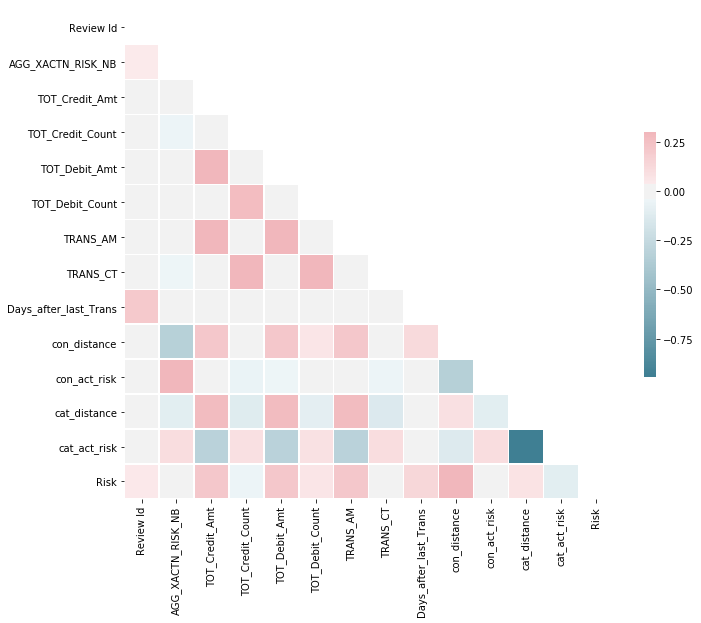

In [2297]:
# Compute the correlation matrix
corr = df_rapidmm_final.corr()

# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

In [2298]:
df_rapidmm_final['ACCT_TYPE'].value_counts()

CUSTOMER    5596
EMPLOYEE      17
Name: ACCT_TYPE, dtype: int64

In [2299]:
from scipy import stats
F, p = stats.f_oneway(df_rapidmm_final[df_rapidmm_final['ACCT_TYPE']=='CUSTOMER'].Risk,
                      df_rapidmm_final[df_rapidmm_final['ACCT_TYPE']=='EMPLOYEE'].Risk)
F , p

(0.020469955902945588, 0.8862374655208373)

In [2303]:
%who DataFrame

df_chng_newdes_final	 df_chng_other_Alerts_final	 df_chng_other_alerts_final	 df_depstmm_final	 df_final	 df_rapidmm_final	 


In [2375]:
count_review_id= df_final.groupby(['Acct ID Anonymized'])['Risk'].agg('count').to_frame()
count_review_id.rename(columns={'Risk': 'count'}, inplace=True)
max_risk_acct_id=df_final.groupby(['Acct ID Anonymized'])['Risk'].agg('max').to_frame()
max_risk_acct_id.rename(columns={'Risk': 'max'}, inplace=True)
sum_risk_acct_id=df_final.groupby(['Acct ID Anonymized'])['Risk'].agg('sum').to_frame()
sum_risk_acct_id.rename(columns={'Risk': 'sum'}, inplace=True)
sum_risk_acct_id

,sum
Acct ID Anonymized,
1.14607E+11,0.183073
1.18666E+11,0.034143
1.20901E+17,0.349833
1.32682E+11,0.046523
1.33572E+11,0.109480
1.52284E+17,0.658393
1.53246E+11,0.083237
1.6601E+18,0.452872
1.69947E+11,0.186756


In [2376]:
data_frames=[count_review_id, max_risk_acct_id , sum_risk_acct_id]

Final_Risk_Income = reduce(lambda  left,right: pd.merge(left,right,on=['Acct ID Anonymized'],
                                            how='outer'), data_frames)

Final_Risk_Income.head()

,count,max,sum
Acct ID Anonymized,,,
1.14607E+11,1,0.183073,0.183073
1.18666E+11,1,0.034143,0.034143
1.20901E+17,1,0.349833,0.349833
1.32682E+11,1,0.046523,0.046523
1.33572E+11,1,0.109480,0.109480


In [2380]:
Final_Risk_Income['Agg_Risk'] = ((Final_Risk_Income['sum']-Final_Risk_Income['max'])/  \
(Final_Risk_Income['count']))*(1-Final_Risk_Income['max']) + Final_Risk_Income['max']

Final_Risk_Income.sort_values(by = 'max', ascending= False)

,count,max,sum,Agg_Risk
Acct ID Anonymized,,,,
20669680188,10,0.723107,3.758985,0.807168
21372954268,10,0.715868,3.844191,0.804754
16323717864,12,0.704204,4.272646,0.792165
13001760353,5,0.697762,2.439774,0.803062
34406994818,4,0.694544,2.215130,0.810662
75975991563,5,0.683178,2.186595,0.778441
20776646443,6,0.678299,3.068489,0.806453
58337000299,7,0.673678,3.752810,0.817219
92475307858,2,0.672536,0.706679,0.678127


In [2361]:
Final_Incoming=df_final.groupby(['Acct ID Anonymized'])['Risk'].agg('max').to_frame()
Final_Incoming.rename(columns={'Risk': 'Incoming_Risk'}, inplace=True)
Final_Incoming=Final_Incoming.reset_index()

Final_Incoming.head()

,Acct ID Anonymized,Incoming_Risk
0,1.14607E+11,0.183073
1,1.18666E+11,0.034143
2,1.20901E+17,0.349833
3,1.32682E+11,0.046523
4,1.33572E+11,0.109480


In [2362]:
Final_Change_NewDestination=df_chng_newdes_final.groupby(['Acct ID Anonymized'])['Risk'].agg('max').to_frame()
Final_Change_NewDestination.rename(columns={'Risk': 'New_Destibation_Risk'}, inplace=True)
Final_Change_NewDestination=Final_Change_NewDestination.reset_index()

Final_Change_NewDestination.head()

,Acct ID Anonymized,New_Destibation_Risk
0,1.21987E+17,0.065749
1,1.6878E+109,0.065749
2,10000067881,0.097319
3,10003261434,0.108850
4,10007636795,0.097319


In [2363]:
Final_Change_Behaviour=df_chng_other_Alerts_final.groupby(['Acct ID Anonymized'])['Risk'].agg('max').to_frame()
Final_Change_Behaviour.rename(columns={'Risk': 'Change_behaviour_Risk'}, inplace=True)
Final_Change_Behaviour=Final_Change_Behaviour.reset_index()

Final_Change_Behaviour.head()

,Acct ID Anonymized,Change_behaviour_Risk
0,1.41138E+17,0.235279
1,1.63045E+11,0.103058
2,1.76192E+26,0.325470
3,10001463480,0.073646
4,10001557217,0.141737


In [2364]:
Final_Desposit_Mixed=df_depstmm_final.groupby(['Acct ID Anonymized'])['Risk'].agg('max').to_frame()
Final_Desposit_Mixed.rename(columns={'Risk': 'Deposit_Mixed_Risk'}, inplace=True)
Final_Desposit_Mixed=Final_Desposit_Mixed.reset_index()

Final_Desposit_Mixed.head()

,Acct ID Anonymized,Deposit_Mixed_Risk
0,10224727204,0.149988
1,10237889786,0.149988
2,10287750317,0.149988
3,10322793093,0.211510
4,10428977064,0.149988


In [2365]:
Final_Rapid_Movement=df_rapidmm_final.groupby(['Acct ID Anonymized'])['Risk'].agg('max').to_frame()
Final_Rapid_Movement.rename(columns={'Risk': 'Rapid_Move_Risk'}, inplace=True)
Final_Rapid_Movement=Final_Rapid_Movement.reset_index()

Final_Rapid_Movement.head()

,Acct ID Anonymized,Rapid_Move_Risk
0,1.12874E+11,0.210622
1,10066687033,0.335087
2,10073288437,0.339515
3,10077025743,0.104756
4,10077605847,0.124564


In [2366]:
data_frames=[Final_Incoming, Final_Change_NewDestination , Final_Change_Behaviour , \
            Final_Desposit_Mixed , Final_Rapid_Movement]

Final_Risk = reduce(lambda  left,right: pd.merge(left,right,on=['Acct ID Anonymized'],
                                            how='outer'), data_frames)

Final_Risk.head()

,Acct ID Anonymized,Incoming_Risk,New_Destibation_Risk,Change_behaviour_Risk,Deposit_Mixed_Risk,Rapid_Move_Risk
0,1.14607E+11,0.183073,NaN,NaN,NaN,NaN
1,1.18666E+11,0.034143,NaN,NaN,NaN,NaN
2,1.20901E+17,0.349833,NaN,NaN,NaN,NaN
3,1.32682E+11,0.046523,NaN,NaN,NaN,NaN
4,1.33572E+11,0.109480,NaN,NaN,NaN,NaN


In [2367]:
Final_Risk.corr()

,Incoming_Risk,New_Destibation_Risk,Change_behaviour_Risk,Deposit_Mixed_Risk,Rapid_Move_Risk
Incoming_Risk,1.000000,-0.020260,0.121219,0.030139,0.157623
New_Destibation_Risk,-0.020260,1.000000,0.311921,0.436711,0.046097
Change_behaviour_Risk,0.121219,0.311921,1.000000,0.264392,0.293706
Deposit_Mixed_Risk,0.030139,0.436711,0.264392,1.000000,0.280047
Rapid_Move_Risk,0.157623,0.046097,0.293706,0.280047,1.000000


In [2368]:
report_df=Final_Risk.describe()
report_df

,Incoming_Risk,New_Destibation_Risk,Change_behaviour_Risk,Deposit_Mixed_Risk,Rapid_Move_Risk
count,35421.000000,8447.000000,15894.000000,10051.000000,1563.000000
mean,0.180009,0.088548,0.211208,0.137894,0.196989
std,0.122412,0.095908,0.133583,0.137010,0.115703
min,0.027903,0.034810,0.037987,0.011779,0.083853
25%,0.071206,0.054859,0.106344,0.049298,0.104756
50%,0.161315,0.065749,0.175594,0.118547,0.162732
75%,0.279865,0.089813,0.274300,0.149988,0.214004
max,0.723107,0.657888,0.762046,0.610205,0.642115


In [2369]:
100 * report_df.loc['50%' , :] / sum (report_df.loc['50%' , :])

Incoming_Risk            23.586204
New_Destibation_Risk      9.613342
Change_behaviour_Risk    25.674000
Deposit_Mixed_Risk       17.333070
Rapid_Move_Risk          23.793383
Name: 50%, dtype: float64